<a href="https://colab.research.google.com/github/samarranjit/Yield_Prediction/blob/main/Deep_Learning_Techniques/MultiCNN_Model_30m.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importing the dataset

In [ ]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.preprocessing import RobustScaler

In [ ]:
import fastparquet

In [ ]:
ls

data/                                            learning_curves.png
Dense_Neural_Network_For_Yield_Prediction.ipynb  metrics_comparison.png
dnn_model_tuned_best.keras                       pca_variables/
error_distribution.png                           predictions_analysis.png
feature_importance.png                           scaler_X.pkl
final_soybean_yield_model.h5                     scaler_y.pkl
hyperparam_tuning/                               soybean_yield_dnn_best.h5
hyperparam_tuning_layers_only/                   soybean_yield_dnn_best.keras


In [ ]:
!nvidia-smi

import torch

if torch.cuda.is_available():
    print(f"✅ GPU Detected: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB")
else:
    print("❌ No GPU detected. Running on CPU.")

Wed Dec 31 00:10:35 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.95.05              Driver Version: 580.95.05      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Quadro RTX 8000                Off |   00000000:73:00.0 Off |                  Off |
| 33%   33C    P8             18W /  260W |   28859MiB /  49152MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
soy_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/Data/df_soybeans_absolute_all_years_with_divided_precipitation.parquet"
corn_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/Data/df_corn_absolute_all_years_with_divided_precipitation.parquet"
wheat_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/Data/df_wheat_absolute_all_years_with_divided_precipitation2.parquet"
# soy_fn = r"data/df_soybeans_absolute_all_years_with_divided_precipitation.parquet"
# corn_fn = r"data/df_corn_absolute_all_years_with_divided_precipitation.parquet"
# wheat_fn = r"data/df_wheat_absolute_all_years_with_divided_precipitation2.parquet"

# 30m Resolution Dataset:
soy_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/datafiles/Soybeans_30m.parquet"
corn_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/datafiles/Corn_30m.parquet"
wheat_fn = r"/content/drive/MyDrive/Colab Notebooks/Data For Yield Prediction/30mdatasets/datafiles/Wheat_30m.parquet"

# 30m Resolution Dataset: on local computer:
soy_fn = r"data/30m_resolution_data/Soybeans_30m.parquet"
corn_fn = r"data/30m_resolution_data/Corn_30m.parquet"
wheat_fn = r"data/30m_resolution_data/Wheat_30m.parquet"

df_soybeans = pd.read_parquet(soy_fn)
df_corn = pd.read_parquet(corn_fn)
df_wheat = pd.read_parquet(wheat_fn)

print(df_soybeans.describe())
print(df_corn.describe())
print(df_wheat.describe())

        system:index       EVI_max      EVI_mean     EVI_range        GI_max  \
count   29155.000000  29155.000000  29155.000000  29155.000000  29155.000000   
mean    53355.369062      0.763740      0.402766      0.600085      9.926785   
std     33269.563783      0.137252      0.065846      0.170717      6.123224   
min         0.000000      0.306699      0.179362      0.018543      2.723933   
25%     26690.500000      0.666043      0.358767      0.474305      7.512075   
50%     49804.000000      0.767753      0.401216      0.609831      9.524706   
75%     79637.500000      0.865206      0.445963      0.731490     11.801668   
max    115388.000000      1.125188      0.737935      1.040805    515.000000   

            GI_mean      GI_range       LST_max    LST_median     LST_range  \
count  29155.000000  29155.000000  29155.000000  29155.000000  29155.000000   
mean       4.571339      7.611108    311.535436    295.099431    108.722587   
std        0.856478      8.874654      4.0

In [ ]:
df_soybeans.describe()

,system:index,EVI_max,EVI_mean,EVI_range,GI_max,GI_mean,GI_range,LST_max,LST_median,LST_range,...,longitude,x_m,y_m,elevation,slope,aspect,yield_mean,yield_std,yield_count,year
count,29155.000000,29155.000000,29155.000000,29155.000000,29155.000000,29155.000000,29155.000000,29155.000000,29155.000000,29155.000000,...,29155.000000,29155.000000,2.915500e+04,29151.000000,29151.000000,29151.000000,29155.000000,28378.000000,29155.000000,29155.000000
mean,53355.369062,0.763740,0.402766,0.600085,9.926785,4.571339,7.611108,311.535436,295.099431,108.722587,...,-76.879900,337269.099081,4.321314e+06,38.420944,2.147900,195.036087,45.559661,2.693883,20.430458,2019.156886
std,33269.563783,0.137252,0.065846,0.170717,6.123224,0.856478,8.874654,4.028256,4.425436,44.628719,...,0.030646,2650.466935,8.636466e+02,7.268361,1.884947,101.013565,16.815314,1.929862,9.353620,2.961418
min,0.000000,0.306699,0.179362,0.018543,2.723933,-13.138811,0.008142,301.819670,279.294920,29.394972,...,-76.953230,330887.851448,4.318618e+06,0.000000,0.038151,0.005610,5.756621,0.002762,1.000000,2014.000000
25%,26690.500000,0.666043,0.358767,0.474305,7.512075,3.981608,4.919584,308.835175,292.098820,71.298190,...,-76.894220,336044.715830,4.320605e+06,32.914455,1.083414,115.829330,33.348166,1.315939,13.000000,2017.000000
50%,49804.000000,0.767753,0.401216,0.609831,9.524706,4.503151,7.113819,310.921880,295.520260,92.095130,...,-76.884780,336858.143053,4.321327e+06,38.259205,1.860776,205.261414,45.436421,2.211411,24.000000,2019.000000
75%,79637.500000,0.865206,0.445963,0.731490,11.801668,5.096135,9.573671,313.692170,298.104280,159.573680,...,-76.858100,339164.615973,4.321937e+06,42.916641,2.858183,282.087250,57.780476,3.563477,29.000000,2022.000000
max,115388.000000,1.125188,0.737935,1.040805,515.000000,20.022684,723.020200,327.755600,305.292400,177.754140,...,-76.816605,342734.534740,4.323242e+06,80.460846,55.810223,359.945587,108.305772,25.299539,47.000000,2024.000000


### Clearning for 30m resolution datasets



In [ ]:
df = df_wheat.copy()
df.shape

(8387, 50)

In [ ]:
df.drop(columns=['system:index','latitude', 'longitude', '.geo',
       'x_m', 'y_m', 'yield_std',
       'yield_count',  ], inplace= True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29155 entries, 0 to 29154
Data columns (total 42 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   EVI_max          29155 non-null  float64
 1   EVI_mean         29155 non-null  float64
 2   EVI_range        29155 non-null  float64
 3   GI_max           29155 non-null  float64
 4   GI_mean          29155 non-null  float64
 5   GI_range         29155 non-null  float64
 6   LST_max          29155 non-null  float64
 7   LST_median       29155 non-null  float64
 8   LST_range        29155 non-null  float64
 9   NDVI_max         29155 non-null  float64
 10  NDVI_mean        29155 non-null  float64
 11  NDVI_range       29155 non-null  float64
 12  NDWI_max         29155 non-null  float64
 13  NDWI_mean        29155 non-null  float64
 14  NDWI_range       29155 non-null  float64
 15  Precip_Max_mm    29155 non-null  float64
 16  Precip_Mean_mm   29155 non-null  float64
 17  Precip_Total

EVI_max


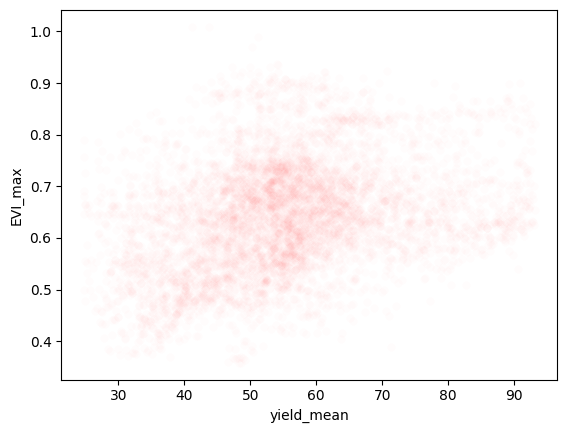

#############################################################################
EVI_mean


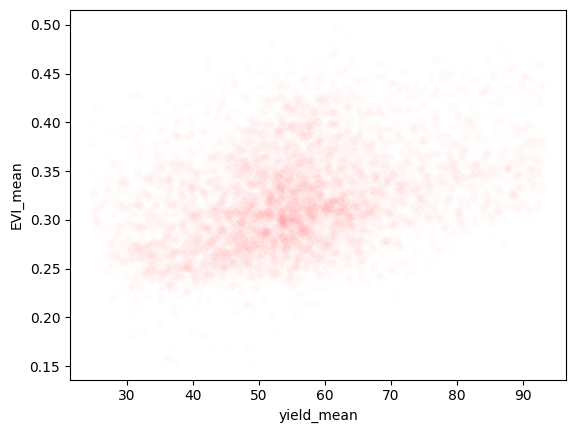

#############################################################################
EVI_range


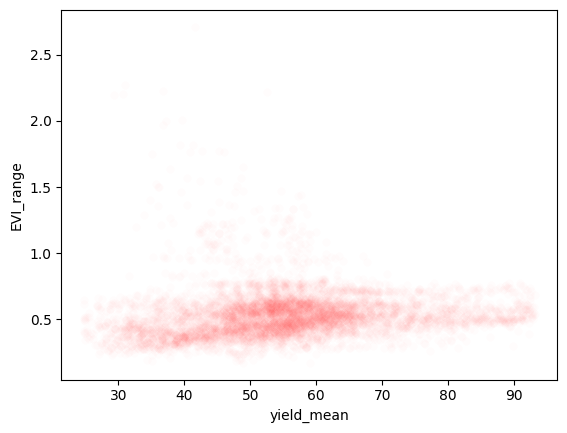

#############################################################################
GI_max


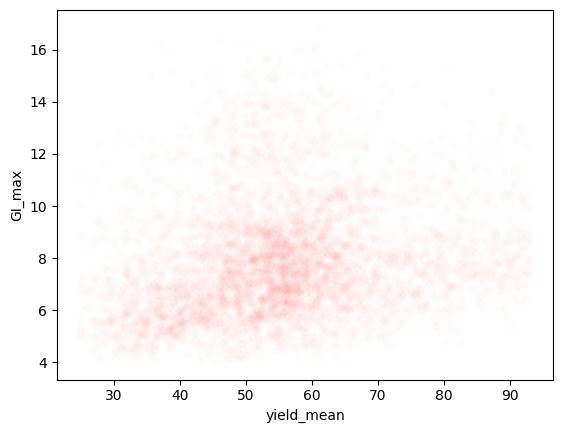

#############################################################################
GI_mean


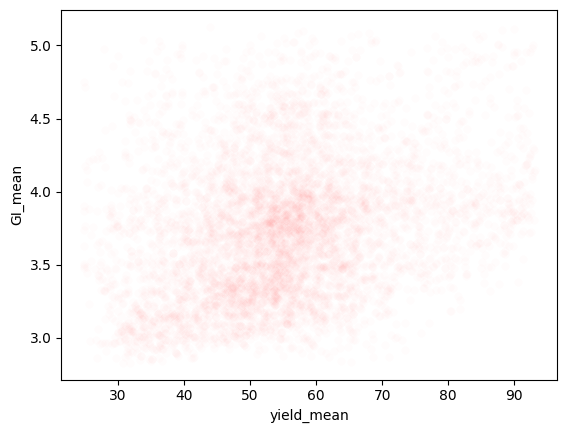

#############################################################################
GI_range


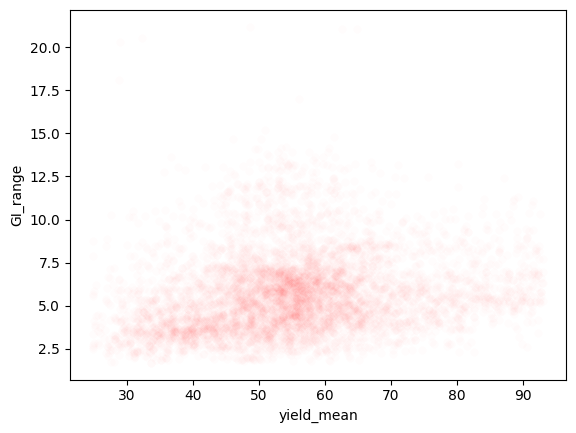

#############################################################################
LST_max


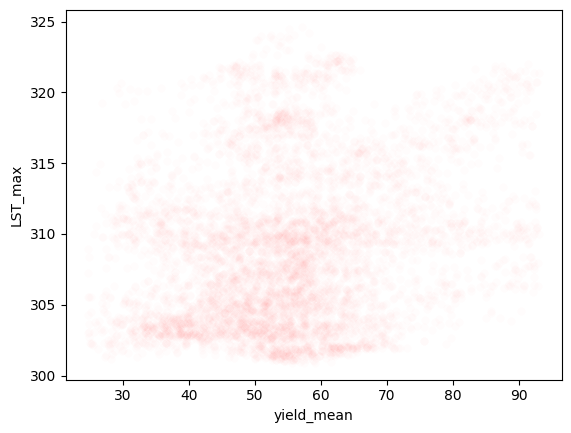

#############################################################################
LST_median


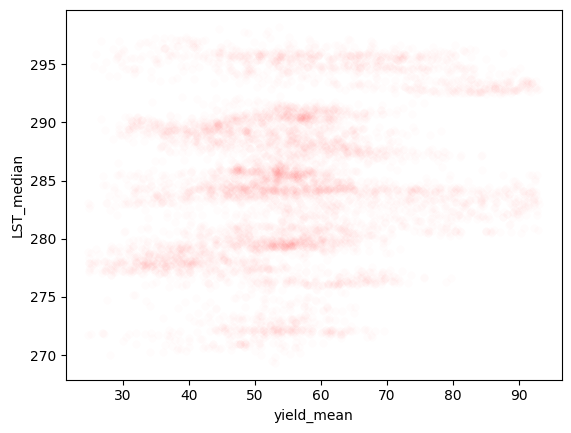

#############################################################################
LST_range


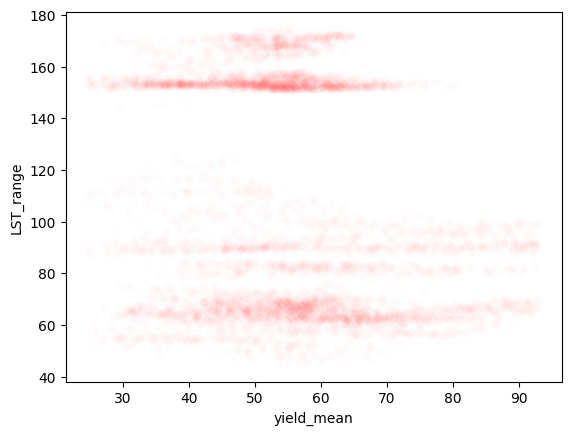

#############################################################################
NDVI_max


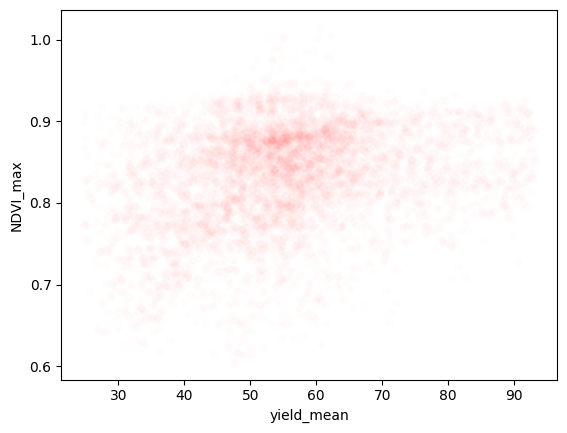

#############################################################################
NDVI_mean


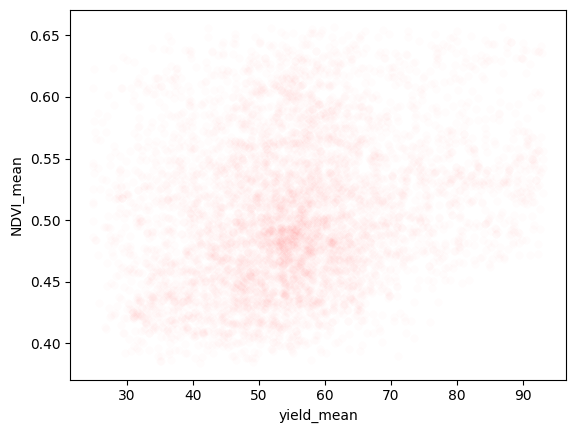

#############################################################################
NDVI_range


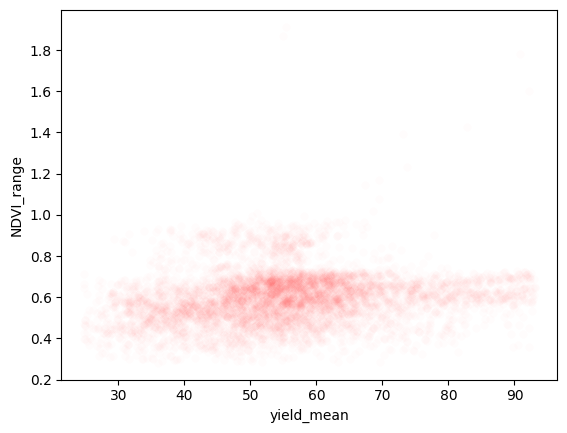

#############################################################################
NDWI_max


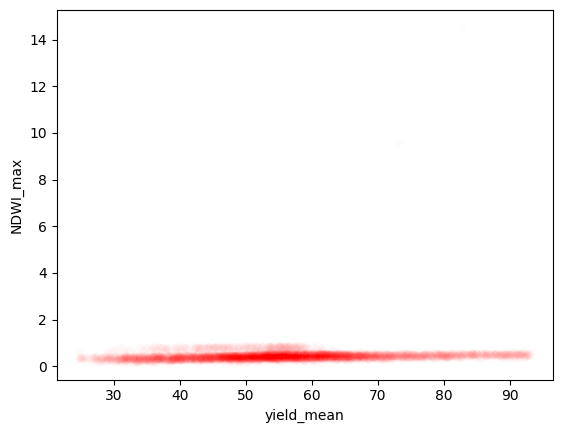

#############################################################################
NDWI_mean


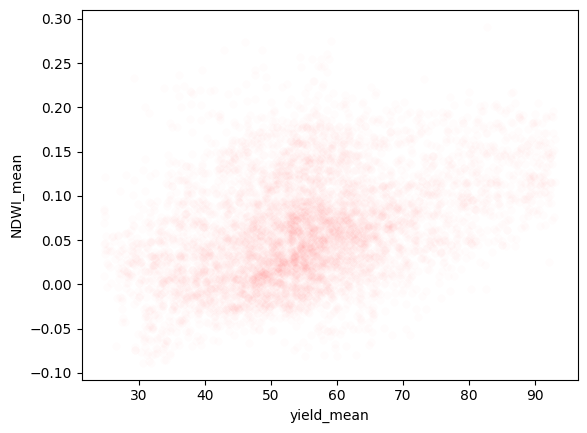

#############################################################################
NDWI_range


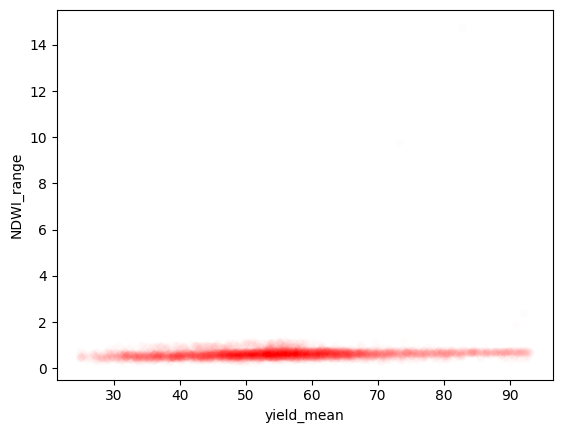

#############################################################################
Precip_Max_mm


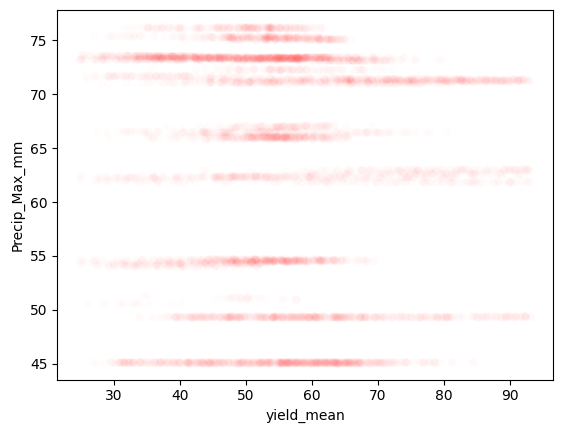

#############################################################################
Precip_Mean_mm


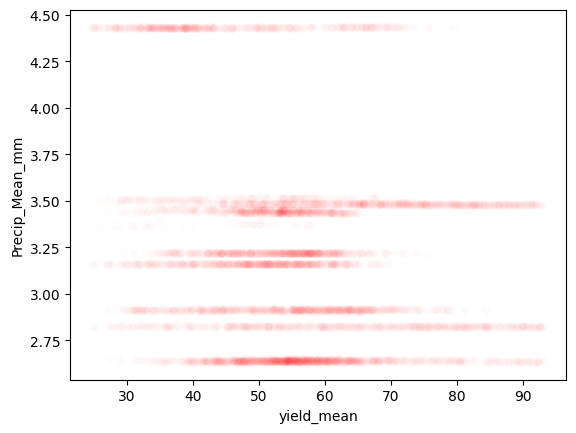

#############################################################################
Precip_Total_mm


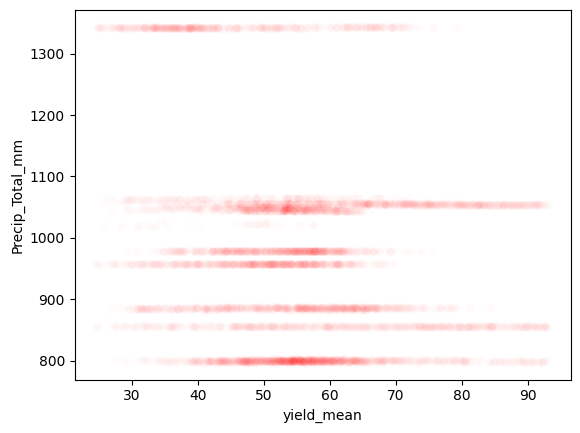

#############################################################################
Soil_Alpha


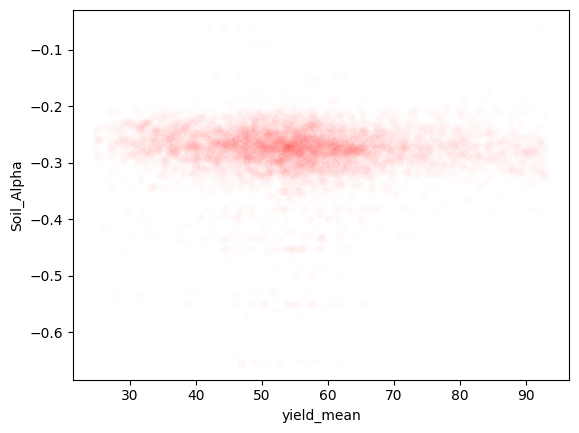

#############################################################################
Soil_BD


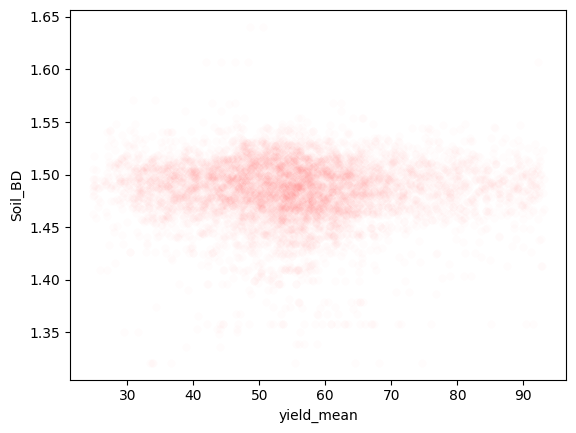

#############################################################################
Soil_Clay


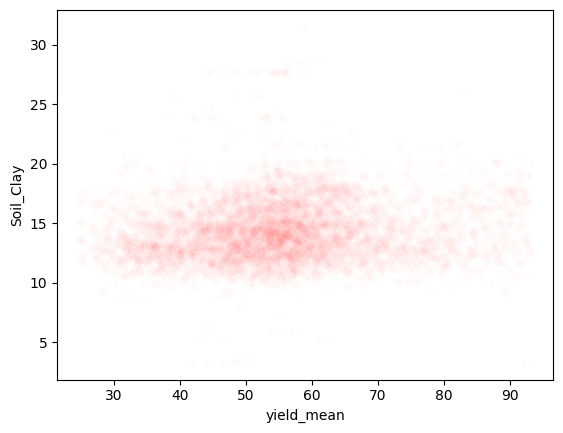

#############################################################################
Soil_Ksat


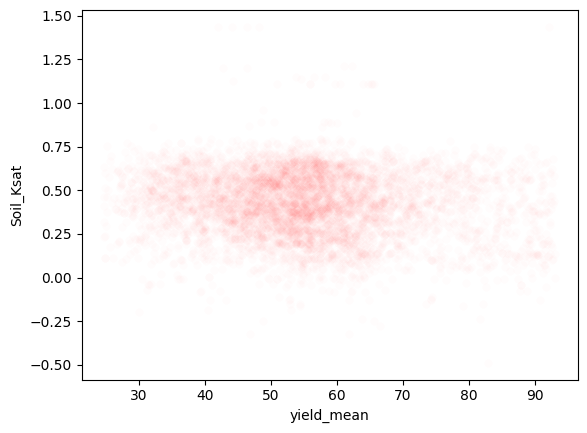

#############################################################################
Soil_Lambda


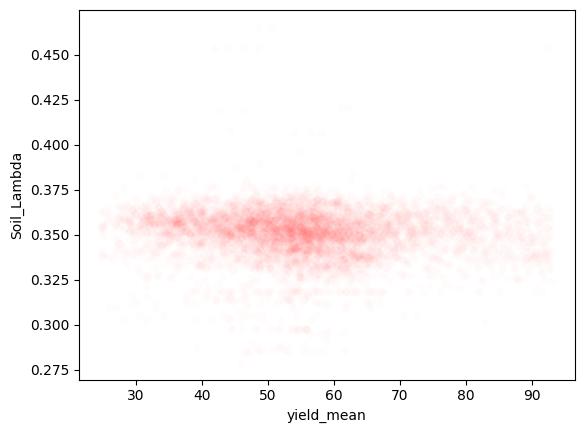

#############################################################################
Soil_N


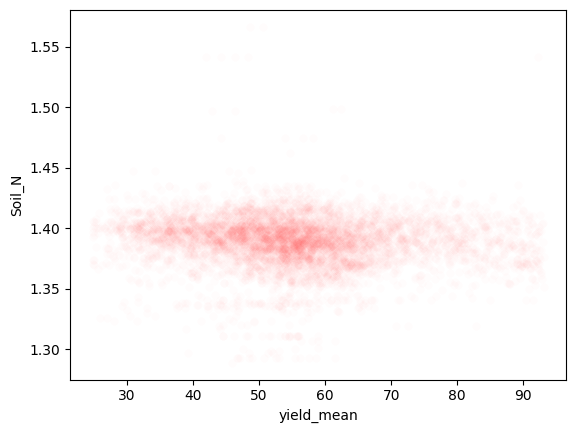

#############################################################################
Soil_OM


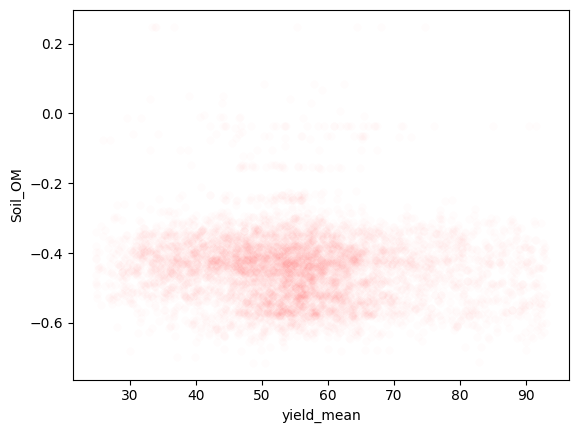

#############################################################################
Soil_Sand


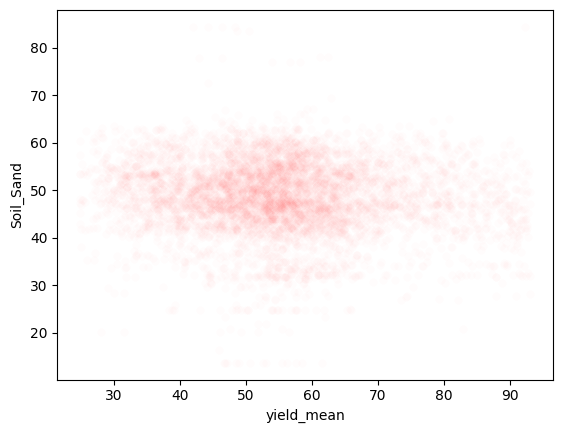

#############################################################################
Soil_Silt


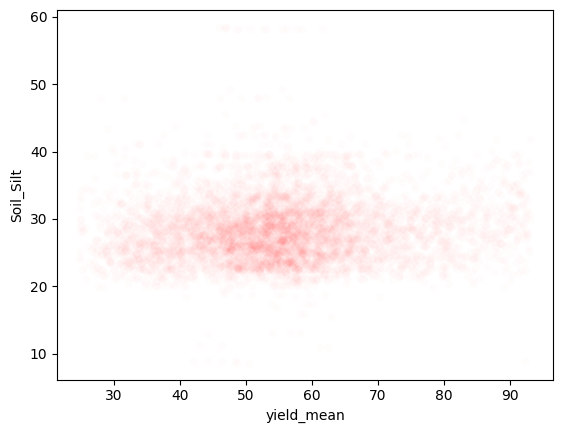

#############################################################################
Soil_Theta_R


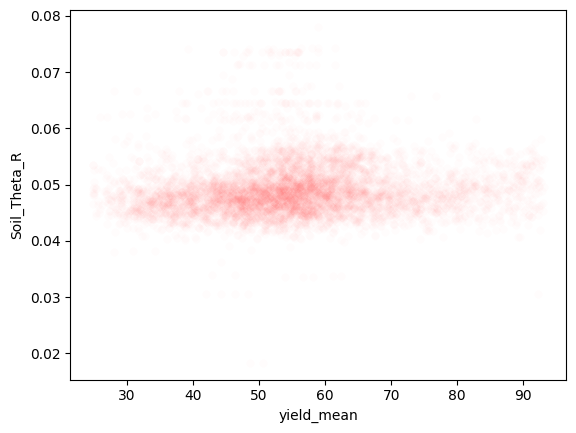

#############################################################################
Soil_Theta_S


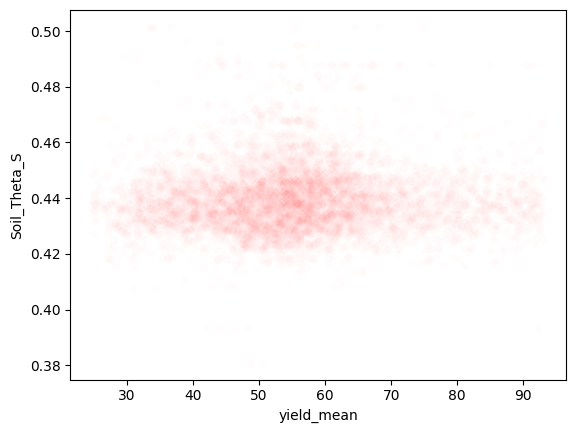

#############################################################################
Soil_pH


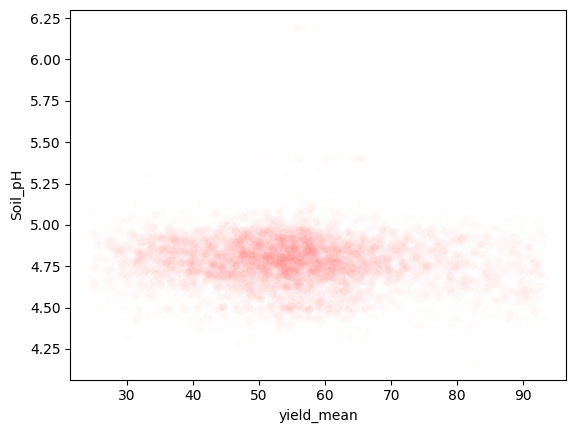

#############################################################################
Tr_SWIR1_max


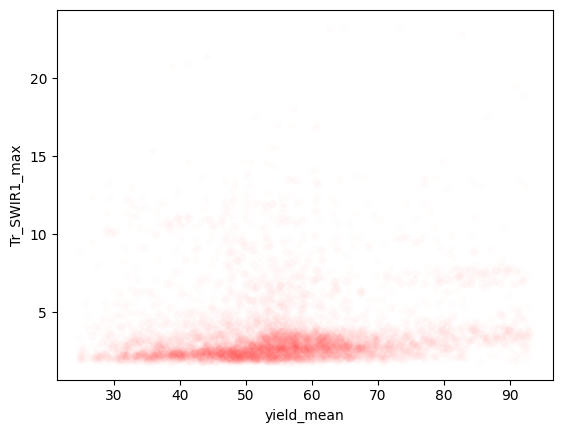

#############################################################################
Tr_SWIR1_mean


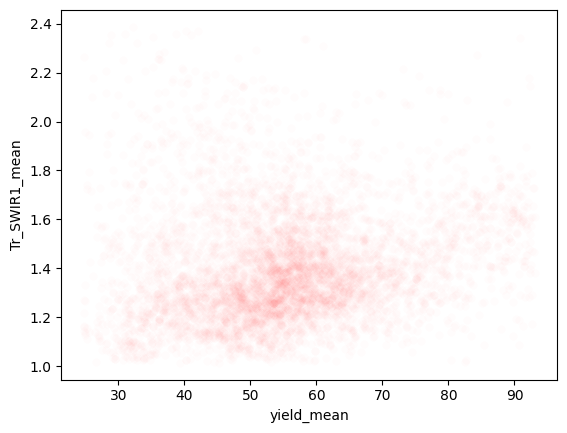

#############################################################################
Tr_SWIR1_range


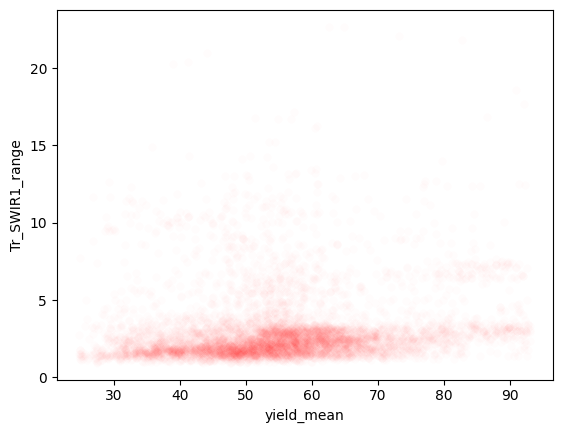

#############################################################################
Tr_SWIR2_max


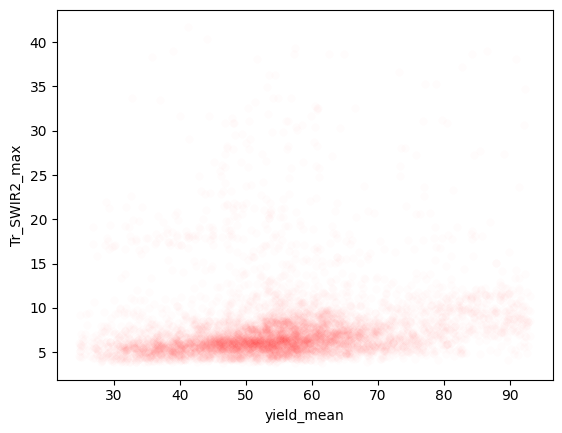

#############################################################################
Tr_SWIR2_mean


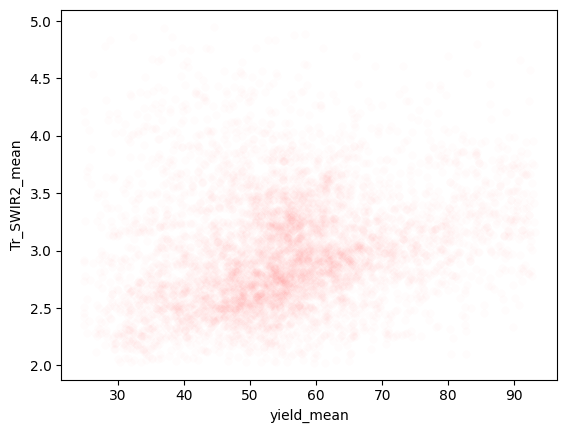

#############################################################################
Tr_SWIR2_range


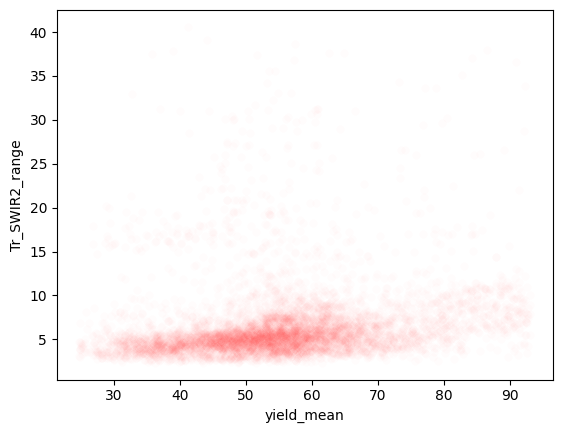

#############################################################################
elevation


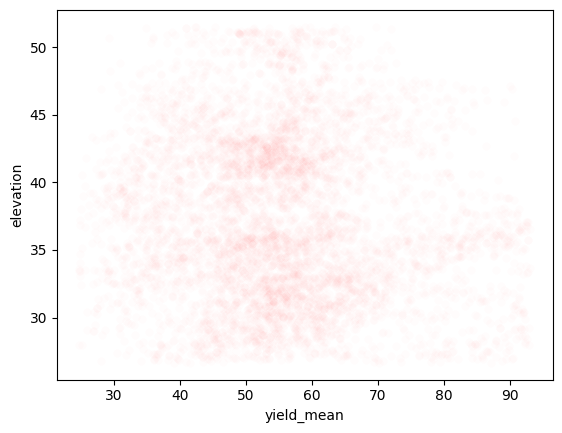

#############################################################################
slope


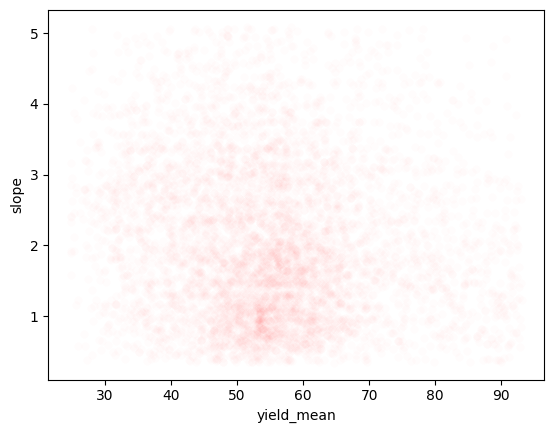

#############################################################################
aspect


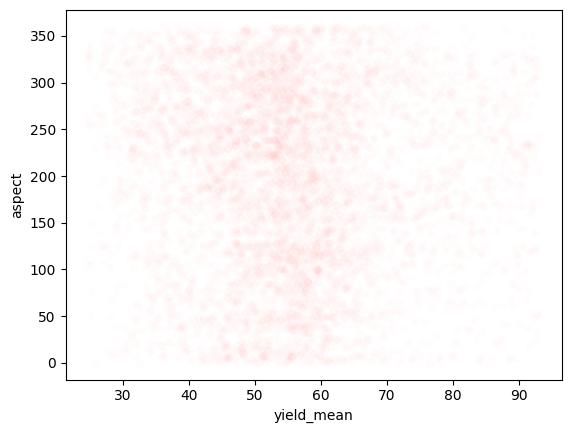

#############################################################################
yield_mean


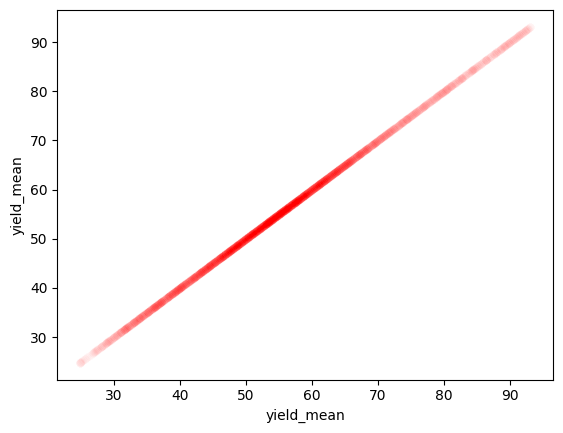

#############################################################################
year


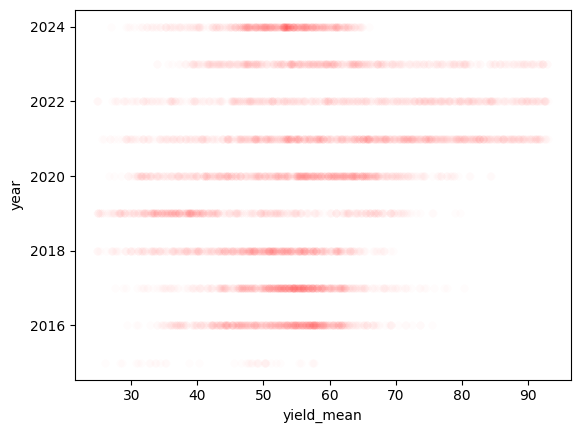

#############################################################################
field


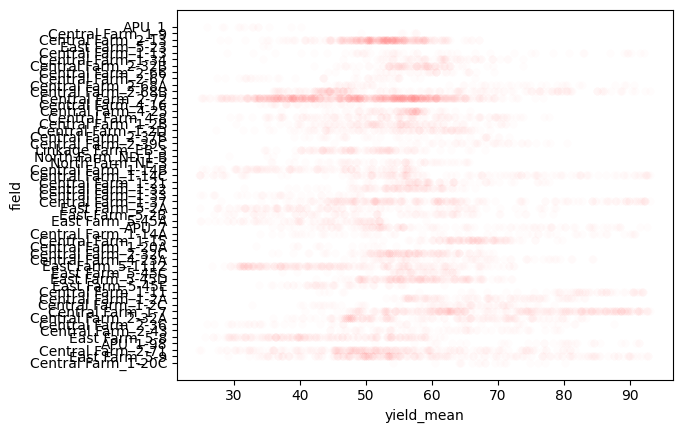

#############################################################################


In [ ]:
for key in df.keys():
  print(key)
  sns.scatterplot(data=df, x='yield_mean', y=key, color= "red", alpha = 0.01)
  plt.show()
  print("#############################################################################")


In [ ]:
df.shape


(8387, 42)

In [ ]:
import numpy as np

YIELD_COL = "yield_mean"
TAIL = 0.02  # 2% tails

EXCLUDE_COLS = {
    'year', 'field', YIELD_COL
}

# -------------------------
# Step 1) Trim extreme 2% of yield (both tails)
# -------------------------
y_lo = df[YIELD_COL].quantile(TAIL)
y_hi = df[YIELD_COL].quantile(1 - TAIL)

mask_yield_ok = df[YIELD_COL].between(y_lo, y_hi)
df = df.loc[mask_yield_ok].copy()

# -------------------------
# Step 2) One-shot trim extremes (2% tails) for ALL numeric features
# -------------------------
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()
feature_cols = [
    "GI_max", "GI_mean", "GI_range",
    "NDVI_max", "NDVI_mean", "NDVI_range",
    # "NDWI_max", "NDWI_mean", "NDWI_range",
    # "EVI_max", "EVI_mean", "EVI_range",
    # 'Soil_Alpha',
    #    'Soil_BD', 'Soil_Clay', 'Soil_Ksat', 'Soil_Lambda', 'Soil_N', 'Soil_OM',
    #    'Soil_Sand', 'Soil_Silt', 'Soil_Theta_R', 'Soil_Theta_S', 'Soil_pH',
       'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',
       'Tr_SWIR2_mean', 'Tr_SWIR2_range',
    'slope', 'elevation'
]

feature_cols = [
    "NDVI_max", "NDVI_mean", "NDVI_range",
    "NDWI_max", "NDWI_mean", "NDWI_range",
    "EVI_max", "EVI_mean", "EVI_range",
    'Tr_SWIR1_max',  'Tr_SWIR1_range', 'Tr_SWIR2_max','Tr_SWIR2_range',]
#
# If you want to ignore columns with all-NaN or near-constant behavior:
feature_cols = [c for c in feature_cols if df[c].notna().any()]

q_low  = df[feature_cols].quantile(TAIL)
q_high = df[feature_cols].quantile(1 - TAIL)

low_extreme  = df[feature_cols].lt(q_low, axis="columns")
high_extreme = df[feature_cols].gt(q_high, axis="columns")

# (Optional but recommended) treat NaN in any feature as "bad row"
any_missing = df[feature_cols].isna().any(axis=1)

any_extreme = (low_extreme | high_extreme).any(axis=1)

df = df.loc[~(any_extreme | any_missing)].copy()

print("df updated.")
print("Final rows:", len(df))
print("Removed due to extremes:", int(any_extreme.sum()))
print("Removed due to missing:", int(any_missing.sum()))


df updated.
Final rows: 4241
Removed due to extremes: 1401
Removed due to missing: 0


## Visualizing dataset

<Axes: xlabel='yield_mean', ylabel='Density'>

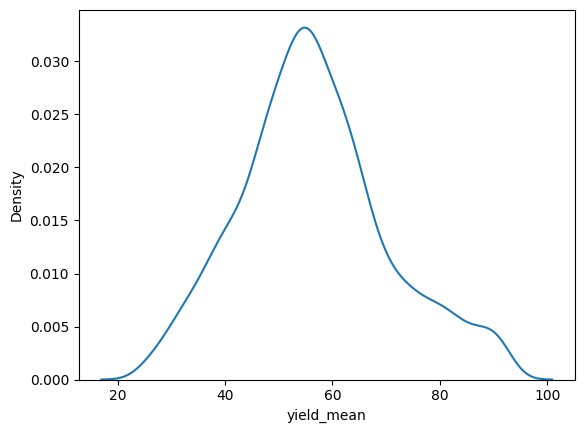

In [ ]:
sns.kdeplot(data=df, x="yield_mean")

## Data Preparation

In [ ]:
df.keys()


Index(['EVI_max', 'EVI_mean', 'EVI_range', 'GI_max', 'GI_mean', 'GI_range',
       'LST_max', 'LST_median', 'LST_range', 'NDVI_max', 'NDVI_mean',
       'NDVI_range', 'NDWI_max', 'NDWI_mean', 'NDWI_range', 'Precip_Max_mm',
       'Precip_Mean_mm', 'Precip_Total_mm', 'Soil_Alpha', 'Soil_BD',
       'Soil_Clay', 'Soil_Ksat', 'Soil_Lambda', 'Soil_N', 'Soil_OM',
       'Soil_Sand', 'Soil_Silt', 'Soil_Theta_R', 'Soil_Theta_S', 'Soil_pH',
       'Tr_SWIR1_max', 'Tr_SWIR1_mean', 'Tr_SWIR1_range', 'Tr_SWIR2_max',
       'Tr_SWIR2_mean', 'Tr_SWIR2_range', 'elevation', 'slope', 'aspect',
       'yield_mean', 'year', 'field'],
      dtype='object')

In [ ]:
df.shape

(11396, 42)

# Pytorch Model

###importing necessary libraries


In [ ]:
import numpy as np
import pandas as pd
import math
import random
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import ParameterSampler

import matplotlib.pyplot as plt

In [ ]:
# ---------------------------
# Reproducibility
# ---------------------------
def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


### defining the split

In [ ]:
# ---------------------------
# Year-based split (NO leakage)
# ---------------------------
VAL_YEARS  = {2015, 2016, 2022}
TEST_YEARS = {2017}

In [ ]:
def split_by_year(df: pd.DataFrame):
    train_df = df[~df["year"].isin(VAL_YEARS.union(TEST_YEARS))].copy()
    val_df   = df[df["year"].isin(VAL_YEARS)].copy()
    test_df  = df[df["year"].isin(TEST_YEARS)].copy()

    print("Train years:", sorted(train_df["year"].unique()))
    print("Val years:", sorted(val_df["year"].unique()))
    print("Test years:", sorted(test_df["year"].unique()))
    print("Shapes:", train_df.shape, val_df.shape, test_df.shape)
    return train_df, val_df, test_df


In [ ]:
def get_feature_order(cols: List[str]) -> List[str]:
    # Domain groups (you can tweak this later)
    veg = ["NDVI_mean","NDVI_max","NDVI_range",
           "EVI_mean","EVI_max","EVI_range",
           "GI_mean","GI_max","GI_range",
           "NDWI_mean","NDWI_max","NDWI_range"]

    thermal = ["LST_median","LST_max","LST_range"]

    precip = ["Precip_Mean_mm","Precip_Max_mm","Precip_Total_mm"]

    soil = ["Soil_pH","Soil_OM","Soil_BD","Soil_Clay","Soil_Sand","Soil_Silt",
            "Soil_Alpha","Soil_Ksat","Soil_Lambda","Soil_N","Soil_Theta_R","Soil_Theta_S"]

    swir = ["Tr_SWIR1_mean","Tr_SWIR1_max","Tr_SWIR1_range",
            "Tr_SWIR2_mean","Tr_SWIR2_max","Tr_SWIR2_range"]

    topo = ["elevation","slope","aspect"]

    ordered = veg + thermal + precip + soil + swir + topo

    # Keep only those that exist (safety)
    ordered = [c for c in ordered if c in cols]

    # If any numeric feature wasn't listed above, append at end (so nothing is dropped)
    leftovers = [c for c in cols if c not in ordered]
    ordered += leftovers

    return ordered


In [ ]:
TARGET_COL = "yield_mean"
META_COLS = ["year", "field"]  # kept for split + tracking; not used as numeric inputs

# This assumes your DataFrame is already loaded as df in Colab.
# df shape: (18288, 42)
train_df, val_df, test_df = split_by_year(df)

feature_cols = [c for c in df.columns if c not in ([TARGET_COL] + META_COLS)]
feature_cols = get_feature_order(feature_cols)

print("Num features:", len(feature_cols))
print("First 10 ordered features:", feature_cols[:10])


Train years: [np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2023), np.int64(2024)]
Val years: [np.int64(2015), np.int64(2016), np.int64(2022)]
Test years: [np.int64(2017)]
Shapes: (2903, 42) (818, 42) (520, 42)
Num features: 39
First 10 ordered features: ['NDVI_mean', 'NDVI_max', 'NDVI_range', 'EVI_mean', 'EVI_max', 'EVI_range', 'GI_mean', 'GI_max', 'GI_range', 'NDWI_mean']


In [ ]:
GROUPS = {
    "veg": ["NDVI_mean","NDVI_max","NDVI_range",
            "EVI_mean","EVI_max","EVI_range",
            "GI_mean","GI_max","GI_range",
            "NDWI_mean","NDWI_max","NDWI_range"],
    "thermal": ["LST_median","LST_max","LST_range"],
    "precip": ["Precip_Mean_mm","Precip_Max_mm","Precip_Total_mm"],
    "soil": ["Soil_pH","Soil_OM","Soil_BD","Soil_Clay","Soil_Sand","Soil_Silt",
             "Soil_Alpha","Soil_Ksat","Soil_Lambda","Soil_N","Soil_Theta_R","Soil_Theta_S"],
    "swir": ["Tr_SWIR1_mean","Tr_SWIR1_max","Tr_SWIR1_range",
             "Tr_SWIR2_mean","Tr_SWIR2_max","Tr_SWIR2_range"],
    "topo": ["elevation","slope","aspect"]
}

def make_group_slices(feature_cols):
    idx = {c:i for i,c in enumerate(feature_cols)}
    slices = {}
    for g, names in GROUPS.items():
        inds = [idx[n] for n in names if n in idx]
        slices[g] = inds
    return slices

group_slices = make_group_slices(feature_cols)
group_slices


{'veg': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 'thermal': [12, 13, 14],
 'precip': [15, 16, 17],
 'soil': [18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29],
 'swir': [30, 31, 32, 33, 34, 35],
 'topo': [36, 37, 38]}

### Preprocess


In [ ]:
def y_transform(y: np.ndarray) -> np.ndarray:
    # log1p handles zeros safely
    return np.log1p(y)

def y_inverse(y_log: np.ndarray) -> np.ndarray:
    return np.expm1(y_log)

In [ ]:

# ---------------------------
# Standardize X (fit on train only to avoid leakage)
# ---------------------------
scaler = StandardScaler()
X_train = scaler.fit_transform(train_df[feature_cols].values.astype(np.float32))
X_val   = scaler.transform(val_df[feature_cols].values.astype(np.float32))
X_test  = scaler.transform(test_df[feature_cols].values.astype(np.float32))

y_train = y_transform(train_df[TARGET_COL].values.astype(np.float32))
y_val   = y_transform(val_df[TARGET_COL].values.astype(np.float32))
y_test  = y_transform(test_df[TARGET_COL].values.astype(np.float32))

print("X_train shape:", X_train.shape, "y_train shape:", y_train.shape)


X_train shape: (2903, 39) y_train shape: (2903,)


In [ ]:
# ---------------------------
# PyTorch Dataset
# For 1D CNN we want shape: (channels=1, seq_len=num_features)
# ---------------------------
class TabularSeqDataset(Dataset):
    def __init__(self, X: np.ndarray, y: np.ndarray):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32)

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        x = self.X[idx].unsqueeze(0)  # (1, num_features)
        y = self.y[idx]
        return x, y

def make_loaders(X_train, y_train, X_val, y_val, batch_size=2048):
    # batcgh_size = 50000
    train_ds = TabularSeqDataset(X_train, y_train)
    val_ds   = TabularSeqDataset(X_val, y_val)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=16, pin_memory=True)
    val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=16, pin_memory=True)
    return train_loader, val_loader


In [ ]:
# ---------------------------
# OPTIMIZED: Keep data on GPU
# ---------------------------
class GPUDataset(Dataset):
    def __init__(self, X, y, device):
        # 1. Move entire dataset to GPU immediately
        # 2. Reshape X once here (Vectorized) instead of in __getitem__
        self.X = torch.tensor(X, dtype=torch.float32, device=device).unsqueeze(1) # Shape: (N, 1, Features)
        self.y = torch.tensor(y, dtype=torch.float32, device=device)

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        # Returns a slice that is ALREADY on the GPU
        return self.X[idx], self.y[idx]

def make_loaders(X_train, y_train, X_val, y_val, batch_size, device):
    batch_size = 50000
    # Pass device so data goes to VRAM immediately
    train_ds = GPUDataset(X_train, y_train, device)
    val_ds   = GPUDataset(X_val, y_val, device)

    # CRITICAL: num_workers MUST be 0 when data is already on GPU
    # pin_memory MUST be False (it's for CPU->GPU transfer, which we don't need)
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=False)
    val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=False)

    return train_loader, val_loader

### Models:

In [ ]:
# ---------------------------
# Losses
# ---------------------------
class QuantileLoss(nn.Module):
    """
    Pinball loss for quantile regression.
    If you want uncertainty later, you can train separate models for q=0.1, 0.5, 0.9.
    """
    def __init__(self, q: float):
        super().__init__()
        self.q = q

    def forward(self, y_pred, y_true):
        e = y_true - y_pred
        return torch.mean(torch.maximum(self.q * e, (self.q - 1) * e))

def get_loss(loss_name: str, quantile: float = 0.5):
    if loss_name == "huber":
        return nn.SmoothL1Loss()  # Huber-like
    if loss_name == "mse":
        return nn.MSELoss()
    if loss_name == "quantile":
        return QuantileLoss(quantile)
    raise ValueError("Unknown loss_name")

In [ ]:
class ConvBranch(nn.Module):
    def __init__(self, in_len, channels=(16, 32), kernel_size=3, dropout=0.2):
        super().__init__()
        layers = []
        in_ch = 1
        for out_ch in channels:
            layers += [
                nn.Conv1d(in_ch, out_ch, kernel_size=kernel_size, padding=kernel_size//2),
                nn.BatchNorm1d(out_ch),
                nn.GELU(),
                nn.Dropout(dropout),
            ]
            in_ch = out_ch
        self.conv = nn.Sequential(*layers)
        self.pool = nn.AdaptiveAvgPool1d(1)  # (B, C, 1)
        self.out_dim = in_ch

    def forward(self, x):  # x: (B,1,L)
        z = self.conv(x)
        z = self.pool(z).squeeze(-1)  # (B, C)
        return z


class MLPBranch(nn.Module):
    def __init__(self, in_dim, hidden=16, dropout=0.1):
        super().__init__()
        self.net = nn.Sequential(
            nn.Flatten(),              # (B,1,L) -> (B,L)
            nn.Linear(in_dim, hidden),
            nn.GELU(),
            nn.Dropout(dropout)
        )
        self.out_dim = hidden

    def forward(self, x):  # x: (B,1,L)
        return self.net(x)

class MultiBranchYieldNet(nn.Module):
    def __init__(self, group_slices, branch_channels=(16,32), kernel_size=3, dropout=0.2, head_units=128):
        super().__init__()
        self.group_slices = group_slices

        self.veg_branch  = ConvBranch(len(group_slices["veg"]),  channels=branch_channels, kernel_size=kernel_size, dropout=dropout)
        self.soil_branch = ConvBranch(len(group_slices["soil"]), channels=branch_channels, kernel_size=kernel_size, dropout=dropout)
        self.swir_branch = ConvBranch(len(group_slices["swir"]), channels=branch_channels, kernel_size=kernel_size, dropout=dropout)

        self.thermal_branch = MLPBranch(len(group_slices["thermal"]), hidden=16, dropout=dropout)
        self.precip_branch  = MLPBranch(len(group_slices["precip"]),  hidden=16, dropout=dropout)
        self.topo_branch    = MLPBranch(len(group_slices["topo"]),    hidden=16, dropout=dropout)

        total_dim = (
            self.veg_branch.out_dim +
            self.soil_branch.out_dim +
            self.swir_branch.out_dim +
            self.thermal_branch.out_dim +
            self.precip_branch.out_dim +
            self.topo_branch.out_dim
        )

        self.head = nn.Sequential(
            nn.Linear(total_dim, head_units),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(head_units, 1)
        )


    def _slice_group(self, x, inds):
        # x: (B,1,39); inds: list of feature indices
        # We keep shape (B,1,L) to feed into Conv1D branches
        return x[:, :, inds]

    def forward(self, x):
        x_veg  = self._slice_group(x, self.group_slices["veg"])
        x_soil = self._slice_group(x, self.group_slices["soil"])
        x_swir = self._slice_group(x, self.group_slices["swir"])
        x_th   = self._slice_group(x, self.group_slices["thermal"])
        x_pr   = self._slice_group(x, self.group_slices["precip"])
        x_top  = self._slice_group(x, self.group_slices["topo"])

        z = torch.cat([
            self.veg_branch(x_veg),
            self.soil_branch(x_soil),
            self.swir_branch(x_swir),
            self.thermal_branch(x_th),
            self.precip_branch(x_pr),
            self.topo_branch(x_top),
        ], dim=1)

        y = self.head(z)
        return y.squeeze(1)


In [ ]:

@dataclass
class TrainConfig:
    batch_size: int = 50000
    epochs: int = 200
    lr: float = 1e-3
    weight_decay: float = 1e-4
    patience: int = 20               # early stopping patience
    plateau_patience: int = 8        # ReduceLROnPlateau patience
    lr_factor: float = 0.5
    min_lr: float = 1e-6
    min_delta: float = 0.0

    # "Jump" reset heuristic:
    # If we stagnate longer than jump_patience, reset LR to 0.9 * initial_lr
    jump_patience: int = 18
    jump_multiplier: float = 0.9

    # t0: int = 10
    # t_mult: int = 2



In [ ]:
import torch
import math
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def evaluate_model(model, loader, loss_fn, device=device):
    model.eval()
    losses = []
    preds = []
    trues = []

    with torch.no_grad():
        for xb, yb in loader:
            # Move data to the correct device
            xb = xb.to(device)
            yb = yb.to(device)

            yhat = model(xb)
            loss = loss_fn(yhat, yb)
            losses.append(loss.item())

            # .float() ensures compatibility if model outputs float16/bfloat16
            preds.append(yhat.detach().float().cpu().numpy())
            trues.append(yb.detach().float().cpu().numpy())

    preds = np.concatenate(preds)
    trues = np.concatenate(trues)

    # Metrics in log-space (training objective)
    mse = mean_squared_error(trues, preds)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(trues, preds)
    r2 = r2_score(trues, preds)

    return float(np.mean(losses)), {"rmse_log": rmse, "mae_log": mae, "r2_log": r2}, preds, trues

In [ ]:
!uv add torchmetrics -q

In [ ]:
import torch

# -------------------------------------------------------------
# GPU-Accelerated Evaluation (No torchmetrics required)
# -------------------------------------------------------------
def evaluate_model(model, val_loader, loss_fn, device=torch.device('cuda')):
    model.eval()

    # Lists to store GPU tensors
    preds_list = []
    targets_list = []
    total_loss = 0.0

    with torch.no_grad():
        for xb, yb in val_loader:
            # xb, yb are already on GPU
            y_pred = model(xb)
            loss = loss_fn(y_pred, yb)
            total_loss += loss.item()

            # Store flattened tensors directly on GPU
            preds_list.append(y_pred.reshape(-1))
            targets_list.append(yb.reshape(-1))

    # Concatenate all batches into one giant GPU tensor
    y_pred_all = torch.cat(preds_list)
    y_true_all = torch.cat(targets_list)

    # ---------------------------------------------------------
    # Manual Math (Replaces torchmetrics) - Runs on GPU
    # ---------------------------------------------------------

    # 1. RMSE
    mse = torch.mean((y_pred_all - y_true_all)**2)
    rmse = torch.sqrt(mse).item()

    # 2. R2 Score = 1 - (SS_res / SS_tot)
    ss_res = torch.sum((y_true_all - y_pred_all)**2)
    ss_tot = torch.sum((y_true_all - y_true_all.mean())**2)

    if ss_tot == 0:
        r2 = 0.0
    else:
        r2 = (1 - ss_res / ss_tot).item()

    avg_loss = total_loss / len(val_loader)

    # Returns (loss, dict_of_metrics, predictions_tensor, actuals_tensor)
    return avg_loss, {"r2_log": r2, "rmse_log": rmse}, y_pred_all, y_true_all

In [ ]:
class EarlyStopper:
    def __init__(self, patience: int = 20, min_delta: float = 0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best = float("inf")
        self.bad_epochs = 0

    def step(self, val_loss: float) -> bool:
        if val_loss < self.best - self.min_delta:
            self.best = val_loss
            self.bad_epochs = 0
            return False
        self.bad_epochs += 1
        return self.bad_epochs >= self.patience


In [ ]:

def train_one_run(
    X_train, y_train, X_val, y_val,
    model_params: Dict,
    cfg: TrainConfig,
    loss_name: str = "huber",
    quantile: float = 0.5,
    device=torch.device("cuda") # <--- ADD THIS DEFAULT
):
    train_loader, val_loader = make_loaders(X_train, y_train, X_val, y_val, batch_size=cfg.batch_size, device=device)

    model = MultiBranchYieldNet(
    group_slices=group_slices,
    branch_channels=model_params["branch_channels"],
    kernel_size=model_params["kernel_size"],
    dropout=model_params["dropout"],
    head_units=model_params["head_units"]).to(device)


    loss_fn = get_loss(loss_name, quantile=quantile)

    optimizer = torch.optim.AdamW(model.parameters(), lr=cfg.lr, weight_decay=cfg.weight_decay)

    # scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    # optimizer,
    # T_0=cfg.t0,        # first restart length (epochs)
    # T_mult=cfg.t_mult, # restart length multiplier
    # eta_min=cfg.min_lr
    # )

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=cfg.lr_factor,            # e.g., 0.5
        patience=cfg.plateau_patience,   # e.g., 8
        threshold=cfg.min_delta,         # e.g., 1e-4 (counts as "real" improvement)
        threshold_mode="rel",            # relative improvement threshold
        cooldown=0,
        min_lr=cfg.min_lr,               # e.g., 1e-6
        # verbose=False
    )




    early = EarlyStopper(patience=cfg.patience)

    history = {
        "train_loss": [],
        "val_loss": [],
        "val_rmse_log": [],
        "val_r2_log": [],
        "lr": []
    }

    best_state = None
    best_val = float("inf")

    # For LR "jump reset" heuristic
    no_improve_epochs = 0
    initial_lr = cfg.lr

    for epoch in range(cfg.epochs):
        model.train()
        batch_losses = []
        for xb, yb in train_loader:
            xb = xb.to(device)
            yb = yb.to(device)

            optimizer.zero_grad()
            yhat = model(xb)
            loss = loss_fn(yhat, yb)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), 1.0)  # stabilizes training
            optimizer.step() #learning happens here
            batch_losses.append(loss.item())

        train_loss = float(np.mean(batch_losses))
        val_loss, val_metrics, _, _ = evaluate_model(model, val_loader, loss_fn)


        current_lr = optimizer.param_groups[0]["lr"]
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["val_rmse_log"].append(val_metrics["rmse_log"])
        history["val_r2_log"].append(val_metrics["r2_log"])
        history["lr"].append(current_lr)
        # history["train_rmse_log"].append(math.sqrt(mean_squared_error(y_train, model(X_train).detach().cpu().numpy())))
        # history["train_r2_log"].append(r2_score(y_train, model(X_train).detach().cpu().numpy()))

        # scheduler.step(epoch +1)
        scheduler.step(val_loss)


        # Track best + save state
        if val_loss < best_val:
            best_val = val_loss
            # best_state = {k: v.detach().cpu().clone() for k, v in model.state_dict().items()}
            best_state = {k: v.detach().clone() for k, v in model.state_dict().items()}
            no_improve_epochs = 0
        else:
            no_improve_epochs += 1

        # LR jump reset (your “reset to 0.9 of the last starting rate” idea)
        # Here: if we haven't improved for jump_patience epochs, reset LR to 0.9 * initial_lr.

        if no_improve_epochs >= cfg.jump_patience:
            new_lr = max(cfg.min_lr, cfg.jump_multiplier * initial_lr)
            for pg in optimizer.param_groups:
                pg["lr"] = new_lr
            no_improve_epochs = 0  # reset stagnation counter

        # Early stopping
        if early.step(val_loss):
            break

    # Restore best weights
    if best_state is not None:
        model.load_state_dict(best_state)

    return model, history, best_val

In [ ]:
# ---------------------------
# Hyperparameter search space
# ---------------------------
# param_space = {
#     "kernel_size": [3, 5],
#     "dropout": [0.1, 0.2, 0.3, 0.4],
#     "head_units": [64, 128, 256],

#     # fixed branch capacity choices (shared)
#     "branch_channels": [
#         (16, 32),
#         (32, 64),
#         (16, 32, 64),
#     ],


# }
# train_space = {
#     "lr": [2e-4, 3e-4, 5e-4, 8e-4, 1e-3, 1.5e-3, 2e-3, 3e-3],
#     "weight_decay": [0.0, 1e-6, 3e-6, 1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3],
#     "batch_size": [50000],
#     "loss_name": ["huber", "mse"],
# }

# sched_space = {
#     "t0": [5, 8, 10, 12, 15, 20],
#     "t_mult": [1, 2],
#     "eta_min": [1e-6, 3e-6, 1e-5, 3e-5],  # drop 1e-4 unless your lr is bigger
# }



# ---------------------------
# Architecture search space (same idea as yours, slightly expanded)
# ---------------------------
param_space = {
    "kernel_size": [3, 5, 7],  # added 7 for slightly wider receptive field
    "dropout": [0.0, 0.1, 0.2, 0.3, 0.4],  # added 0.0
    "head_units": [64, 128, 256],

    # fixed branch capacity choices (shared)
    "branch_channels": [
        (16, 32),
        (32, 64),
        (16, 32, 64),
        (32, 64, 128),  # added one stronger option
    ],
}

# ---------------------------
# Training / optimizer space (reusing yours)
# ---------------------------
train_space = {
    "lr": [2e-4, 3e-4, 5e-4, 8e-4, 1e-3, 1.5e-3, 2e-3, 3e-3],
    "weight_decay": [0.0, 1e-6, 3e-6, 1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3],
    "batch_size": [50000],  # keep your setting
    "loss_name": ["huber", "mse"],
}

# ---------------------------
# Plateau scheduler + jump reset space (replaces cosine sched_space)
# ---------------------------
sched_space = {
    # ReduceLROnPlateau behavior
    "lr_factor": [0.3, 0.5, 0.7],          # how much LR drops on plateau
    "plateau_patience": [4, 6, 8, 10, 12], # when to drop LR
    "min_lr": [1e-6, 3e-6, 1e-5],          # same scale as your eta_min

    # Jump reset behavior (escape local minima)
    # Keep jump_patience > plateau_patience generally
    "jump_multiplier": [0.75, 0.85, 0.9, 0.95],
    "jump_patience": [10, 14, 18, 22, 26],  # longer than plateau_patience

    # Improvement threshold for "counts as better"
    "min_delta": [0.0, 1e-4, 3e-4, 1e-3],
}




N_TRIALS = 150  # increase to 50-150 for stronger tuning if you have time

samples = list(ParameterSampler({**param_space, **train_space, **sched_space}, n_iter=N_TRIALS, random_state=42))

best = {"val_loss": float("inf"), "model": None, "history": None, "params": None}


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
for i, s in enumerate(samples, 1):
    model_params = {
        "branch_channels": s["branch_channels"],
        "kernel_size": s["kernel_size"],
        "dropout": s["dropout"],
        "head_units": s["head_units"],
    }

    cfg = TrainConfig(
        # -------------------------
        # matches train_space
        # -------------------------
        batch_size=s["batch_size"],
        lr=s["lr"],
        weight_decay=s["weight_decay"],
        epochs=200,
        patience=20,

        # -------------------------
        # CosineAnnealingWarmRestarts (kept for reference)
        # -------------------------
        # t0=s["t0"],
        # t_mult=s["t_mult"],
        # eta_min=s["eta_min"],     # (use eta_min name to match your sched_space)

        # -------------------------
        # ReduceLROnPlateau + Jump reset (matches new sched_space)
        # -------------------------
        lr_factor=s["lr_factor"],
        plateau_patience=s["plateau_patience"],
        min_lr=s["min_lr"],

        jump_patience=s["jump_patience"],
        jump_multiplier=s["jump_multiplier"],

        # optional but recommended if you included it in sched_space
        min_delta=s.get("min_delta", 0.0),
    )

    loss_name = s["loss_name"]

    model, hist, val_loss = train_one_run(
        X_train, y_train, X_val, y_val,
        model_params=model_params,
        cfg=cfg,
        loss_name=loss_name,
        device=device
    )

    print(f"[{i}/{N_TRIALS}] val_loss={val_loss:.5f} params={s}")

    if val_loss < best["val_loss"]:
        best.update({"val_loss": val_loss, "model": model, "history": hist, "params": s})

print("\nBEST val_loss:", best["val_loss"])
print("BEST params:", best["params"])
best_model = best["model"]
best_history = best["history"]


[1/150] val_loss=0.53980 params={'weight_decay': 1e-05, 'plateau_patience': 6, 'min_lr': 1e-05, 'min_delta': 0.001, 'lr_factor': 0.7, 'lr': 0.0002, 'loss_name': 'huber', 'kernel_size': 7, 'jump_patience': 26, 'jump_multiplier': 0.75, 'head_units': 64, 'dropout': 0.4, 'branch_channels': (16, 32, 64), 'batch_size': 50000}
[2/150] val_loss=0.84941 params={'weight_decay': 1e-06, 'plateau_patience': 4, 'min_lr': 1e-05, 'min_delta': 0.001, 'lr_factor': 0.7, 'lr': 0.0003, 'loss_name': 'mse', 'kernel_size': 7, 'jump_patience': 26, 'jump_multiplier': 0.85, 'head_units': 64, 'dropout': 0.2, 'branch_channels': (16, 32, 64), 'batch_size': 50000}
[3/150] val_loss=0.20794 params={'weight_decay': 0.0001, 'plateau_patience': 10, 'min_lr': 1e-06, 'min_delta': 0.0003, 'lr_factor': 0.5, 'lr': 0.0002, 'loss_name': 'mse', 'kernel_size': 5, 'jump_patience': 14, 'jump_multiplier': 0.9, 'head_units': 64, 'dropout': 0.2, 'branch_channels': (16, 32, 64), 'batch_size': 50000}
[4/150] val_loss=0.27003 params={'we

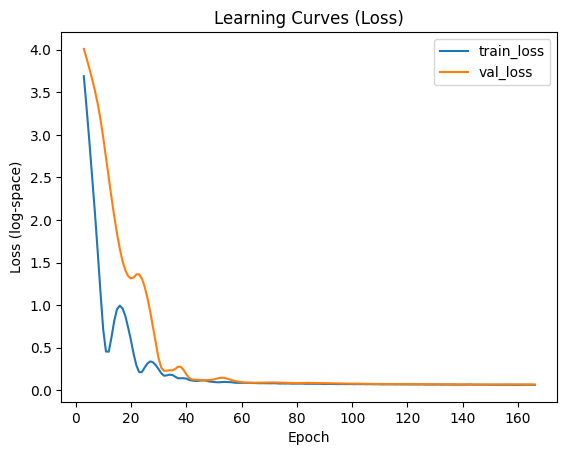

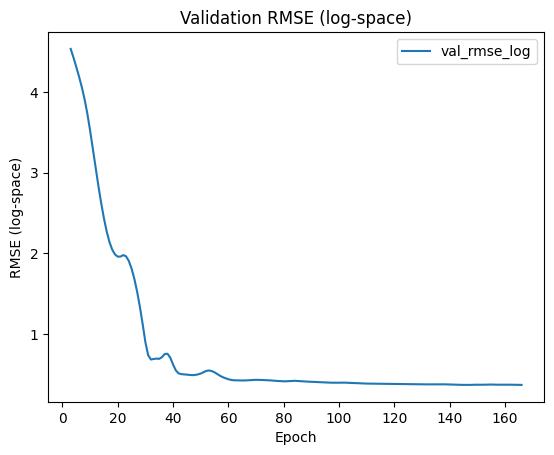

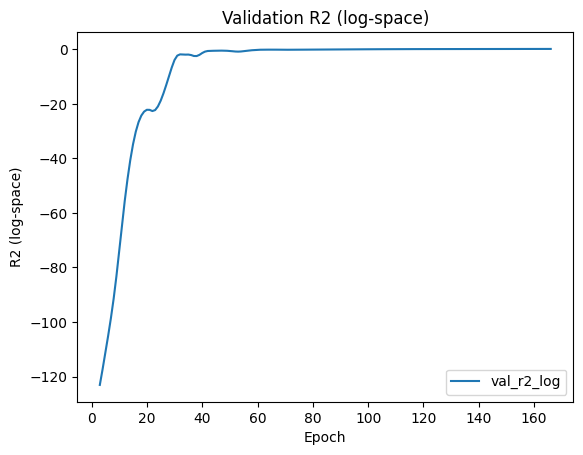

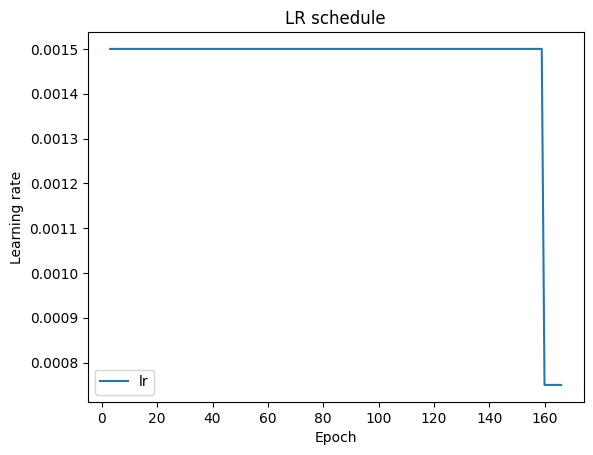

In [ ]:
def plot_learning(history):
    SKIP = 2
    epochs = list(range(1, len(history["train_loss"]) + 1))[SKIP:]

    plt.figure()
    plt.plot(epochs, history["train_loss"][SKIP:], label="train_loss")
    plt.plot(epochs, history["val_loss"][SKIP:], label="val_loss")
    plt.xlabel("Epoch"); plt.ylabel("Loss (log-space)")
    plt.legend(); plt.title("Learning Curves (Loss)")
    plt.show()

    plt.figure()
    plt.plot(epochs, history["val_rmse_log"][SKIP:], label="val_rmse_log")
    plt.xlabel("Epoch"); plt.ylabel("RMSE (log-space)")
    plt.legend(); plt.title("Validation RMSE (log-space)")
    plt.show()

    plt.figure()
    plt.plot(epochs, history["val_r2_log"][SKIP:], label="val_r2_log")
    plt.xlabel("Epoch"); plt.ylabel("R2 (log-space)")
    plt.legend(); plt.title("Validation R2 (log-space)")
    plt.show()

    plt.figure()
    plt.plot(epochs, history["lr"][SKIP:], label="lr")
    plt.xlabel("Epoch"); plt.ylabel("Learning rate")
    plt.legend(); plt.title("LR schedule")
    plt.show()


plot_learning(best_history)


In [ ]:
import torch
import numpy as np
import math
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Robust Evaluation Function (Bypasses "Numpy Not Available" Error)
def evaluate_model(model, loader, loss_fn, device=device):
    model.eval()
    losses = []

    # We will store as Python lists of floats to avoid PyTorch->Numpy bridge issues
    preds_list = []
    trues_list = []

    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            yb = yb.to(device)

            yhat = model(xb)
            loss = loss_fn(yhat, yb)
            losses.append(loss.item())

            # WORKAROUND: Use .tolist() instead of .numpy()
            # This extracts the data as standard Python floats first
            preds_list.extend(yhat.detach().float().cpu().tolist())
            trues_list.extend(yb.detach().float().cpu().tolist())

    # Convert Python lists to Numpy arrays (Safe operation)
    preds = np.array(preds_list)
    trues = np.array(trues_list)

    # Calculate metrics
    mse = mean_squared_error(trues, preds)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(trues, preds)
    r2 = r2_score(trues, preds)

    return float(np.mean(losses)), {"rmse_log": rmse, "mae_log": mae, "r2_log": r2}, preds, trues

In [ ]:
# Ensure model is on the correct device (GPU)
best_model = best_model.to(device)

# Run the evaluation with the new function
loss_name = best["params"]["loss_name"]
loss_fn = get_loss(loss_name)

# Pass 'device' explicitly to avoid confusion
test_loss, test_metrics_log, yhat_log, ytrue_log = evaluate_model(best_model, test_loader, loss_fn, device=device)

# Now your plotting code should work
print("Evaluation successful. R2:", test_metrics_log["r2_log"])

Evaluation successful. R2: -0.06891351429418768


TEST (2023) metrics (yield space):
RMSE: 47.456000227725426
MAE : 40.57417499135707
R2  : -0.2686967184204372
Corr^2: 0.15841267968589062


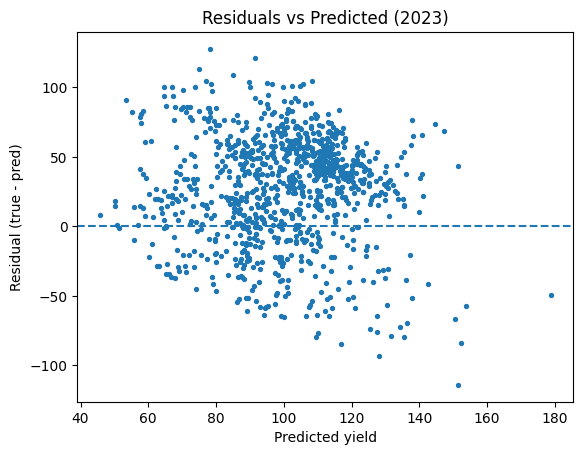

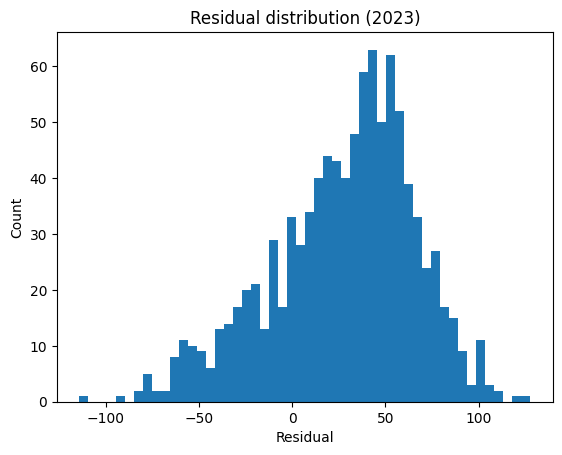

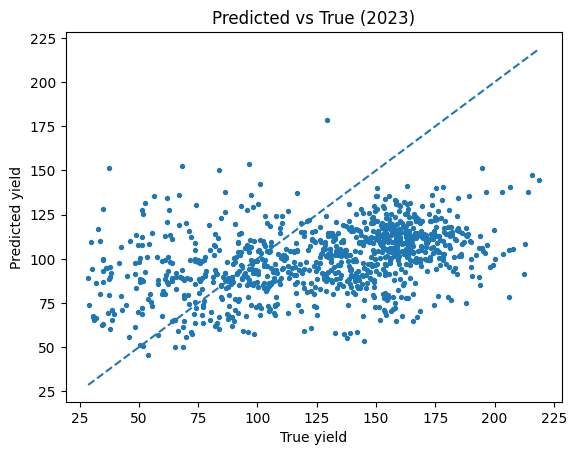

In [ ]:
# Build loaders for evaluation
test_loader = DataLoader(TabularSeqDataset(X_test, y_test), batch_size=512, shuffle=False)


#======================== CPU ================
# Use Huber for evaluation if that was best; otherwise match best.
loss_name = best["params"]["loss_name"]
loss_fn = get_loss(loss_name)

test_loss, test_metrics_log, yhat_log, ytrue_log = evaluate_model(best_model, test_loader, loss_fn)

# Convert back to yield space for human interpretable metrics
yhat = y_inverse(yhat_log)
#======================== CPU ================

ytrue = y_inverse(ytrue_log)

rmse = math.sqrt(mean_squared_error(ytrue, yhat))
mae  = mean_absolute_error(ytrue, yhat)
r2   = r2_score(ytrue, yhat)
corr_sq = np.corrcoef(ytrue, yhat)[0, 1] ** 2

print("TEST (2023) metrics (yield space):")
print("RMSE:", rmse)
print("MAE :", mae)
print("R2  :", r2)
print("Corr^2:", corr_sq)
# Residuals
resid = ytrue - yhat

plt.figure()
plt.scatter(yhat, resid, s=8)
plt.axhline(0, linestyle="--")
plt.xlabel("Predicted yield")
plt.ylabel("Residual (true - pred)")
plt.title("Residuals vs Predicted (2023)")
plt.show()

plt.figure()
plt.hist(resid, bins=50)
plt.xlabel("Residual")
plt.ylabel("Count")
plt.title("Residual distribution (2023)")
plt.show()

plt.figure()
plt.scatter(ytrue, yhat, s=8)
mn = min(ytrue.min(), yhat.min())
mx = max(ytrue.max(), yhat.max())
plt.plot([mn, mx], [mn, mx], linestyle="--")
plt.xlabel("True yield")
plt.ylabel("Predicted yield")
plt.title("Predicted vs True (2023)")
plt.show()


In [ ]:
import torch

In [ ]:
def predict_yield_space(model, X_np: np.ndarray, batch_size: int = 512) -> np.ndarray:
    model.eval()
    ds = TabularSeqDataset(X_np, np.zeros((X_np.shape[0],), dtype=np.float32))
    loader = DataLoader(ds, batch_size=batch_size, shuffle=False)
    preds_log = []
    with torch.no_grad():
        for xb, _ in loader:
            xb = xb.to(device)
            yhat_log = model(xb).detach().cpu().numpy()
            preds_log.append(yhat_log)
    preds_log = np.concatenate(preds_log)
    return y_inverse(preds_log)

base_pred = predict_yield_space(best_model, X_test)
base_rmse = math.sqrt(mean_squared_error(ytrue, base_pred))
print("Base RMSE:", base_rmse)

rng = np.random.RandomState(42)
importances = []

for j, feat in enumerate(feature_cols):
    Xp = X_test.copy()
    rng.shuffle(Xp[:, j])  # permute one feature column
    pred_p = predict_yield_space(best_model, Xp)
    rmse_p = math.sqrt(mean_squared_error(ytrue, pred_p))
    importances.append((feat, rmse_p - base_rmse))

imp_df = pd.DataFrame(importances, columns=["feature", "rmse_increase"]).sort_values("rmse_increase", ascending=False)
print(imp_df.head(50))

plt.figure()
top = imp_df.head(20).iloc[::-1]
plt.barh(top["feature"], top["rmse_increase"])
plt.xlabel("Increase in RMSE after permutation")
plt.title("Permutation Importance (Top 20) — Test 2023")
plt.show()


RuntimeError: Numpy is not available

In [ ]:
!uv add shap -q

In [ ]:
import shap
import torch
import torch.nn as nn

class WrappedModel(nn.Module):
    def __init__(self, base_model):
        super().__init__()
        self.base_model = base_model

    def forward(self, x):
        # base_model returns (B,) -> make it (B, 1)
        return self.base_model(x).unsqueeze(1)

wrapped_model = WrappedModel(best_model).to(device)
wrapped_model.eval()

# Background and explain tensors must be on the same device
bg_idx = np.random.choice(X_train.shape[0], size=min(256, X_train.shape[0]), replace=False)
ex_idx = np.random.choice(X_test.shape[0],  size=min(256, X_test.shape[0]),  replace=False)

X_bg = torch.tensor(X_train[bg_idx], dtype=torch.float32).unsqueeze(1).to(device)
X_ex = torch.tensor(X_test[ex_idx],  dtype=torch.float32).unsqueeze(1).to(device)

explainer = shap.GradientExplainer(wrapped_model, X_bg)
shap_vals = explainer.shap_values(X_ex)

# shap_vals is often a list (one element for one output)
sv = shap_vals[0] if isinstance(shap_vals, list) else shap_vals

# sv will be (N, 1, num_features) -> squeeze channel dim
sv = sv[:, 0, :]

shap.summary_plot(sv, features=X_test[ex_idx], feature_names=feature_cols, show=False)
plt.title("SHAP summary (subset of Test 2023)")
plt.show()


RuntimeError: Numpy is not available

/tmp/ipykernel_1822773/1103258092.py:23: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(sv, features=X_test[ex_idx], feature_names=feature_cols, show=False)
/home/cholab/LabMembers/Samar/.venv/lib/python3.10/site-packages/shap/plots/_beeswarm.py:723: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  summary_legacy(


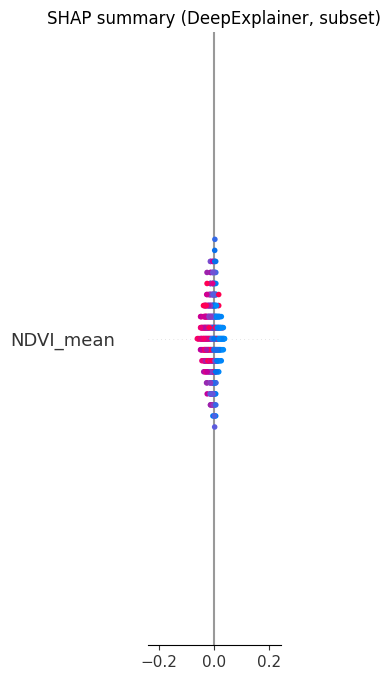

In [ ]:
# Install if needed:
# !pip -q install shap

import shap

# Background samples (small subset from train)
bg_idx = np.random.choice(X_train.shape[0], size=min(512, X_train.shape[0]), replace=False)
X_bg = torch.tensor(X_train[bg_idx], dtype=torch.float32).unsqueeze(1).to(device)

# Explain samples (small subset from test)
ex_idx = np.random.choice(X_test.shape[0], size=min(512, X_test.shape[0]), replace=False)
X_ex = torch.tensor(X_test[ex_idx], dtype=torch.float32).unsqueeze(1).to(device)

best_model.eval()

explainer = shap.DeepExplainer(wrapped_model, X_bg)
shap_vals = explainer.shap_values(X_ex)

# Convert to (N, num_features)
sv = shap_vals[0] if isinstance(shap_vals, list) else shap_vals
sv = sv[:, 0, :]

shap.summary_plot(sv, features=X_test[ex_idx], feature_names=feature_cols, show=False)
plt.title("SHAP summary (DeepExplainer, subset)")
plt.show()


In [ ]:
# Train a median quantile model (q=0.5) using the best architecture params but quantile loss
best_arch = {
    "channels": best["params"]["channels"],
    "kernel_size": best["params"]["kernel_size"],
    "dropout": best["params"]["dropout"],
    "fc_units": best["params"]["fc_units"]
}

cfg = TrainConfig(
    batch_size=best["params"]["batch_size"],
    lr=best["params"]["lr"],
    weight_decay=best["params"]["weight_decay"],
    epochs=200
)

q_model, q_hist, _ = train_one_run(
    X_train, y_train, X_val, y_val,
    model_params=best_arch,
    cfg=cfg,
    loss_name="quantile",
    quantile=0.5
)

# Predict on VAL to get residuals (in yield space)
val_loader = DataLoader(TabularSeqDataset(X_val, y_val), batch_size=512, shuffle=False)
_, _, yvhat_log, yvtrue_log = evaluate_model(q_model, val_loader, get_loss("quantile", 0.5))
yvhat = y_inverse(yvhat_log)
yvtrue = y_inverse(yvtrue_log)
val_abs_resid = np.abs(yvtrue - yvhat)

# Conformal interval radius for 90% coverage
alpha = 0.10
q = np.quantile(val_abs_resid, 1 - alpha)

# Apply to TEST predictions
test_pred = predict_yield_space(q_model, X_test)
lower = test_pred - q
upper = test_pred + q

# Quick plot for a slice
plt.figure()
idx = np.argsort(ytrue)[:200]  # 200 lowest-yield samples (just for a clean plot)
plt.plot(ytrue[idx], label="true")
plt.plot(test_pred[idx], label="pred")
plt.fill_between(np.arange(len(idx)), lower[idx], upper[idx], alpha=0.3, label="90% interval")
plt.legend()
plt.title("Conformal interval (baseline) — Test 2023 (subset)")
plt.show()


KeyError: 'channels'

In [ ]:
best ={}
best['params']={'weight_decay': 0.001, 'lr': 0.002, 'loss_name': 'huber', 'kernel_size': 5, 'head_units': 128, 'dropout': 0.3, 'branch_channels': (16, 32, 64), 'batch_size': 512}

In [ ]:
best['params']

{'weight_decay': 3e-06,
 'plateau_patience': 12,
 'min_lr': 1e-05,
 'min_delta': 0.0003,
 'lr_factor': 0.5,
 'lr': 0.0015,
 'loss_name': 'huber',
 'kernel_size': 5,
 'jump_patience': 26,
 'jump_multiplier': 0.9,
 'head_units': 256,
 'dropout': 0.2,
 'branch_channels': (16, 32, 64),
 'batch_size': 50000}

In [ ]:
best_params = best["params"]   # from tuner result

# Architecture params for MultiBranchYieldNet
best_arch = {
    "branch_channels": best_params["branch_channels"],
    "kernel_size": best_params["kernel_size"],
    "dropout": best_params["dropout"],
    "head_units": best_params["head_units"],
}

# Training config
best_cfg = TrainConfig(
    batch_size=best_params["batch_size"],
    lr=best_params["lr"],
    weight_decay=best_params["weight_decay"],
    epochs=200,                 # keep consistent with tuning
    patience=20,
    plateau_patience=8,
    # lr_factor=0.5,
    # min_lr=1e-6,

    # ✅ scheduler params from tuning
    # t0=best_params["t0"],
    # t_mult=best_params["t_mult"],

    # ✅ eta_min: you stored it as "eta_min" in tuning space,
    # but you passed it into TrainConfig as min_lr
    min_lr=best_params["min_lr"],
    jump_patience=18,
    jump_multiplier=0.9
)

best_loss_name = best_params["loss_name"]


In [ ]:
import numpy as np
import pandas as pd
import math
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from torch.utils.data import DataLoader

VAL_YEARS_FIXED = {2014, 2016, 2024}

def run_fixed_val_loyo(df, years=None):
    if years is None:
        years = sorted(df["year"].unique())

    results = []

    for test_year in years:
        # Keep validation years fixed, except remove test_year if it overlaps
        val_years = set(VAL_YEARS_FIXED)
        if test_year in val_years:
            val_years = val_years - {test_year}

        # Define splits
        test_df  = df[df["year"] == test_year].copy()
        val_df   = df[df["year"].isin(val_years)].copy()
        train_df = df[~df["year"].isin(val_years.union({test_year}))].copy()

        # Sanity (no leakage)
        assert set(train_df["year"]).isdisjoint(val_years)
        assert test_year not in set(train_df["year"])
        assert test_year not in set(val_df["year"])

        # Fit scaler on TRAIN only
        scaler = StandardScaler()
        X_train = scaler.fit_transform(train_df[feature_cols].values.astype(np.float32))
        X_val   = scaler.transform(val_df[feature_cols].values.astype(np.float32))
        X_test  = scaler.transform(test_df[feature_cols].values.astype(np.float32))

        # Log-transform target
        y_train = y_transform(train_df[TARGET_COL].values.astype(np.float32))
        y_val   = y_transform(val_df[TARGET_COL].values.astype(np.float32))
        y_test  = y_transform(test_df[TARGET_COL].values.astype(np.float32))

        # Train with the same best hyperparameters (Multi-branch)
        model, hist, best_val_loss = train_one_run(
            X_train, y_train, X_val, y_val,
            model_params=best_arch,     # expects keys: branch_channels, kernel_size, dropout, head_units
            cfg=best_cfg,
            loss_name=best_loss_name
        )

        # Test on held-out year
        pin = (device.type == "cuda")
        test_loader = DataLoader(
            TabularSeqDataset(X_test, y_test),
            batch_size=512,
            shuffle=False,
            num_workers=0,
            pin_memory=pin
        )

        # IMPORTANT: if you're using quantile later, pass quantile here too
        loss_fn = get_loss(best_loss_name)
        test_loss_log, test_metrics_log, yhat_log, ytrue_log = evaluate_model(model, test_loader, loss_fn)

        # Convert to yield space
        yhat  = y_inverse(yhat_log)
        ytrue = y_inverse(ytrue_log)

        rmse = math.sqrt(mean_squared_error(ytrue, yhat))
        mae  = mean_absolute_error(ytrue, yhat)
        r2   = r2_score(ytrue, yhat)
        corr_sq = np.corrcoef(ytrue, yhat)[0, 1] ** 2

        results.append({
            "test_year": int(test_year),
            "val_years_used": sorted(list(val_years)),
            "n_train": int(len(train_df)),
            "n_val": int(len(val_df)),
            "n_test": int(len(test_df)),
            "best_val_loss_log": float(best_val_loss),
            "test_loss_log": float(test_loss_log),
            "rmse_log": float(test_metrics_log["rmse_log"]),
            "mae_log": float(test_metrics_log["mae_log"]),
            "r2_log": float(test_metrics_log["r2_log"]),
            "rmse": float(rmse),
            "mae": float(mae),
            "r2": float(r2),
            "corr_sq": float(corr_sq)
        })

        print(f"Done test_year={test_year} | val_years={sorted(val_years)} | RMSE={rmse:.3f} | R2={r2:.3f} | Corr_sq={corr_sq:.3f}")

    return pd.DataFrame(results).sort_values("test_year")

luyo_df = run_fixed_val_loyo(df)
luyo_df


Done test_year=2014 | val_years=[2016, 2024] | RMSE=56.725 | R2=-2.920 | Corr_sq=0.043


Exception ignored in: <function _releaseLock at 0x7d71529ad090>
Traceback (most recent call last):
  File "/usr/lib/python3.10/logging/__init__.py", line 228, in _releaseLock
    def _releaseLock():
KeyboardInterrupt: 


RuntimeError: DataLoader worker (pid(s) 2164834, 2164835, 2164836, 2164837, 2164838, 2164839, 2164840, 2164841, 2164842) exited unexpectedly

In [ ]:
best_cfg

TrainConfig(batch_size=512, epochs=200, lr=0.002, weight_decay=0.001, patience=20, plateau_patience=8, lr_factor=0.5, min_lr=1e-06, jump_patience=18, jump_multiplier=0)

In [ ]:
def run_fixed_val_loyo(df, years=None, return_histories=True):
    if years is None:
        years = sorted(df["year"].unique())

    results = []
    histories = {}  # test_year -> hist

    for test_year in years:
        val_years = set(VAL_YEARS_FIXED)
        if test_year in val_years:
            val_years = val_years - {test_year}

        test_df  = df[df["year"] == test_year].copy()
        val_df   = df[df["year"].isin(val_years)].copy()
        train_df = df[~df["year"].isin(val_years.union({test_year}))].copy()

        assert set(train_df["year"]).isdisjoint(val_years)
        assert test_year not in set(train_df["year"])
        assert test_year not in set(val_df["year"])

        scaler = StandardScaler()
        X_train = scaler.fit_transform(train_df[feature_cols].values.astype(np.float32))
        X_val   = scaler.transform(val_df[feature_cols].values.astype(np.float32))
        X_test  = scaler.transform(test_df[feature_cols].values.astype(np.float32))

        y_train = y_transform(train_df[TARGET_COL].values.astype(np.float32))
        y_val   = y_transform(val_df[TARGET_COL].values.astype(np.float32))
        y_test  = y_transform(test_df[TARGET_COL].values.astype(np.float32))

        model, hist, best_val_loss = train_one_run(
            X_train, y_train, X_val, y_val,
            model_params=best_arch,
            cfg=best_cfg,
            loss_name=best_loss_name
        )

        # ✅ store the learning curve history for this LOYO year
        histories[int(test_year)] = hist

        pin = (device.type == "cuda")
        test_loader = DataLoader(
            TabularSeqDataset(X_test, y_test),
            batch_size=512,
            shuffle=False,
            num_workers=0,
            pin_memory=pin
        )

        loss_fn = get_loss(best_loss_name)
        test_loss_log, test_metrics_log, yhat_log, ytrue_log = evaluate_model(model, test_loader, loss_fn)

        yhat  = y_inverse(yhat_log)
        ytrue = y_inverse(ytrue_log)

        rmse = math.sqrt(mean_squared_error(ytrue, yhat))
        mae  = mean_absolute_error(ytrue, yhat)
        r2   = r2_score(ytrue, yhat)
        corr_sq = np.corrcoef(ytrue, yhat)[0, 1] ** 2

        plt.figure()
        plt.scatter(ytrue, yhat, s=6, alpha=0.35)
        lo = float(min(np.min(ytrue), np.min(yhat)))
        hi = float(max(np.max(ytrue), np.max(yhat)))
        plt.plot([lo, hi], [lo, hi])
        plt.title(f"LOYO {test_year} | R2={r2:.3f}, RMSE={rmse:.3f}")
        plt.xlabel("Actual yield")
        plt.ylabel("Predicted yield")
        plt.show()

        results.append({
            "test_year": int(test_year),
            "val_years_used": sorted(list(val_years)),
            "n_train": int(len(train_df)),
            "n_val": int(len(val_df)),
            "n_test": int(len(test_df)),
            "best_val_loss_log": float(best_val_loss),
            "test_loss_log": float(test_loss_log),
            "rmse_log": float(test_metrics_log["rmse_log"]),
            "mae_log": float(test_metrics_log["mae_log"]),
            "r2_log": float(test_metrics_log["r2_log"]),
            "rmse": float(rmse),
            "mae": float(mae),
            "r2": float(r2),
            "corr_sq": float(corr_sq)
        })

        print(f"Done test_year={test_year} | val_years={sorted(val_years)} | RMSE={rmse:.3f} | R2={r2:.3f} | Corr_sq={corr_sq:.3f}")

    results_df = pd.DataFrame(results).sort_values("test_year")
    return (results_df, histories) if return_histories else results_df


##Uses CosineAnneling when plateaus

### Soybeans


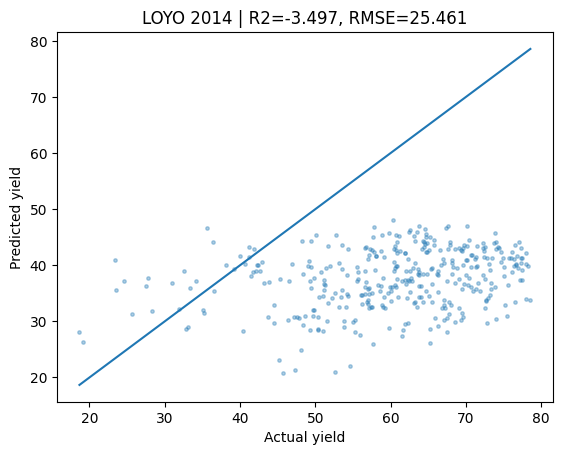

Done test_year=2014 | val_years=[2016, 2024] | RMSE=25.461 | R2=-3.497 | Corr_sq=0.072


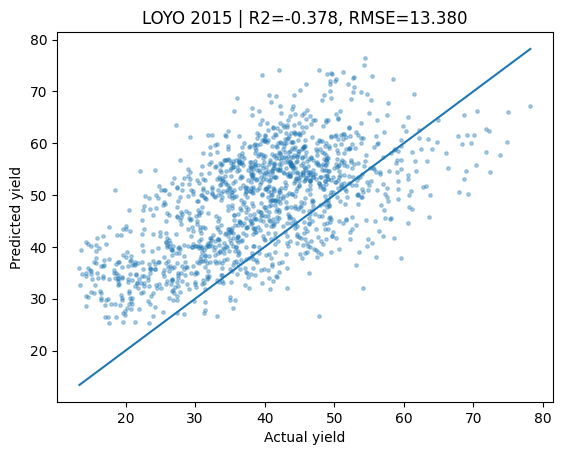

Done test_year=2015 | val_years=[2014, 2016, 2024] | RMSE=13.380 | R2=-0.378 | Corr_sq=0.376


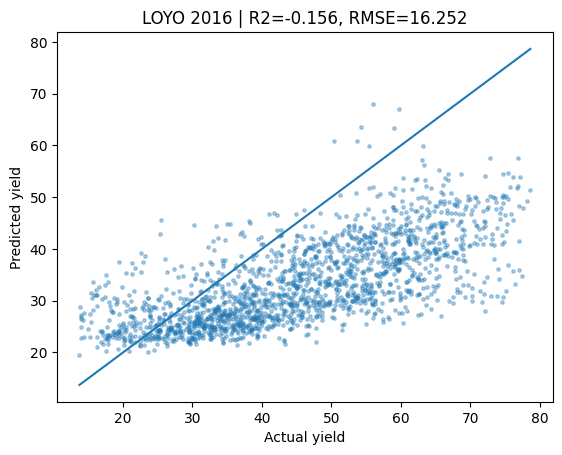

Done test_year=2016 | val_years=[2014, 2024] | RMSE=16.252 | R2=-0.156 | Corr_sq=0.487


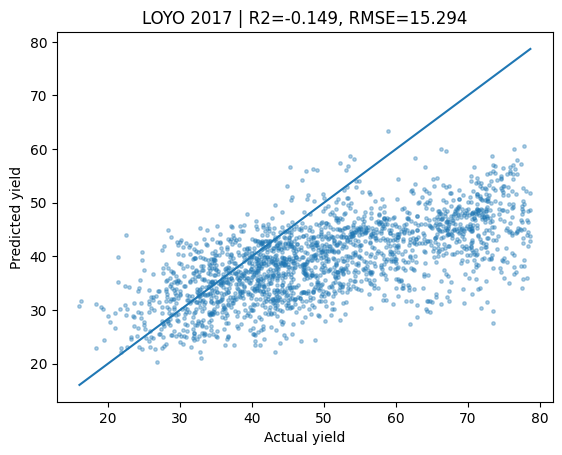

Done test_year=2017 | val_years=[2014, 2016, 2024] | RMSE=15.294 | R2=-0.149 | Corr_sq=0.414


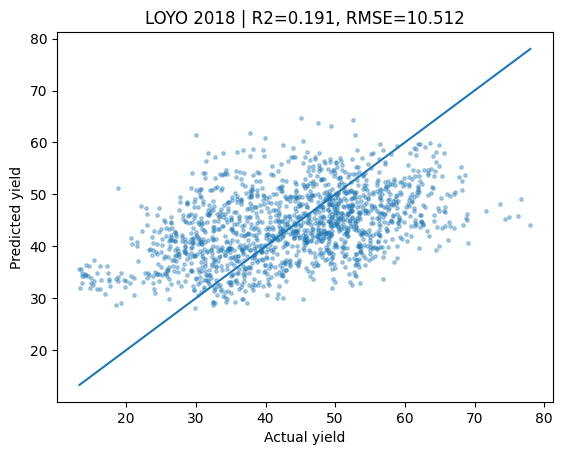

Done test_year=2018 | val_years=[2014, 2016, 2024] | RMSE=10.512 | R2=0.191 | Corr_sq=0.207


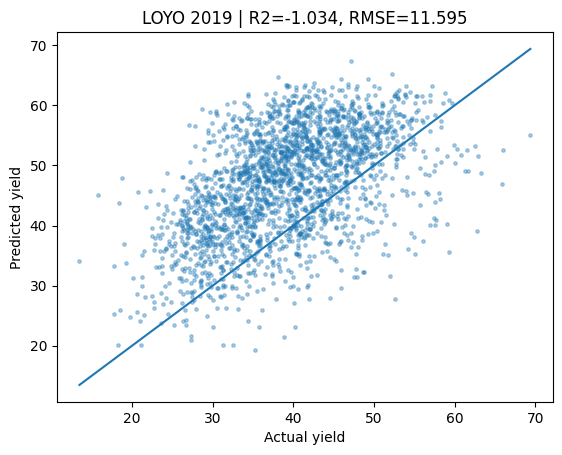

Done test_year=2019 | val_years=[2014, 2016, 2024] | RMSE=11.595 | R2=-1.034 | Corr_sq=0.263


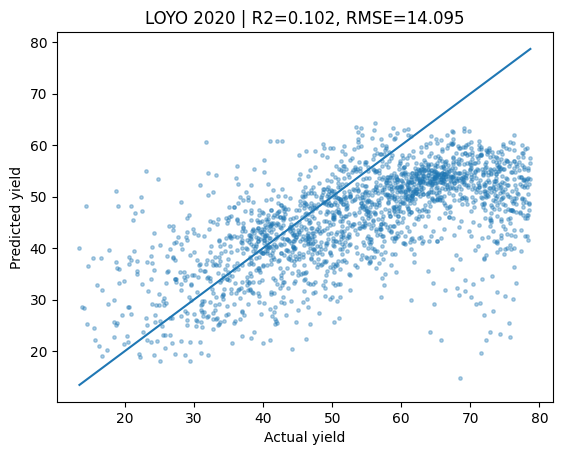

Done test_year=2020 | val_years=[2014, 2016, 2024] | RMSE=14.095 | R2=0.102 | Corr_sq=0.388


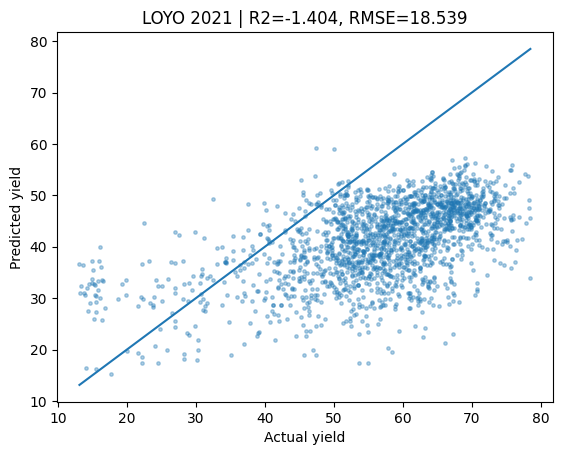

Done test_year=2021 | val_years=[2014, 2016, 2024] | RMSE=18.539 | R2=-1.404 | Corr_sq=0.293


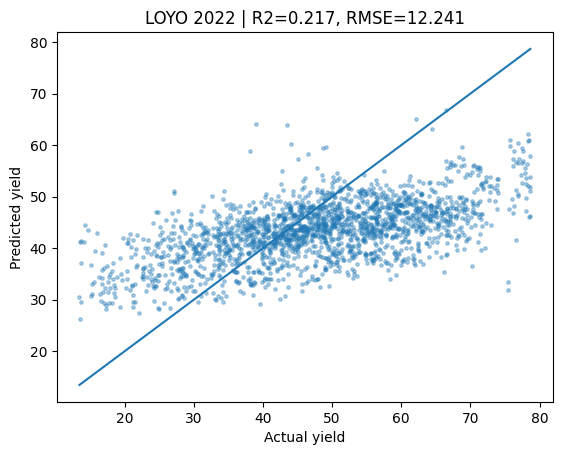

Done test_year=2022 | val_years=[2014, 2016, 2024] | RMSE=12.241 | R2=0.217 | Corr_sq=0.347


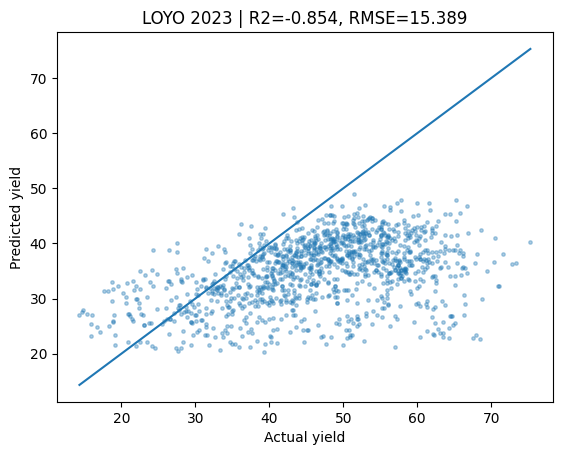

Done test_year=2023 | val_years=[2014, 2016, 2024] | RMSE=15.389 | R2=-0.854 | Corr_sq=0.176


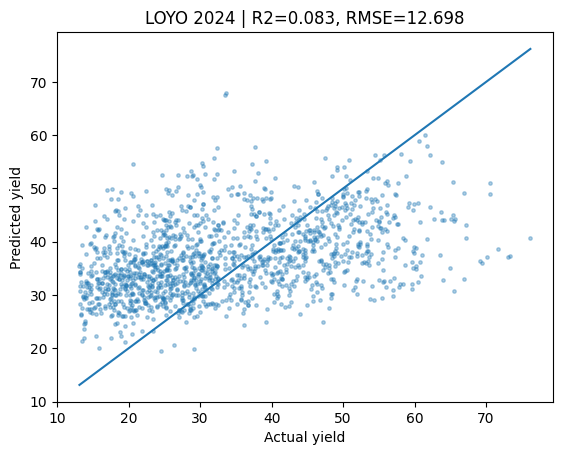

Done test_year=2024 | val_years=[2014, 2016] | RMSE=12.698 | R2=0.083 | Corr_sq=0.168

=== Learning curves for LOYO test_year=2014 ===


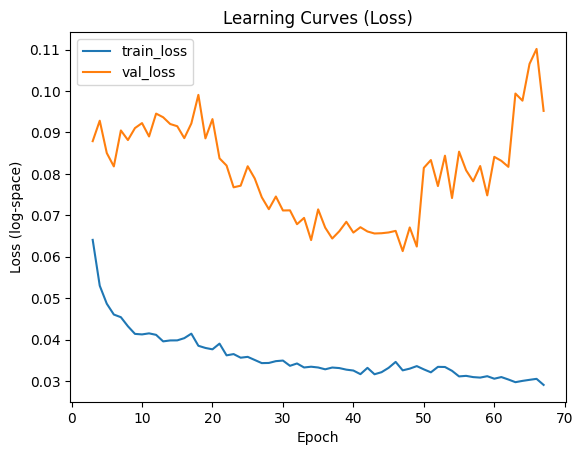

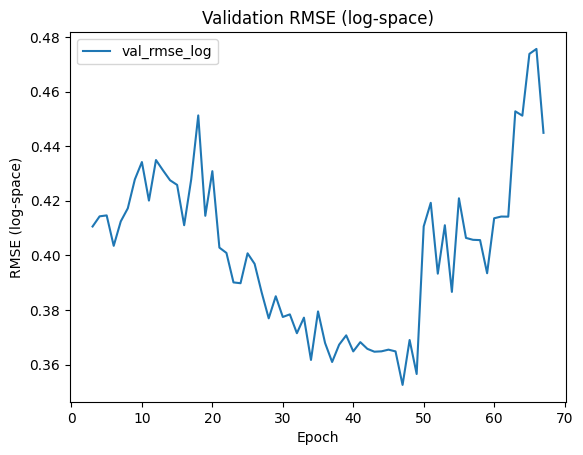

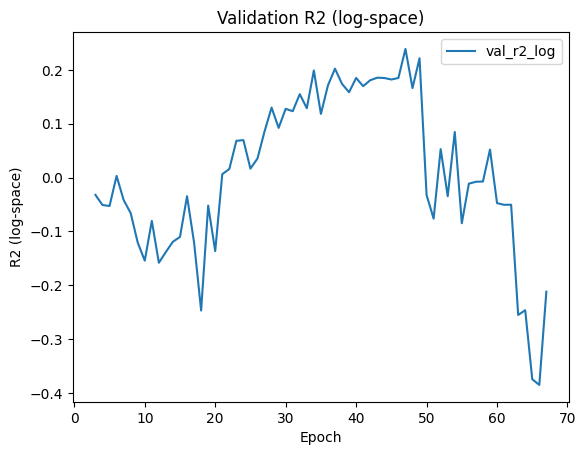

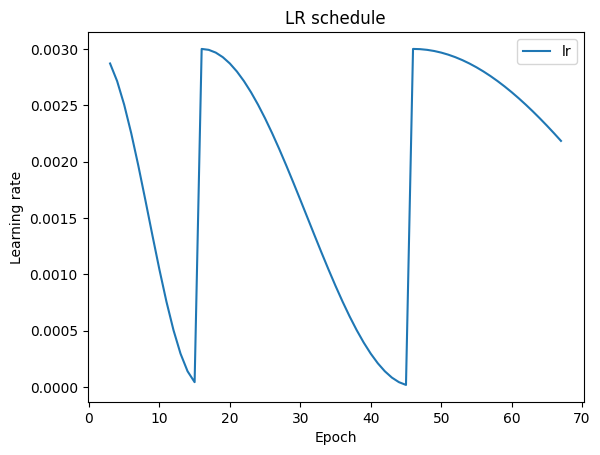


=== Learning curves for LOYO test_year=2015 ===


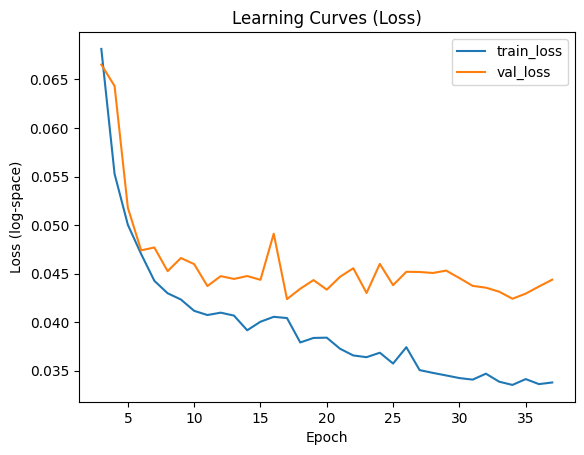

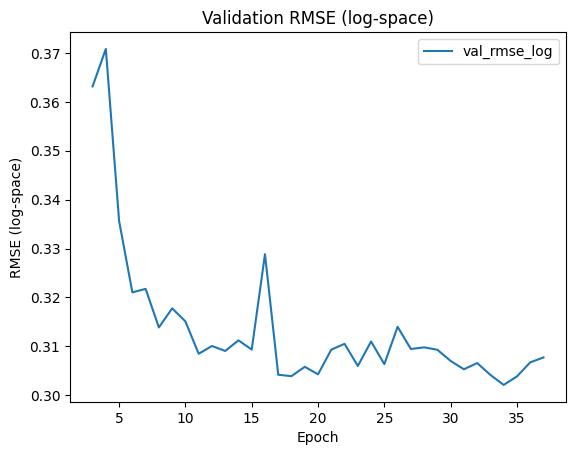

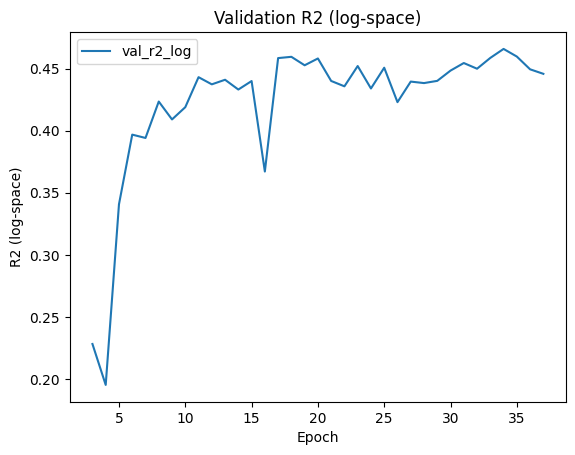

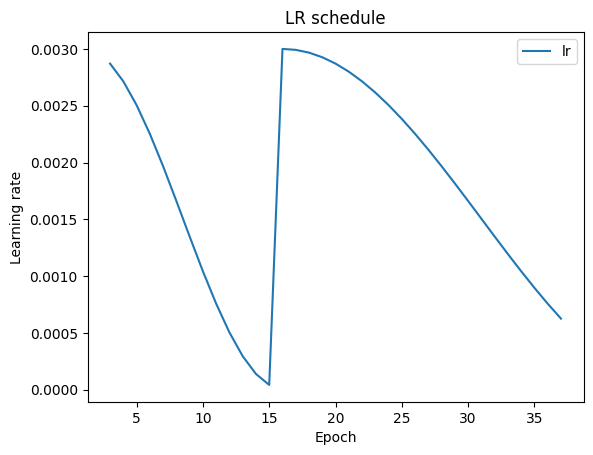


=== Learning curves for LOYO test_year=2016 ===


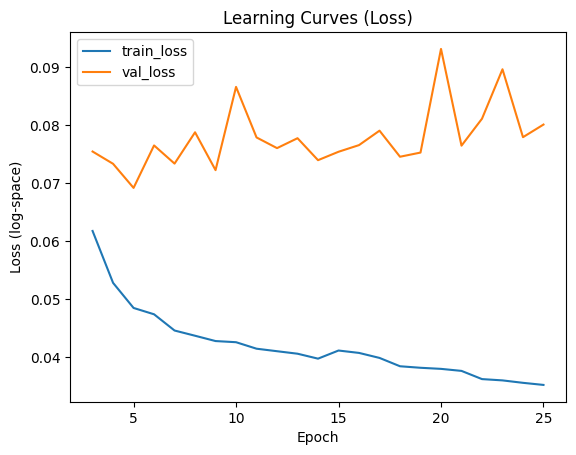

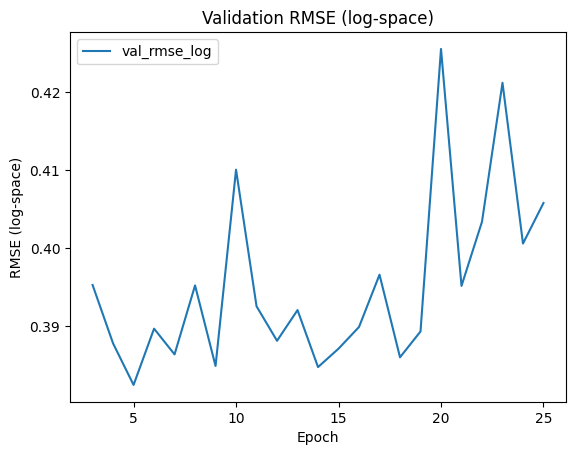

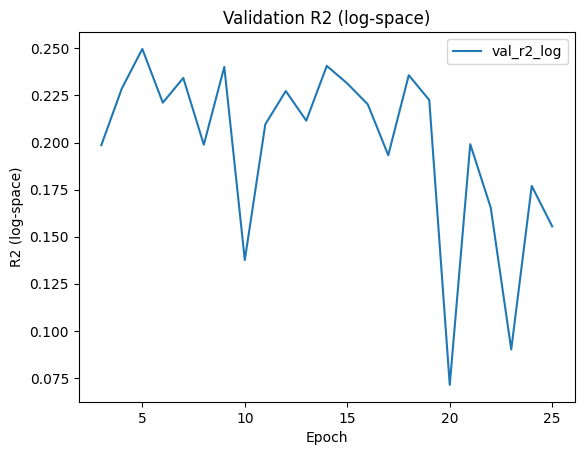

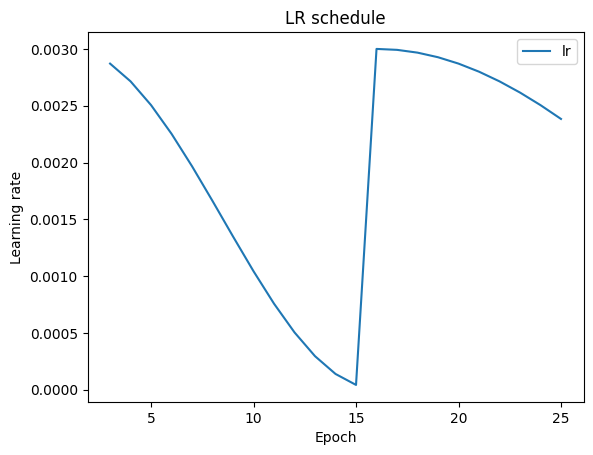


=== Learning curves for LOYO test_year=2017 ===


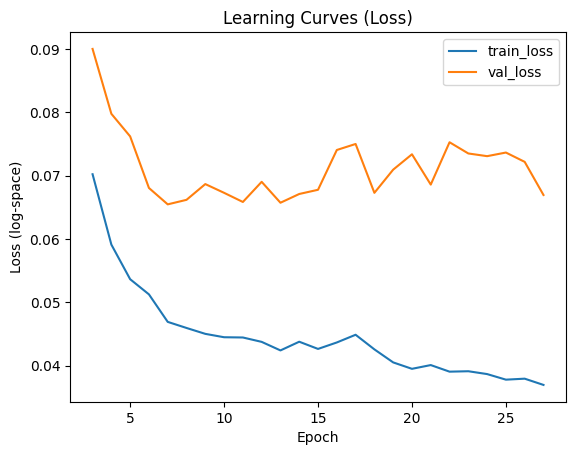

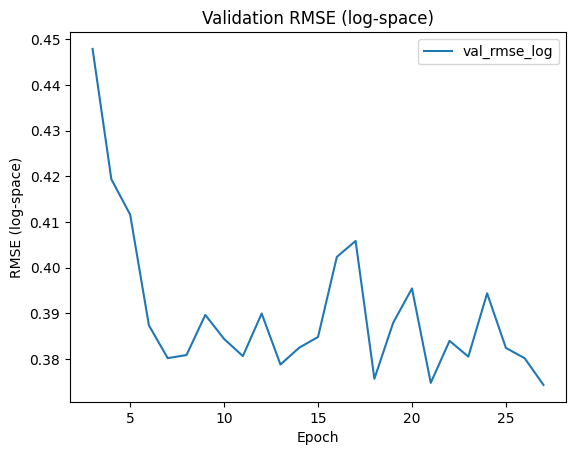

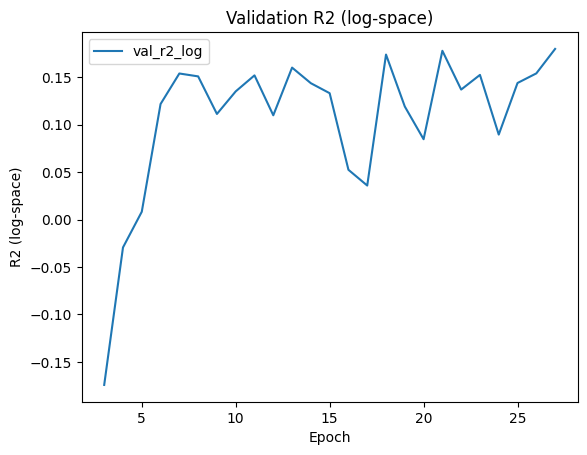

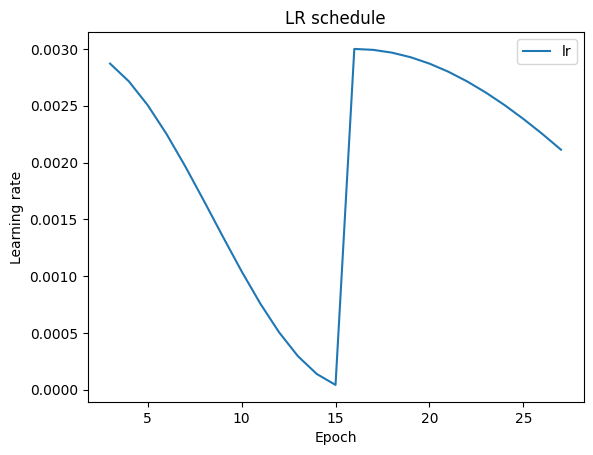


=== Learning curves for LOYO test_year=2018 ===


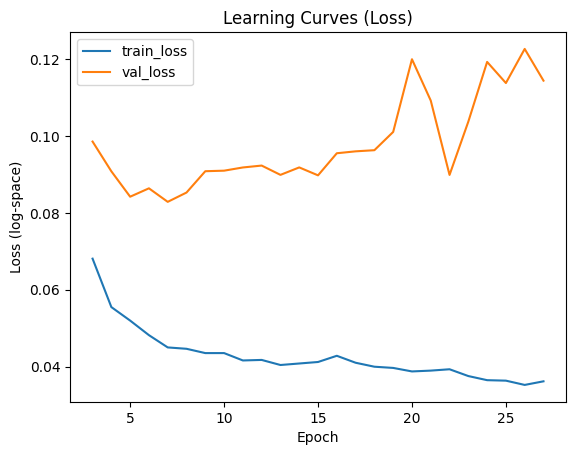

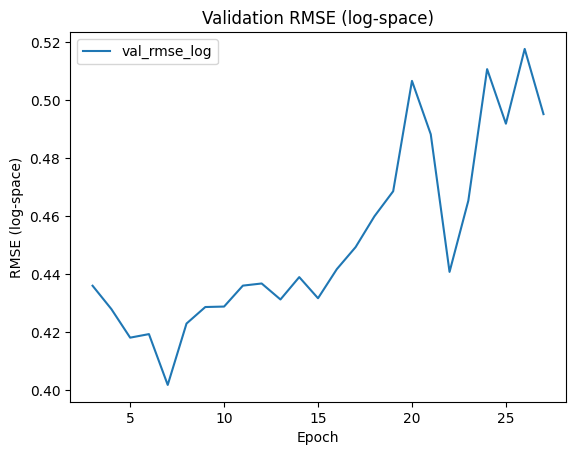

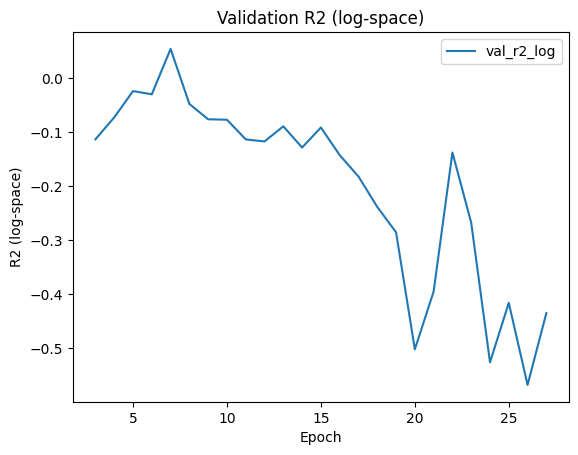

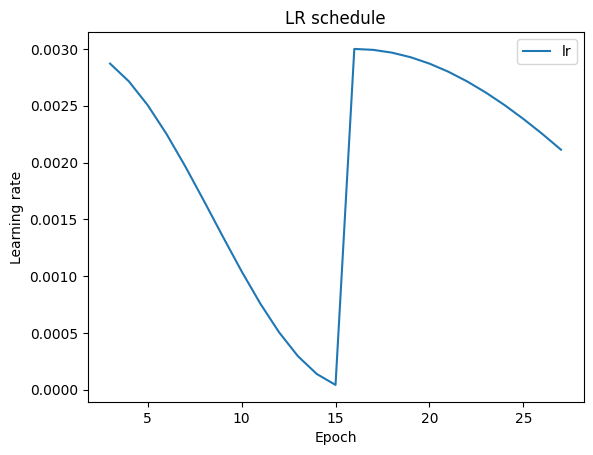


=== Learning curves for LOYO test_year=2019 ===


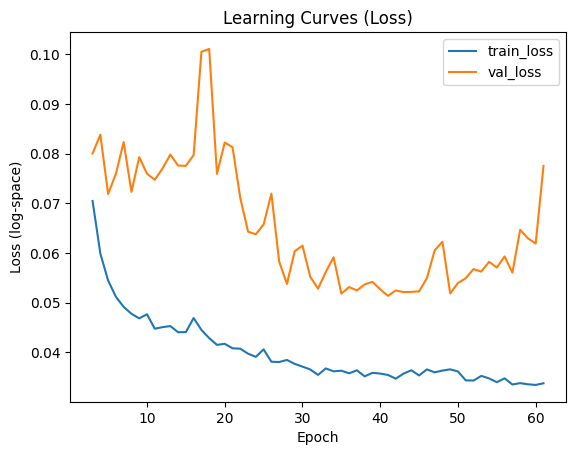

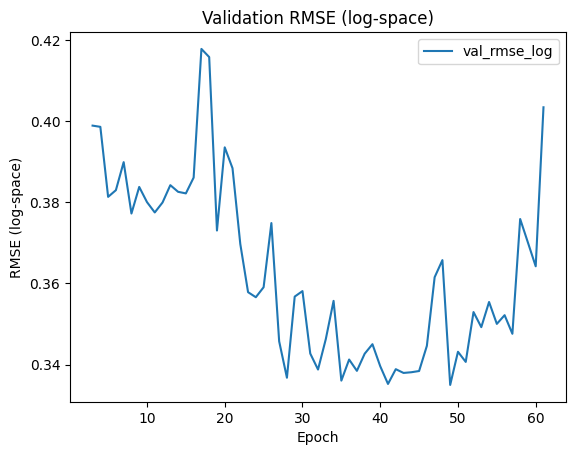

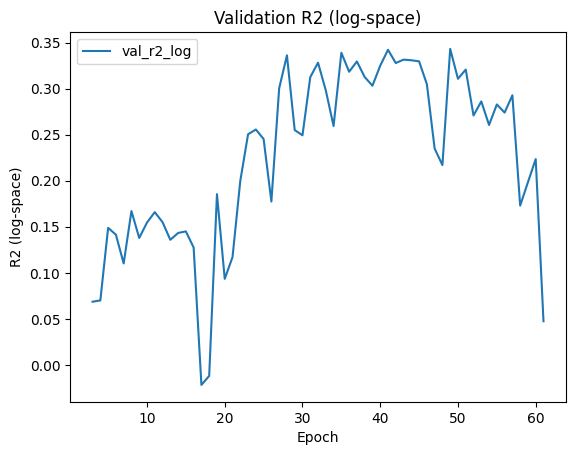

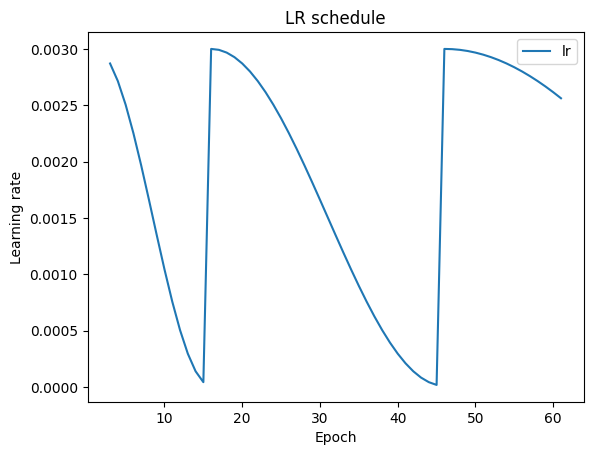


=== Learning curves for LOYO test_year=2020 ===


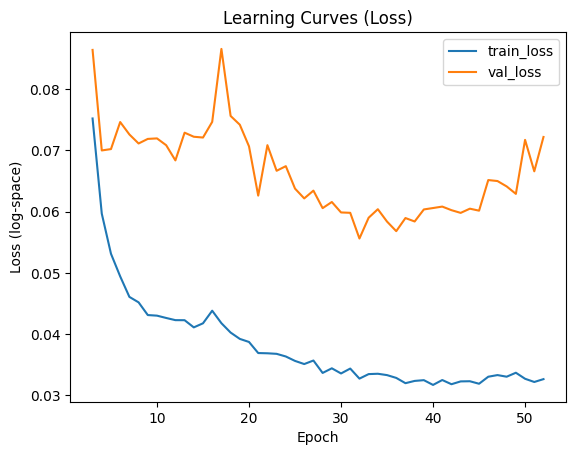

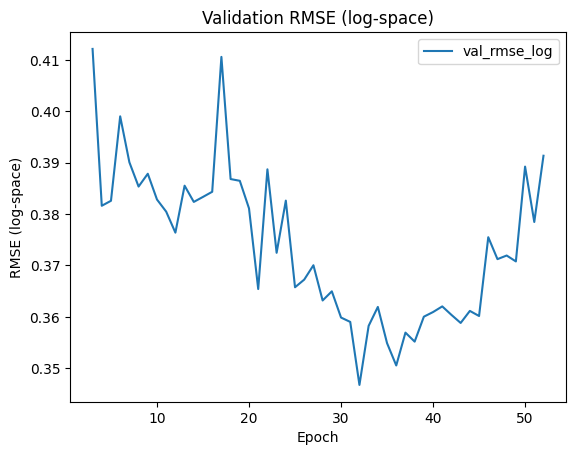

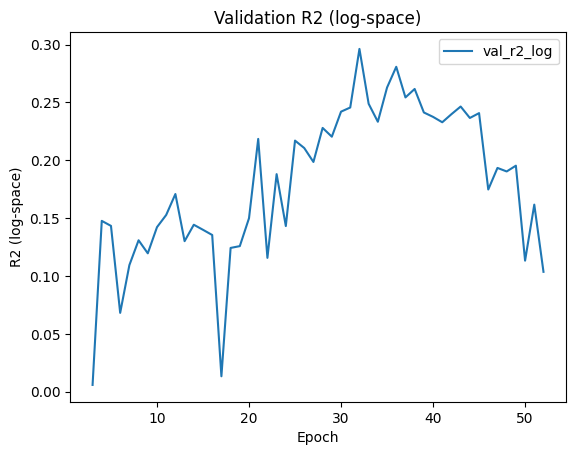

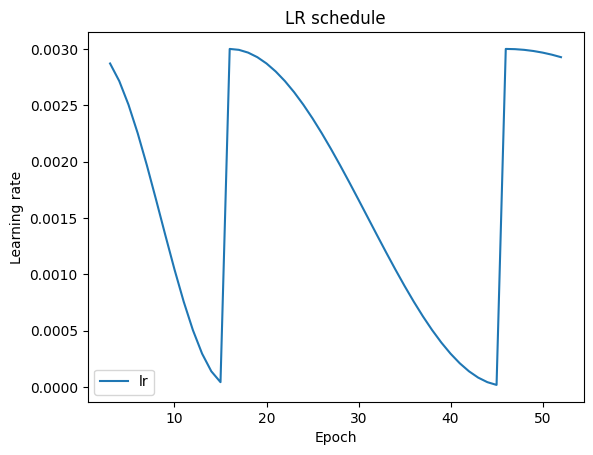


=== Learning curves for LOYO test_year=2021 ===


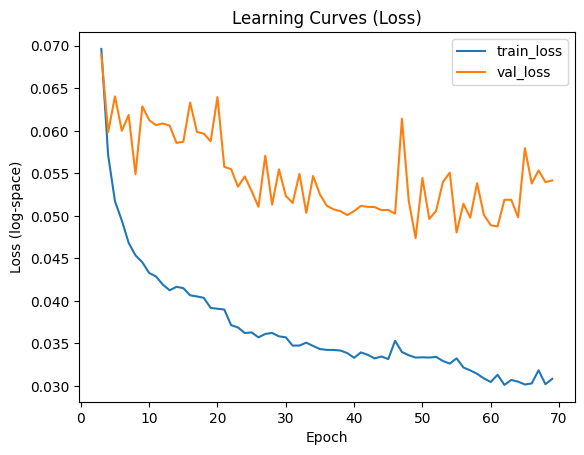

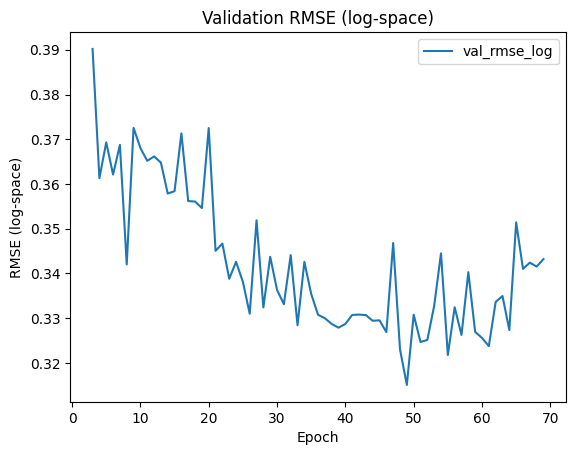

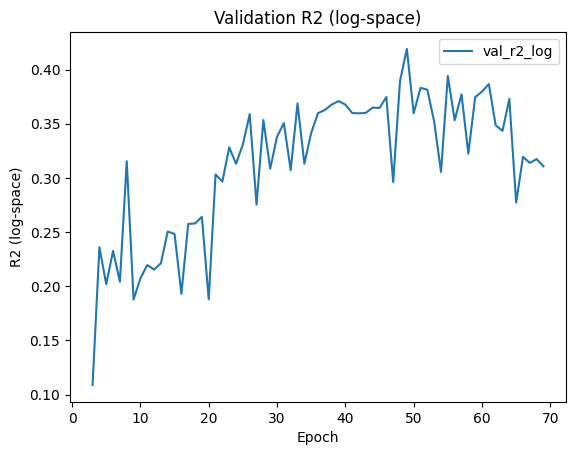

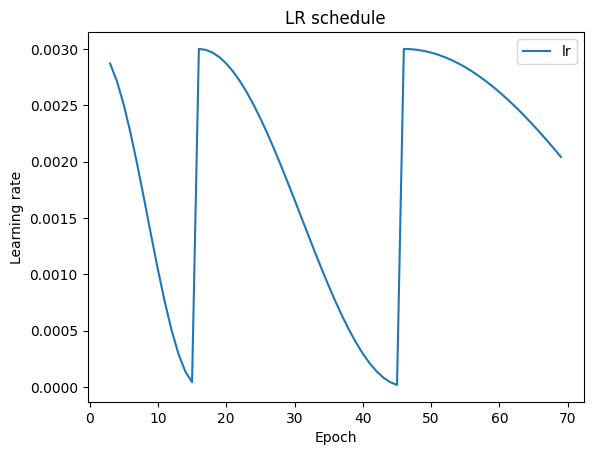


=== Learning curves for LOYO test_year=2022 ===


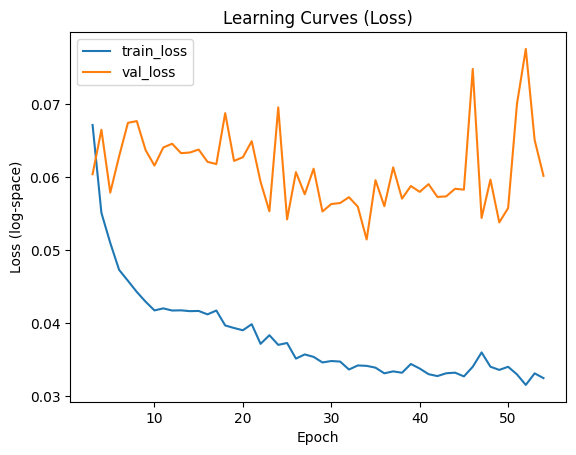

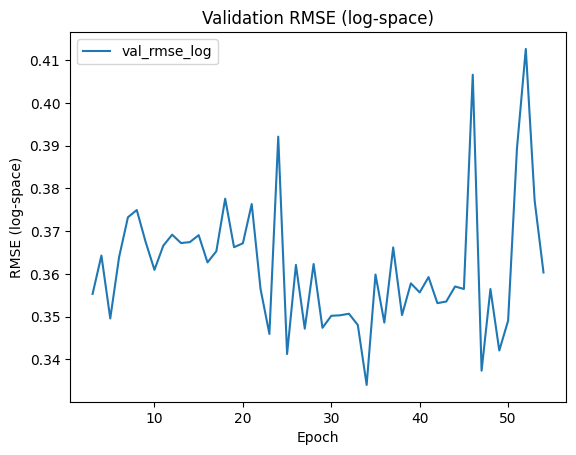

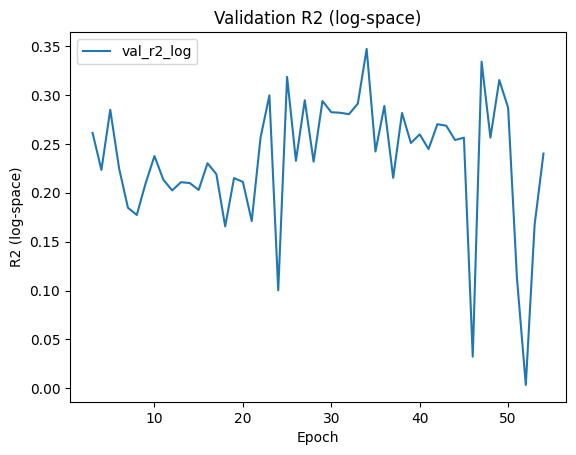

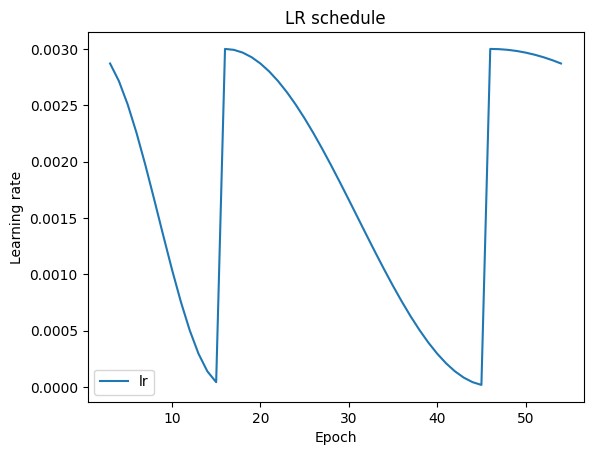


=== Learning curves for LOYO test_year=2023 ===


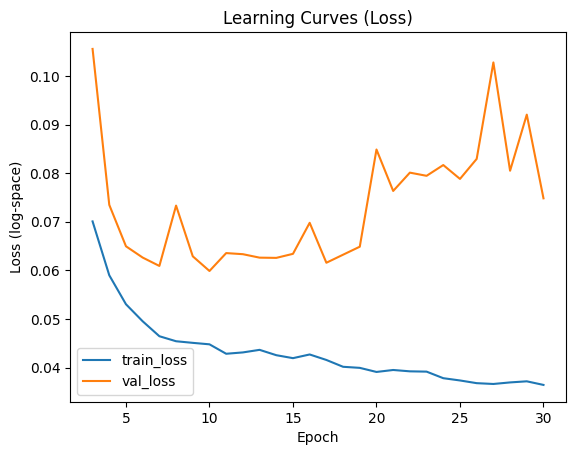

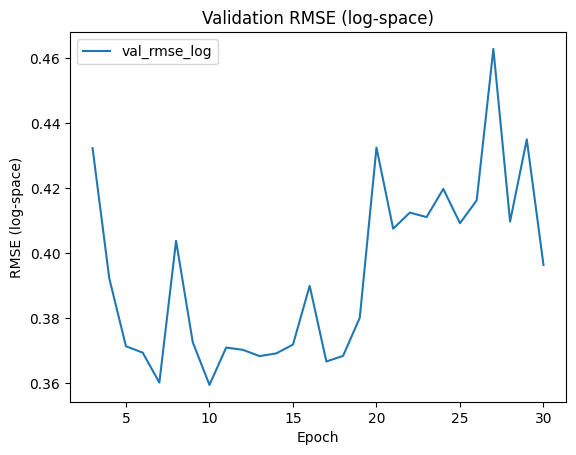

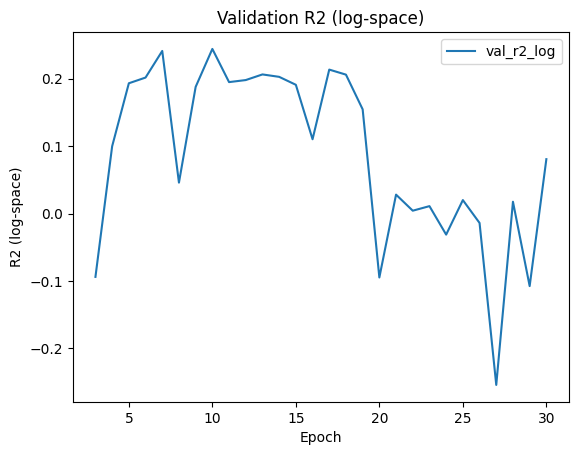

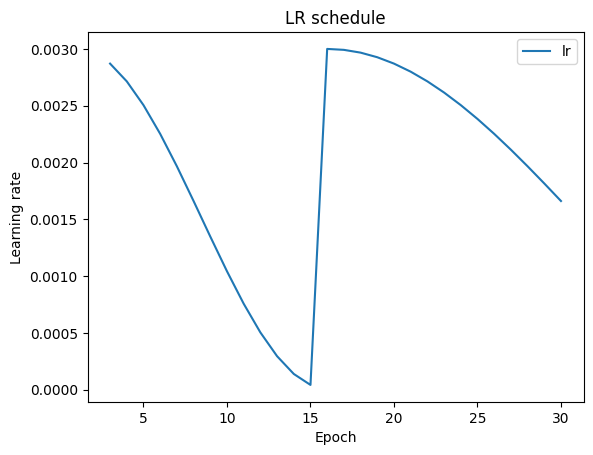


=== Learning curves for LOYO test_year=2024 ===


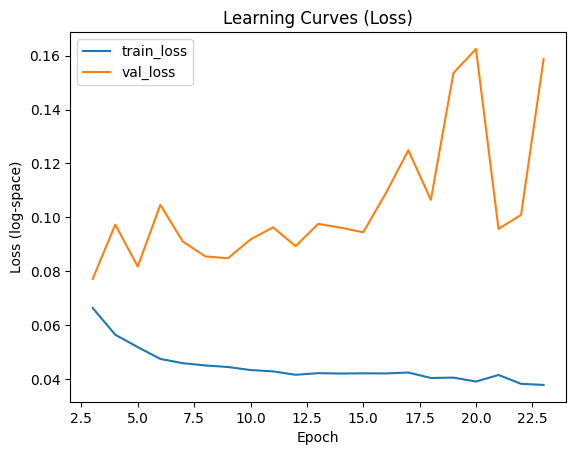

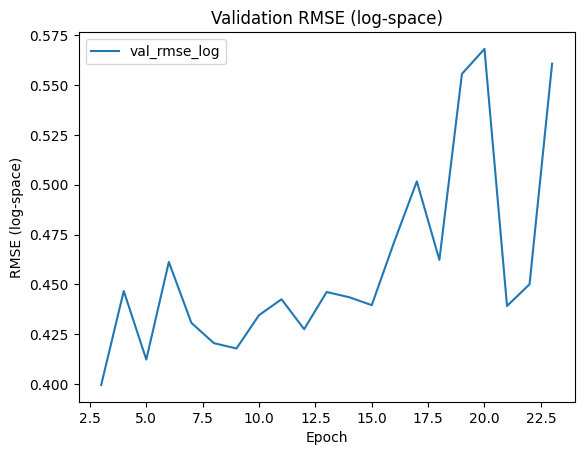

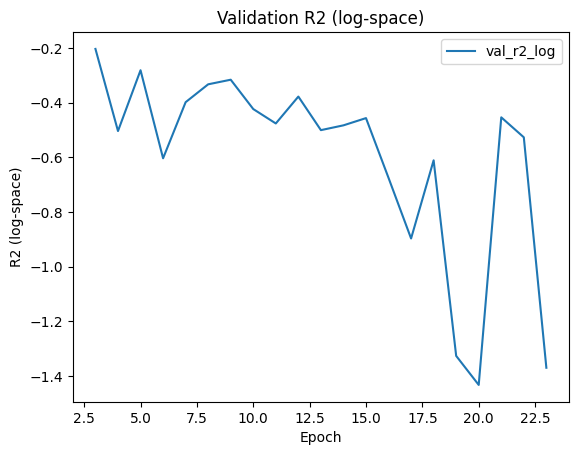

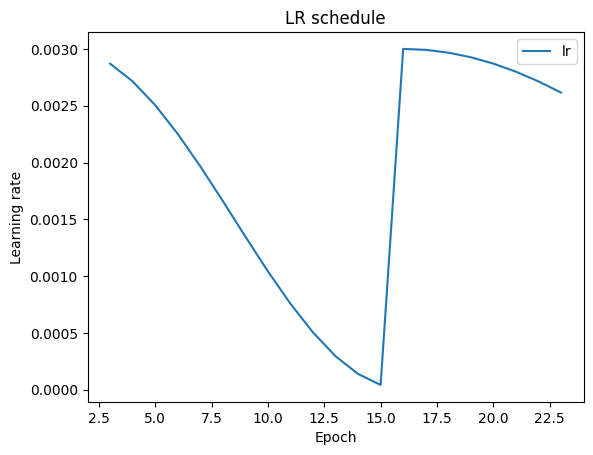

In [ ]:
luyo_df, histories = run_fixed_val_loyo(df, return_histories=True)

for yr in sorted(histories.keys()):
    print(f"\n=== Learning curves for LOYO test_year={yr} ===")
    plot_learning(histories[yr])   # your plotting function


In [ ]:
luyo_df

,test_year,val_years_used,n_train,n_val,n_test,best_val_loss_log,test_loss_log,rmse_log,mae_log,r2_log,rmse,mae,r2,corr_sq
0,2014,"[2016, 2024]",14415,3258,367,0.061351,0.128963,0.507865,0.469616,-3.756938,25.460872,23.302336,-3.496764,0.072199
1,2015,"[2014, 2016, 2024]",12994,3625,1421,0.042373,0.058180,0.333616,0.272313,-0.136256,13.380099,11.329002,-0.378136,0.375769
2,2016,"[2014, 2024]",14415,1810,1815,0.069184,0.068580,0.373152,0.325326,-0.059086,16.252499,13.532159,-0.156404,0.486598
3,2017,"[2014, 2016, 2024]",12358,3625,2057,0.065482,0.041315,0.305614,0.253528,-0.084496,15.294457,12.142020,-0.148934,0.414361
4,2018,"[2014, 2016, 2024]",12875,3625,1540,0.082909,0.028472,0.260740,0.202930,0.205730,10.511597,8.531927,0.191095,0.207018
5,2019,"[2014, 2016, 2024]",12168,3625,2247,0.051350,0.036875,0.271016,0.226975,-0.667756,11.594569,9.768798,-1.033999,0.263356
6,2020,"[2014, 2016, 2024]",12405,3625,2010,0.055600,0.039386,0.282211,0.221643,0.196736,14.095090,11.142662,0.101723,0.388004
7,2021,"[2014, 2016, 2024]",12505,3625,1910,0.047385,0.073184,0.384280,0.341368,-1.033600,18.538596,16.647053,-1.404191,0.293023
8,2022,"[2014, 2016, 2024]",12430,3625,1985,0.051447,0.036557,0.270155,0.216618,0.290776,12.241299,9.905165,0.216624,0.347127
9,2023,"[2014, 2016, 2024]",13170,3625,1245,0.059866,0.062931,0.358542,0.296867,-0.748902,15.389438,12.521205,-0.853932,0.175673


### Corn


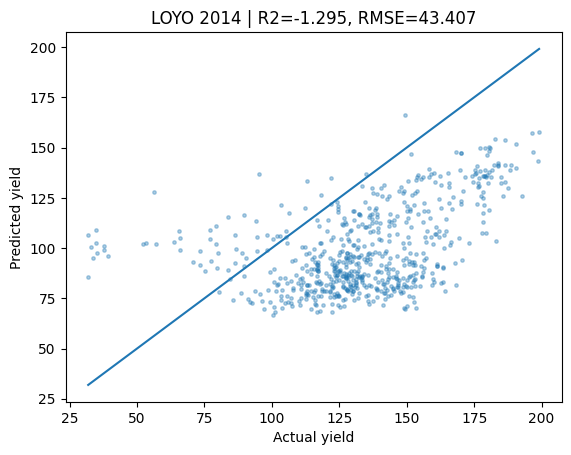

Done test_year=2014 | val_years=[2016, 2024] | RMSE=43.407 | R2=-1.295 | Corr_sq=0.215


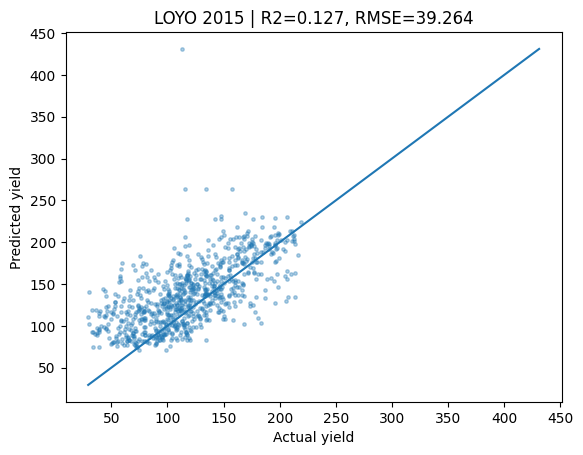

Done test_year=2015 | val_years=[2014, 2016, 2024] | RMSE=39.264 | R2=0.127 | Corr_sq=0.412


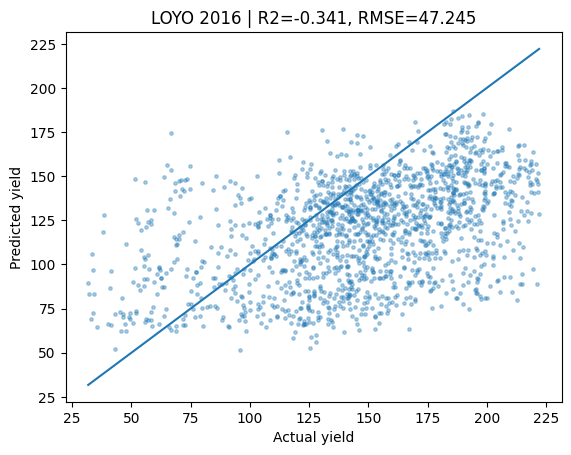

Done test_year=2016 | val_years=[2014, 2024] | RMSE=47.245 | R2=-0.341 | Corr_sq=0.198


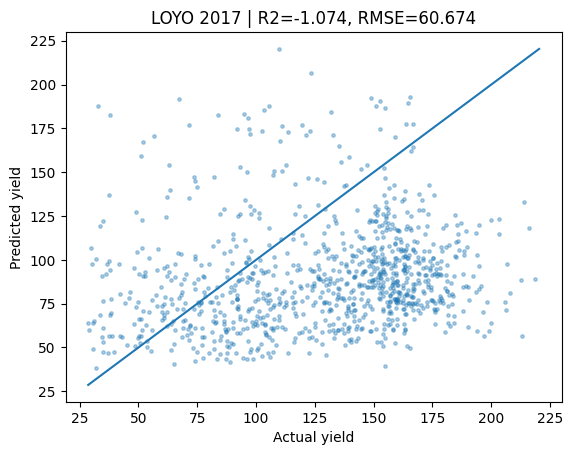

Done test_year=2017 | val_years=[2014, 2016, 2024] | RMSE=60.674 | R2=-1.074 | Corr_sq=0.022


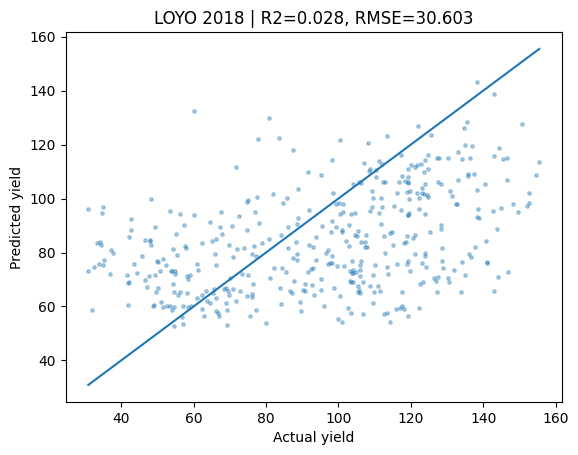

Done test_year=2018 | val_years=[2014, 2016, 2024] | RMSE=30.603 | R2=0.028 | Corr_sq=0.181


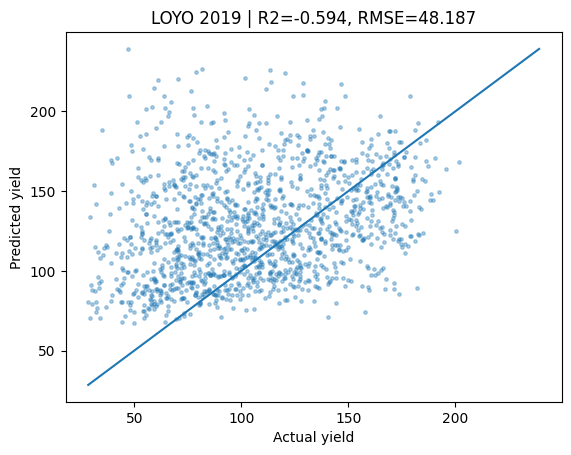

Done test_year=2019 | val_years=[2014, 2016, 2024] | RMSE=48.187 | R2=-0.594 | Corr_sq=0.076


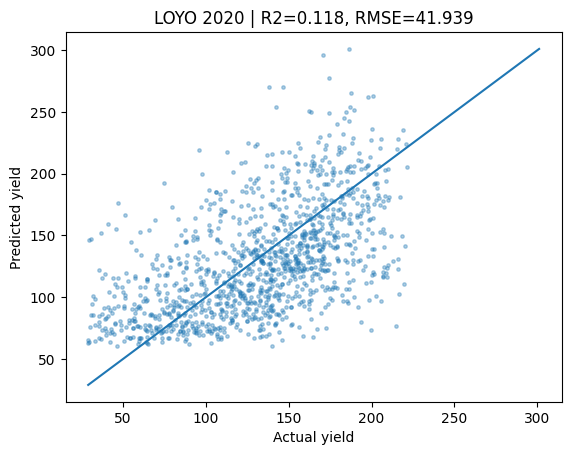

Done test_year=2020 | val_years=[2014, 2016, 2024] | RMSE=41.939 | R2=0.118 | Corr_sq=0.305


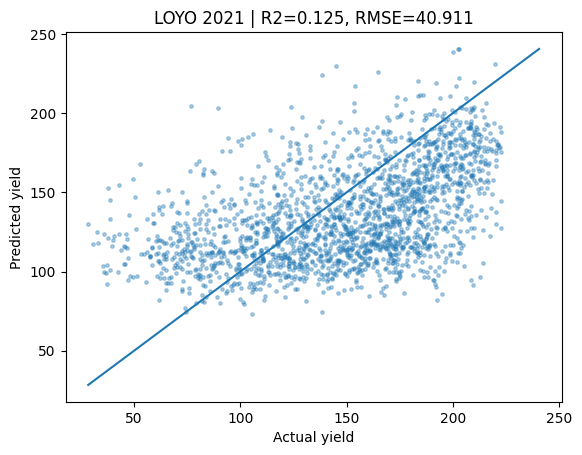

Done test_year=2021 | val_years=[2014, 2016, 2024] | RMSE=40.911 | R2=0.125 | Corr_sq=0.239


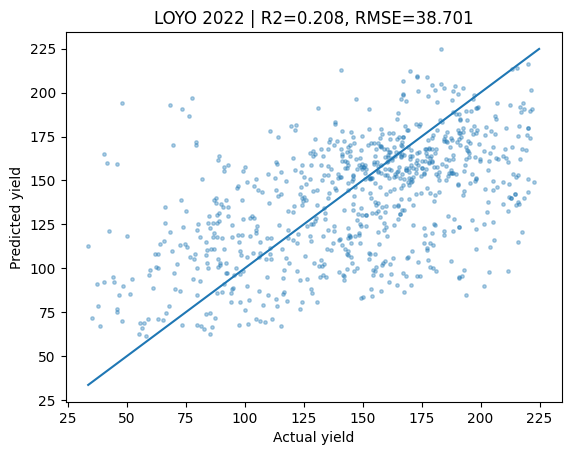

Done test_year=2022 | val_years=[2014, 2016, 2024] | RMSE=38.701 | R2=0.208 | Corr_sq=0.290


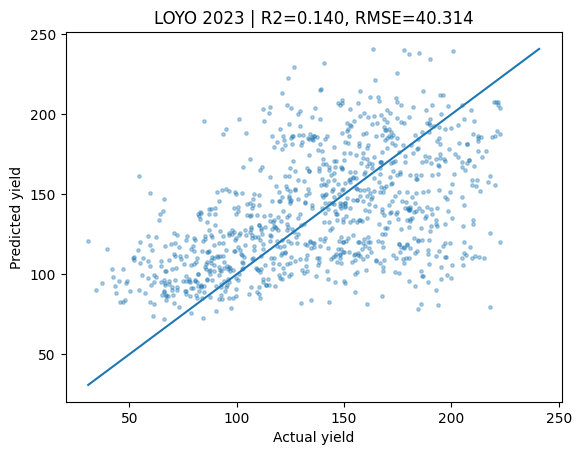

Done test_year=2023 | val_years=[2014, 2016, 2024] | RMSE=40.314 | R2=0.140 | Corr_sq=0.246


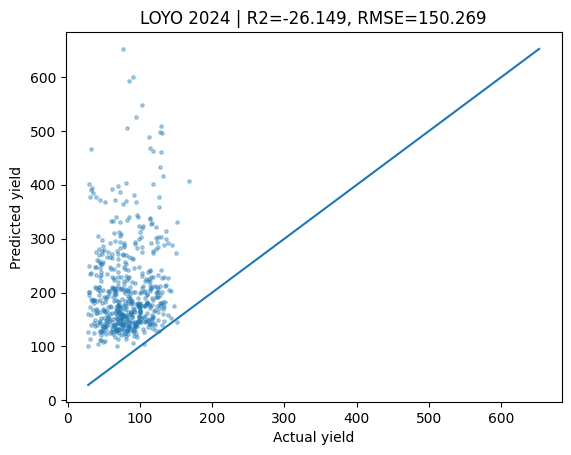

Done test_year=2024 | val_years=[2014, 2016] | RMSE=150.269 | R2=-26.149 | Corr_sq=0.015

=== Learning curves for LOYO test_year=2014 ===


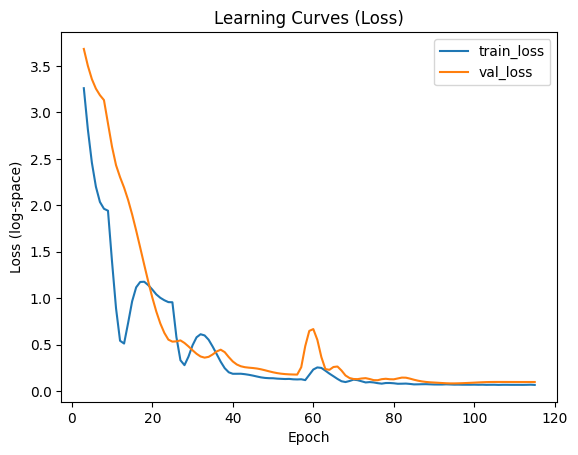

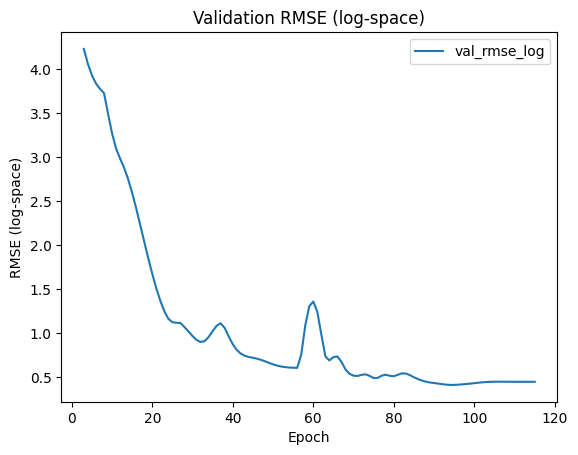

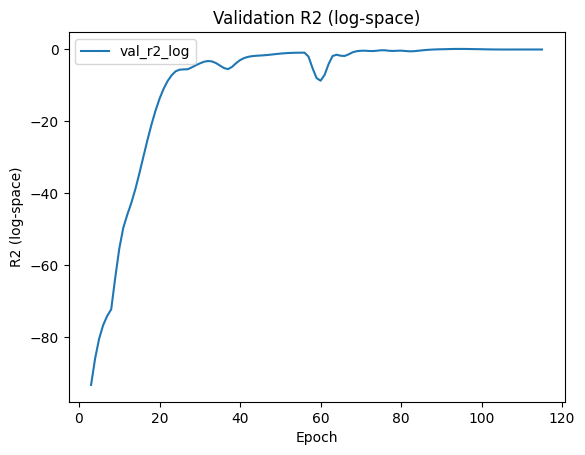

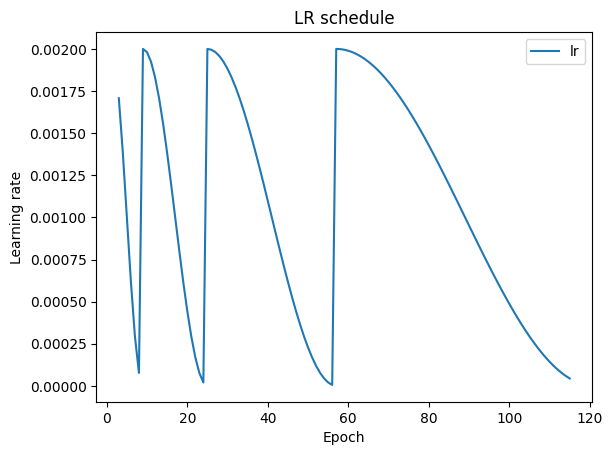


=== Learning curves for LOYO test_year=2015 ===


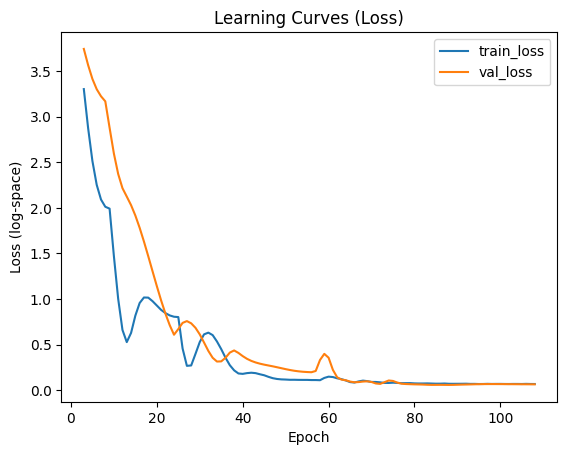

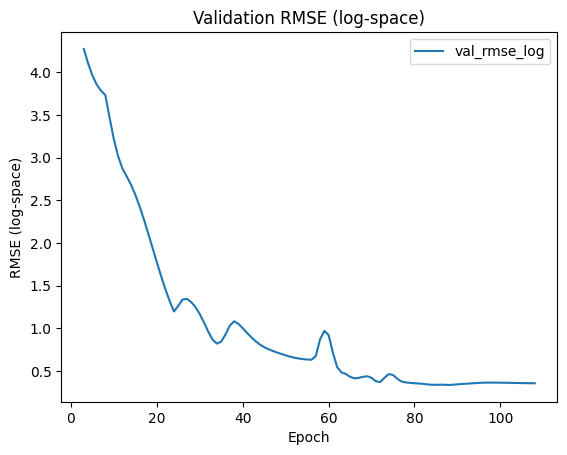

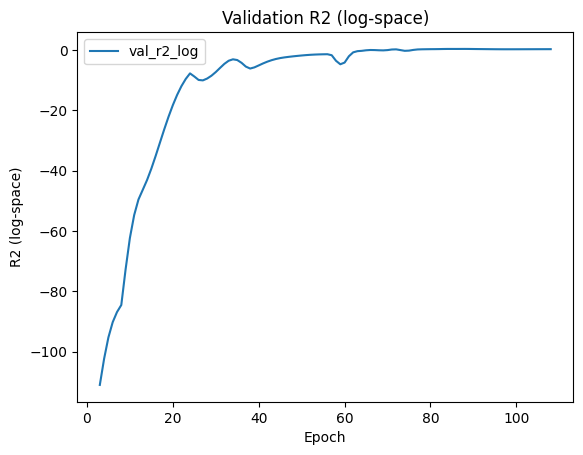

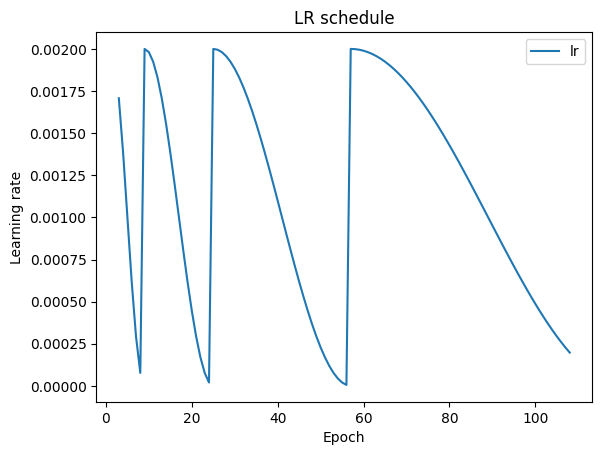


=== Learning curves for LOYO test_year=2016 ===


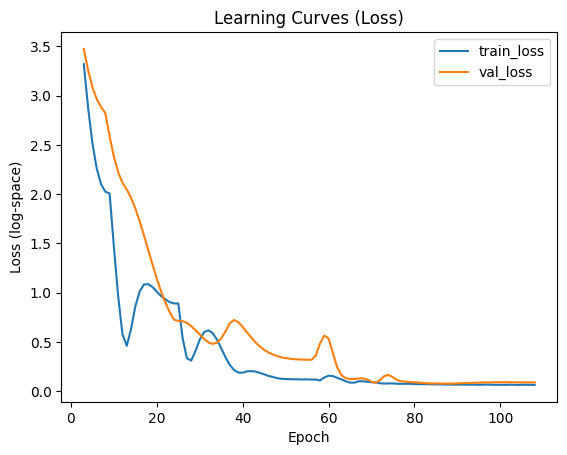

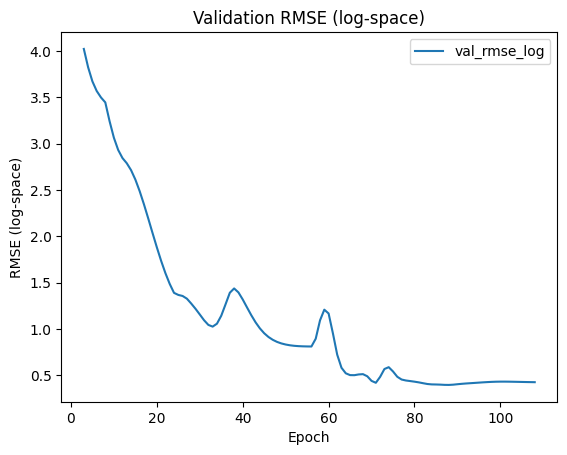

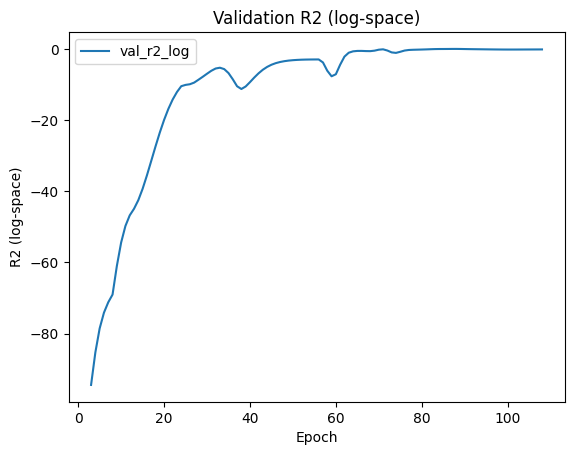

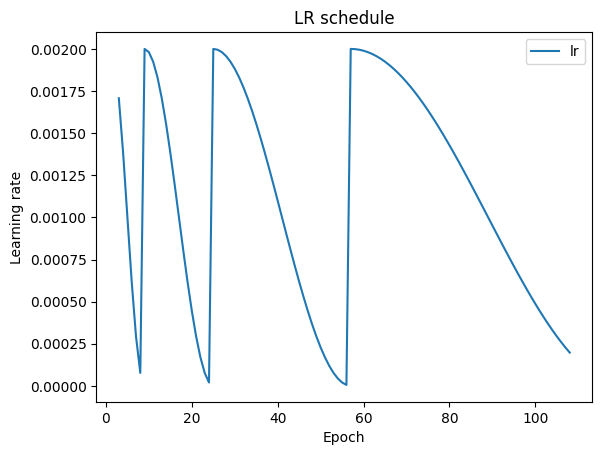


=== Learning curves for LOYO test_year=2017 ===


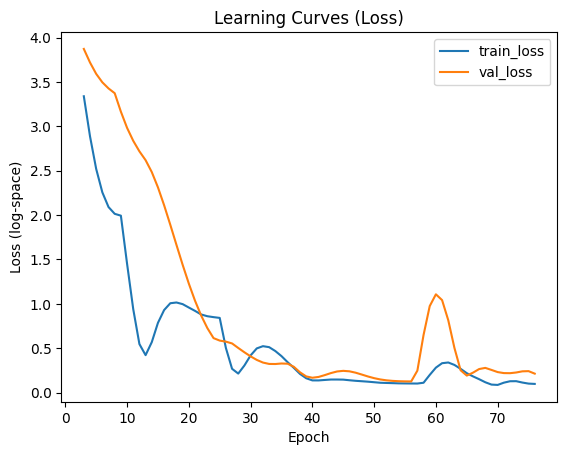

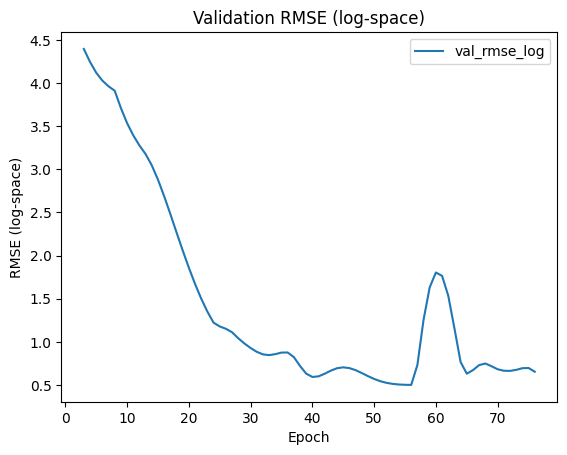

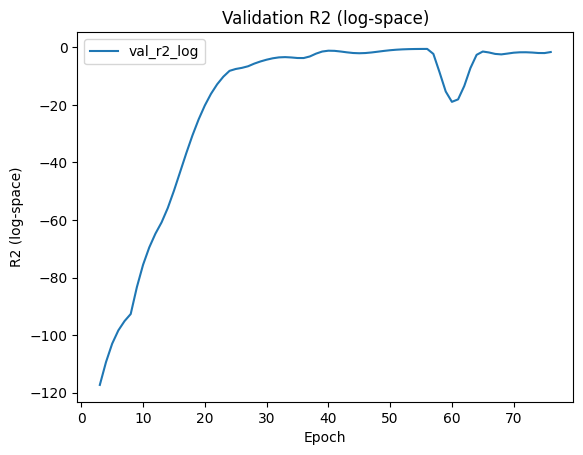

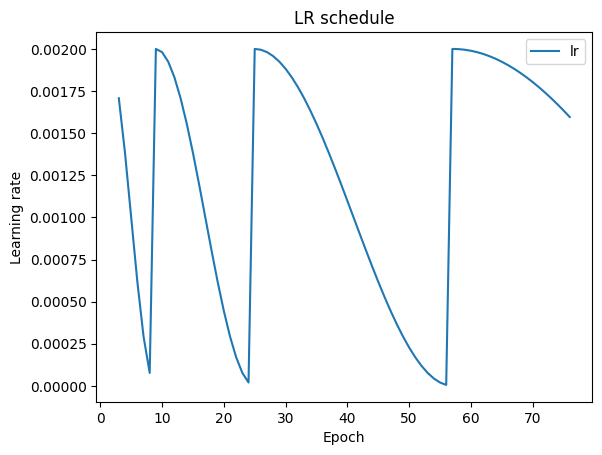


=== Learning curves for LOYO test_year=2018 ===


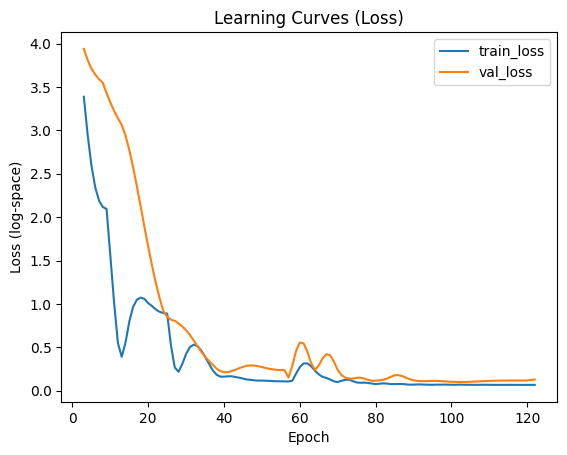

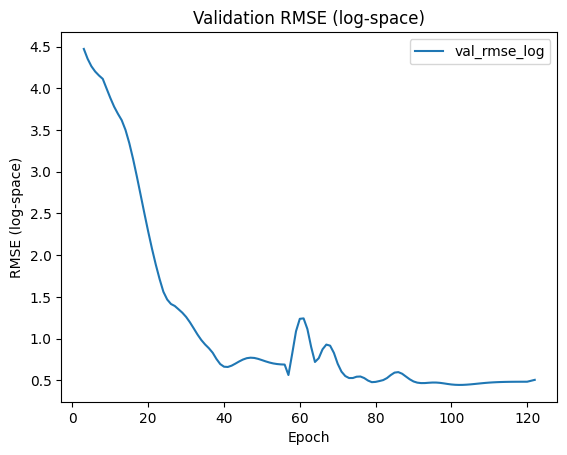

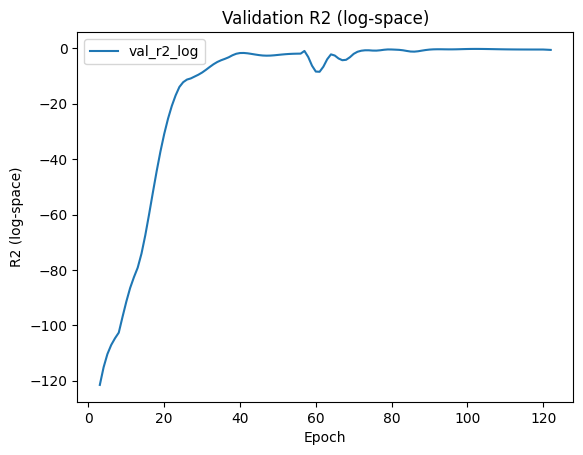

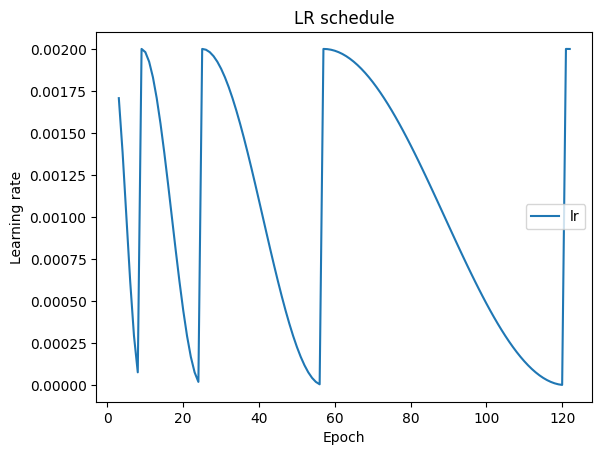


=== Learning curves for LOYO test_year=2019 ===


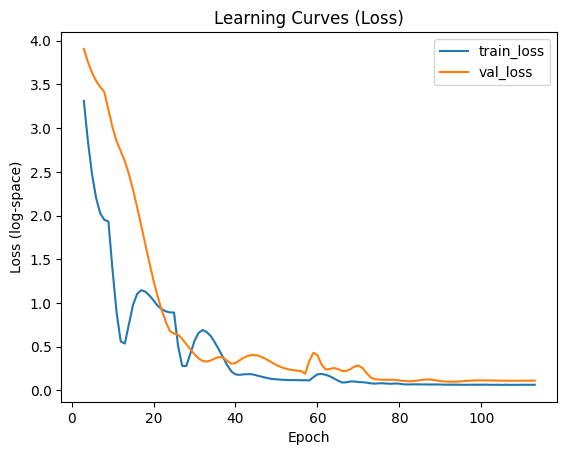

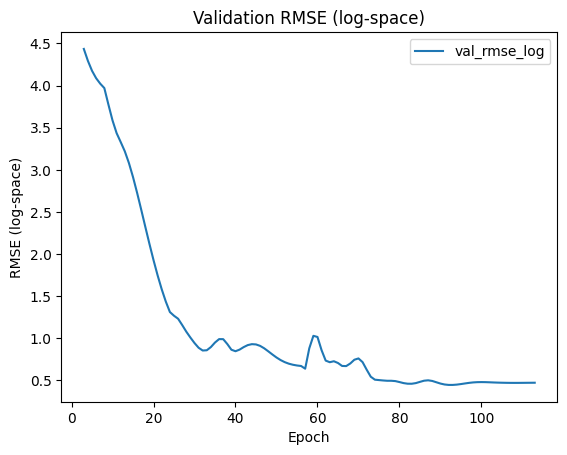

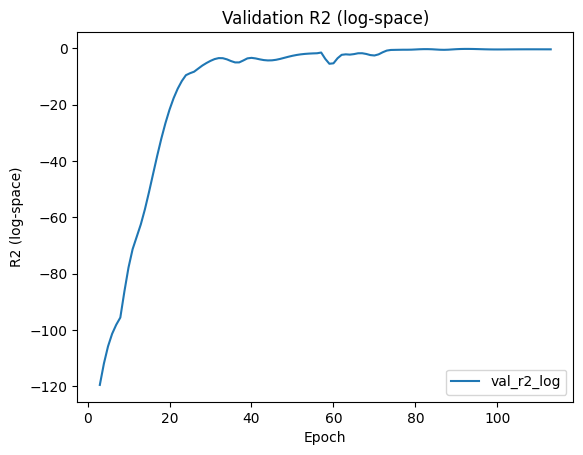

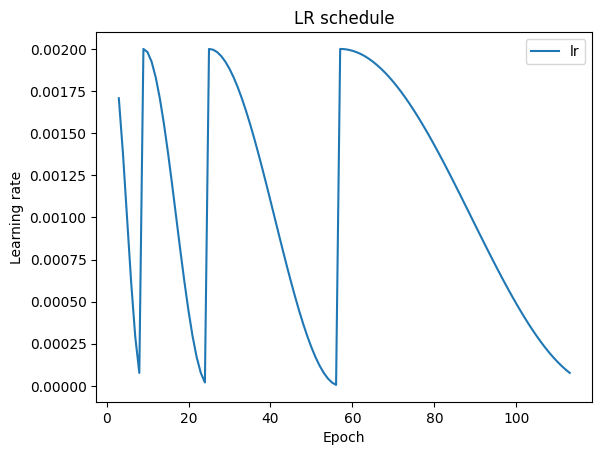


=== Learning curves for LOYO test_year=2020 ===


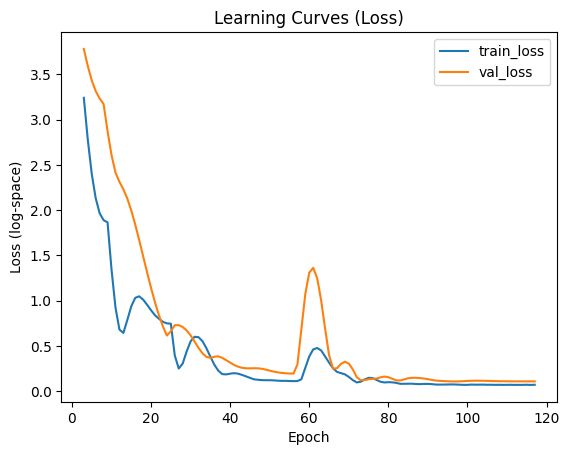

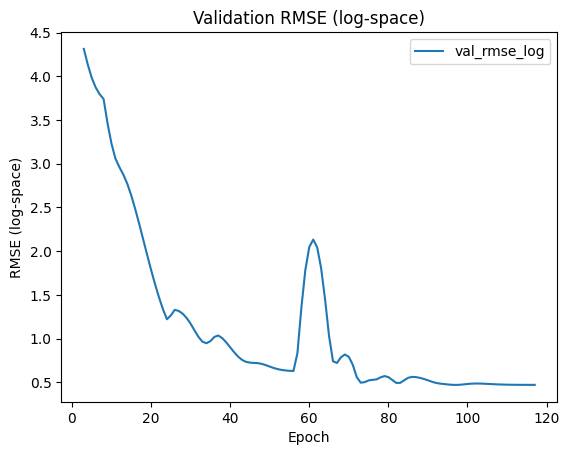

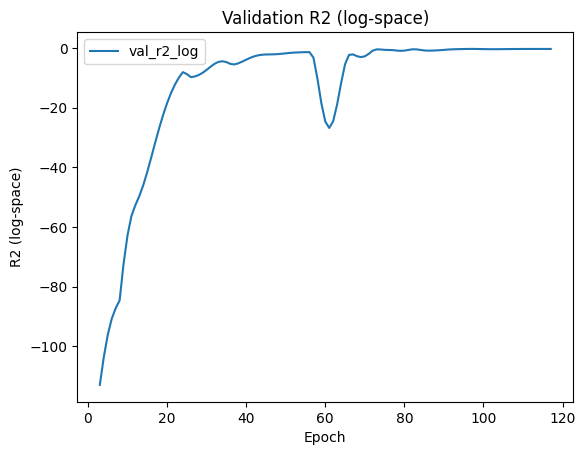

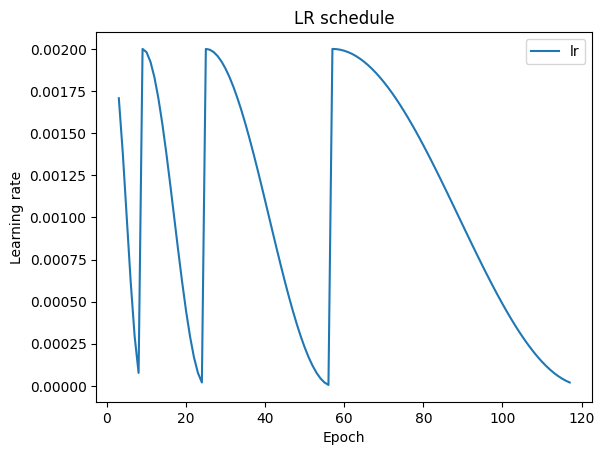


=== Learning curves for LOYO test_year=2021 ===


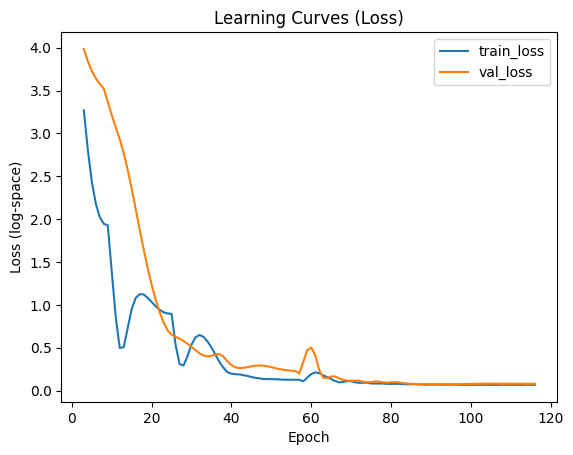

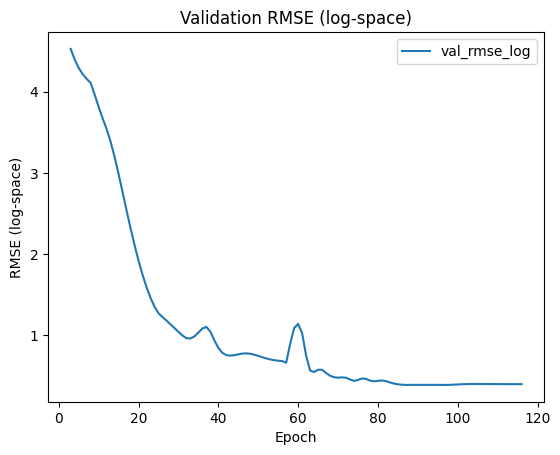

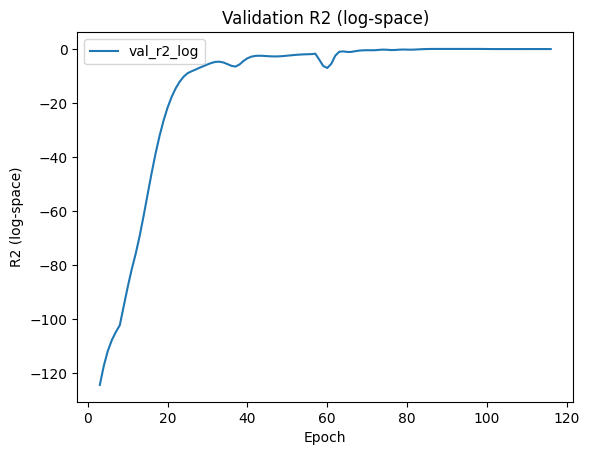

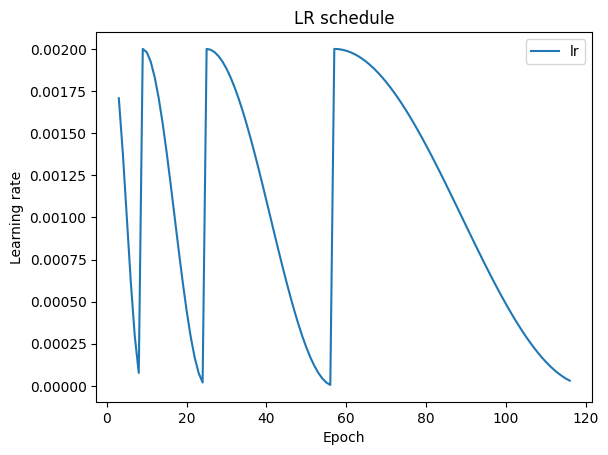


=== Learning curves for LOYO test_year=2022 ===


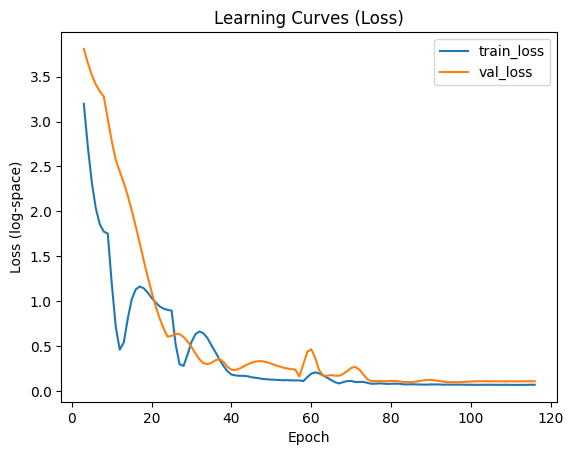

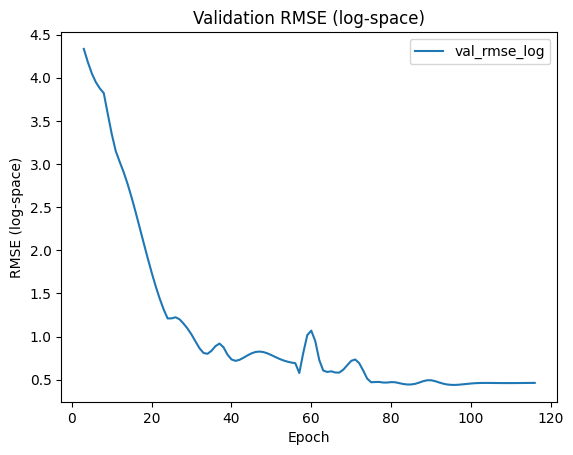

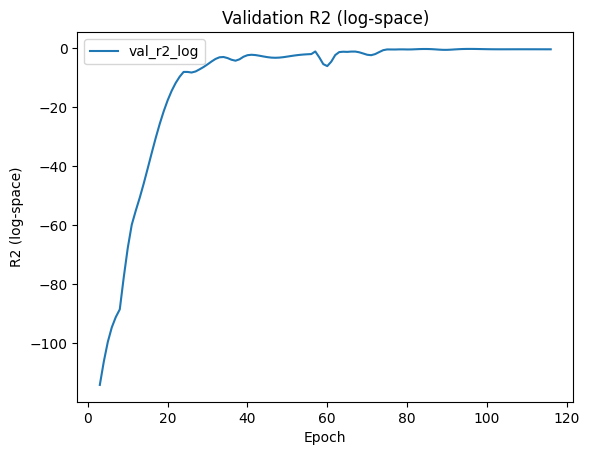

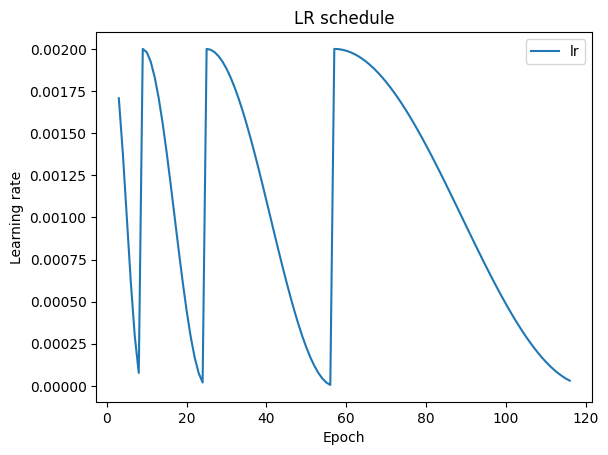


=== Learning curves for LOYO test_year=2023 ===


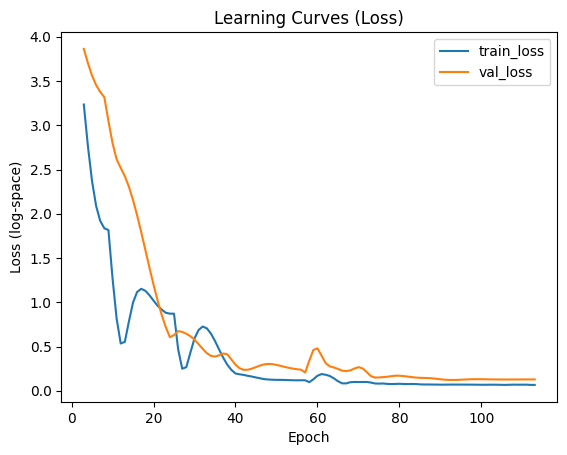

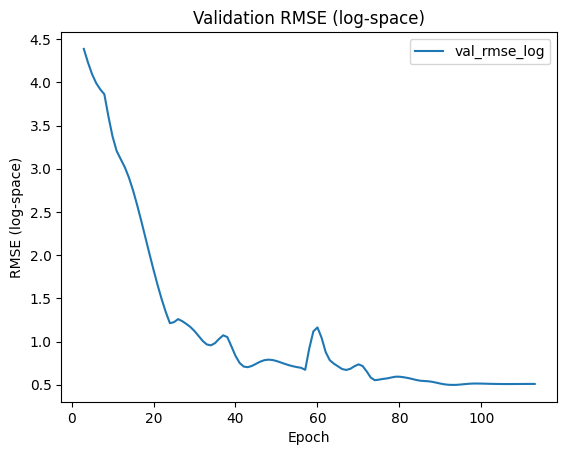

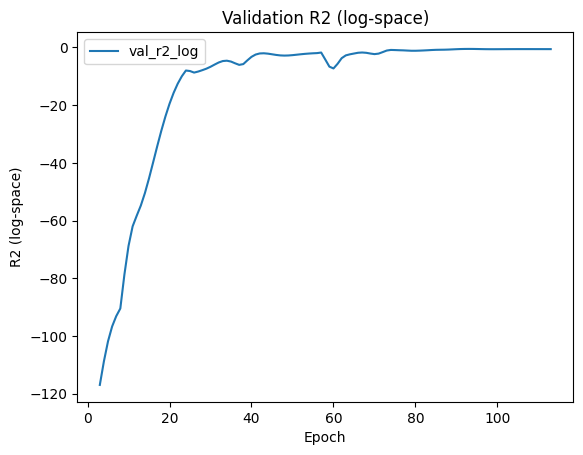

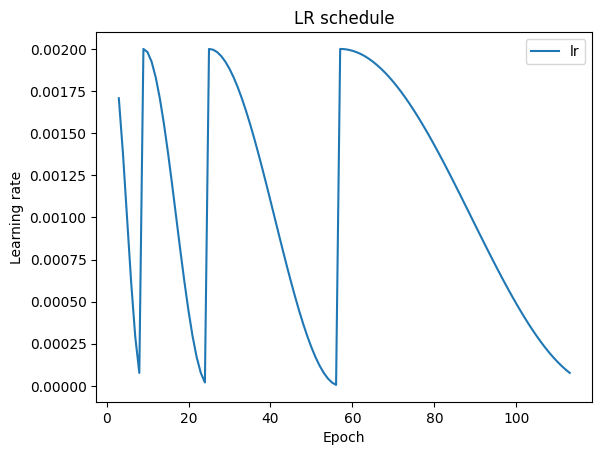


=== Learning curves for LOYO test_year=2024 ===


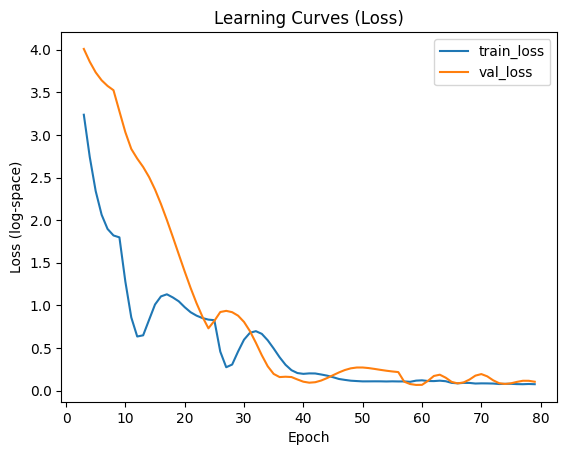

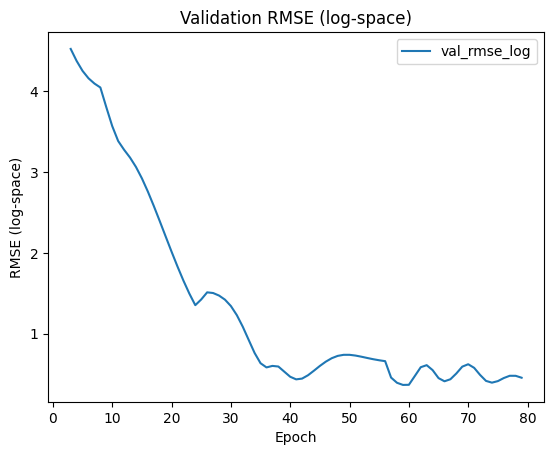

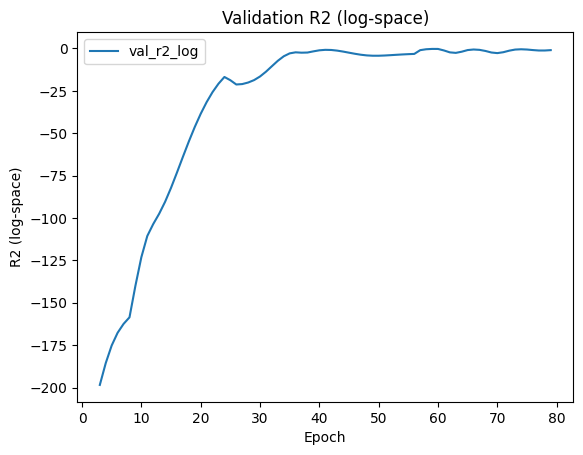

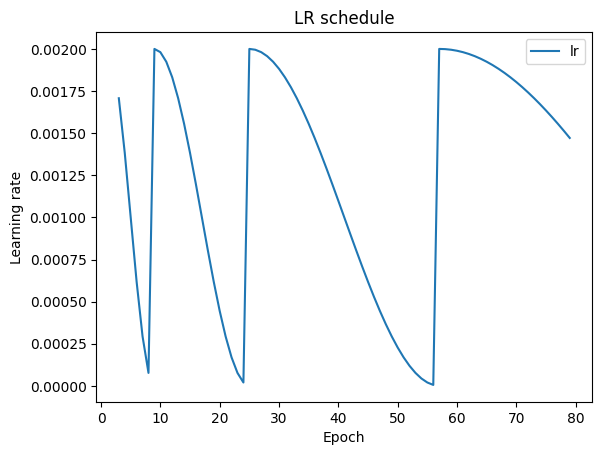

In [ ]:
luyo_df, histories = run_fixed_val_loyo(df, return_histories=True)

for yr in sorted(histories.keys()):
    print(f"\n=== Learning curves for LOYO test_year={yr} ===")
    plot_learning(histories[yr])   # your plotting function


In [ ]:
luyo_df

,test_year,val_years_used,n_train,n_val,n_test,best_val_loss_log,test_loss_log,rmse_log,mae_log,r2_log,rmse,mae,r2,corr_sq
0,2014,"[2016, 2024]",8610,2150,636,0.083622,0.079176,0.396110,0.350905,-1.281640,43.406953,39.331459,-1.295380,0.215235
1,2015,"[2014, 2016, 2024]",7786,2786,824,0.056876,0.068841,0.360582,0.259145,0.160049,39.264008,29.470020,0.126994,0.411982
2,2016,"[2014, 2024]",8610,1195,1591,0.078347,0.065823,0.376652,0.302940,-0.241860,47.245220,38.623684,-0.341192,0.198400
3,2017,"[2014, 2016, 2024]",7628,2786,982,0.124830,0.155646,0.560117,0.485952,-0.871148,60.674100,52.038425,-1.073873,0.021818
4,2018,"[2014, 2016, 2024]",8197,2786,413,0.099160,0.065542,0.362098,0.291275,0.056928,30.602750,25.041378,0.027640,0.181300
5,2019,"[2014, 2016, 2024]",7194,2786,1416,0.099373,0.103949,0.456589,0.345299,-0.369927,48.187497,37.335365,-0.593829,0.075775
6,2020,"[2014, 2016, 2024]",7394,2786,1216,0.107782,0.059462,0.360678,0.277197,0.233940,41.938983,33.279144,0.117767,0.305492
7,2021,"[2014, 2016, 2024]",6611,2786,1999,0.075592,0.053557,0.327816,0.255417,0.145754,40.911002,33.681389,0.124941,0.238749
8,2022,"[2014, 2016, 2024]",7812,2786,798,0.096312,0.049806,0.309173,0.231260,0.253768,38.700759,30.295822,0.208291,0.289752
9,2023,"[2014, 2016, 2024]",7648,2786,962,0.121821,0.049016,0.314107,0.246849,0.235510,40.314058,32.277245,0.139769,0.245860


### Wheat results:

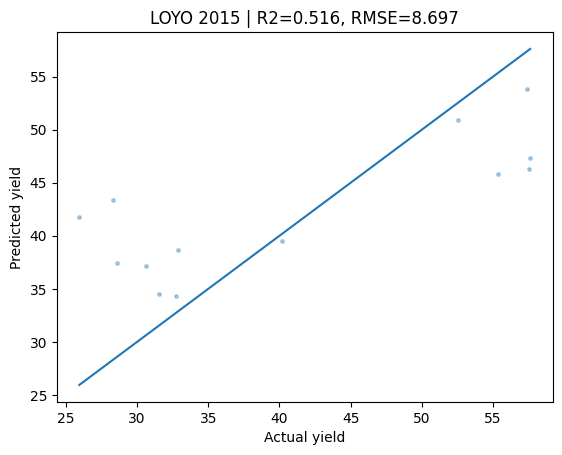

Done test_year=2015 | val_years=[2016, 2022] | RMSE=8.697 | R2=0.516 | Corr_sq=0.635


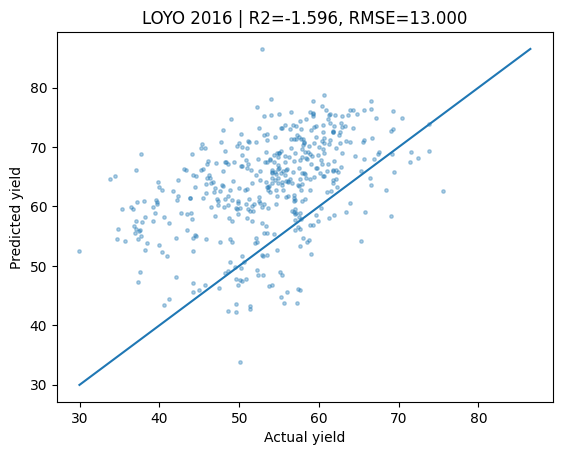

Done test_year=2016 | val_years=[2015, 2022] | RMSE=13.000 | R2=-1.596 | Corr_sq=0.198


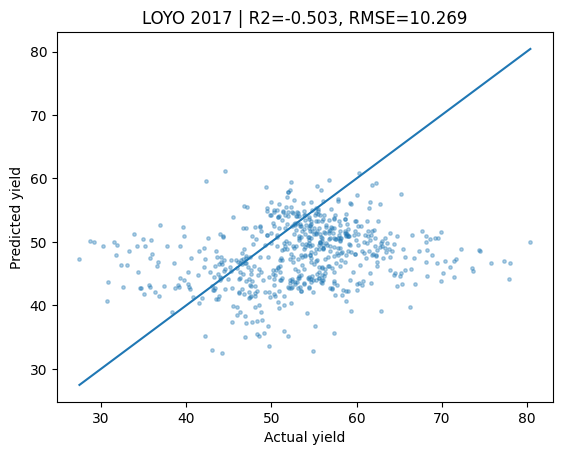

Done test_year=2017 | val_years=[2015, 2016, 2022] | RMSE=10.269 | R2=-0.503 | Corr_sq=0.043


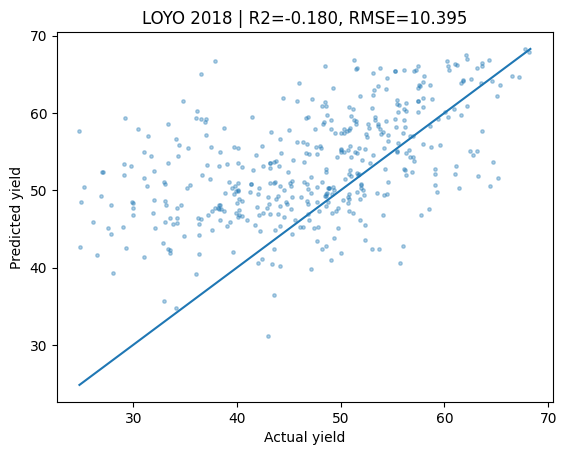

Done test_year=2018 | val_years=[2015, 2016, 2022] | RMSE=10.395 | R2=-0.180 | Corr_sq=0.269


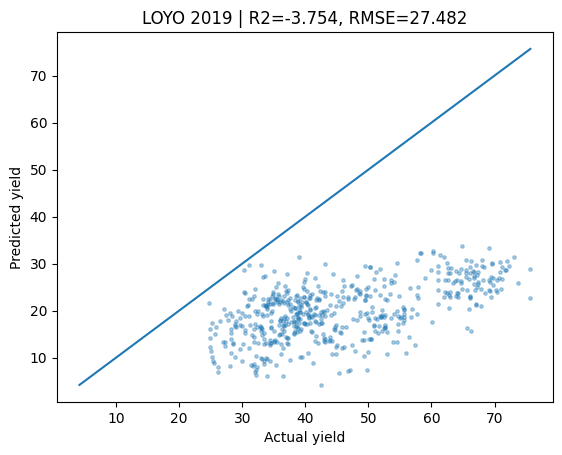

Done test_year=2019 | val_years=[2015, 2016, 2022] | RMSE=27.482 | R2=-3.754 | Corr_sq=0.314


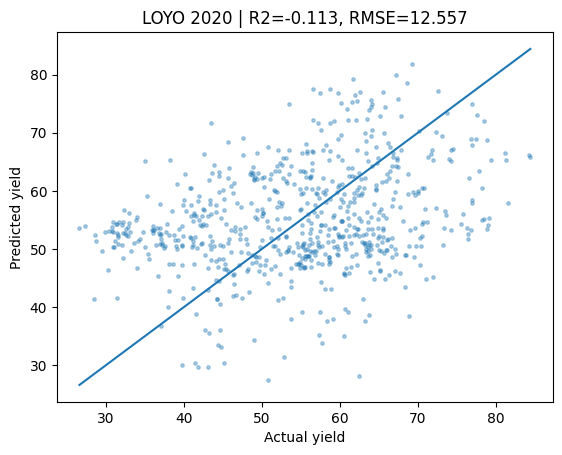

Done test_year=2020 | val_years=[2015, 2016, 2022] | RMSE=12.557 | R2=-0.113 | Corr_sq=0.089


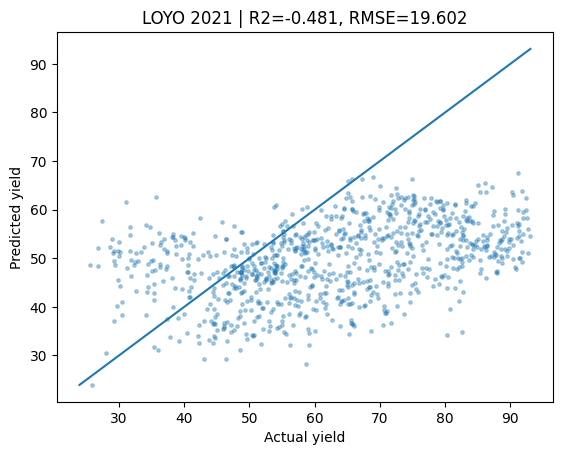

Done test_year=2021 | val_years=[2015, 2016, 2022] | RMSE=19.602 | R2=-0.481 | Corr_sq=0.178


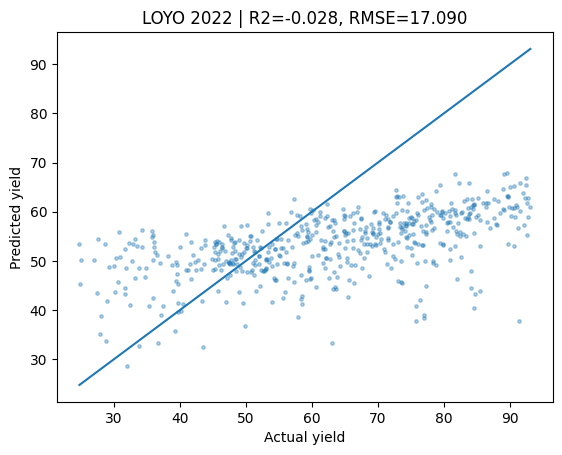

Done test_year=2022 | val_years=[2015, 2016] | RMSE=17.090 | R2=-0.028 | Corr_sq=0.331


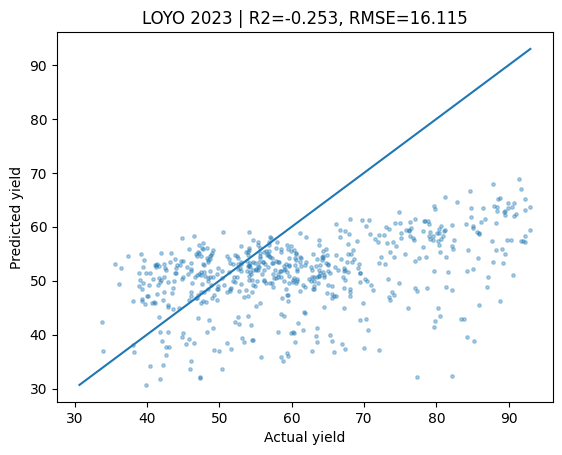

Done test_year=2023 | val_years=[2015, 2016, 2022] | RMSE=16.115 | R2=-0.253 | Corr_sq=0.204


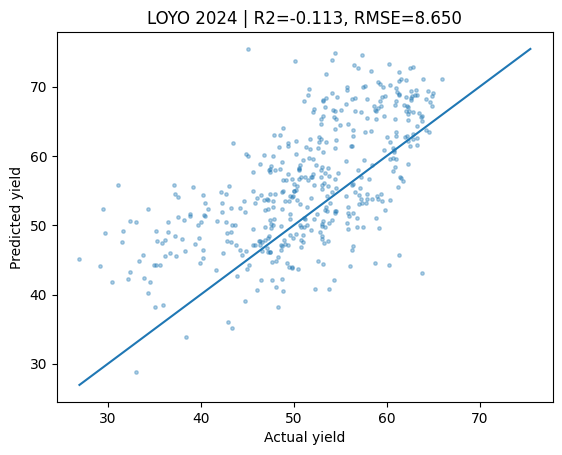

Done test_year=2024 | val_years=[2015, 2016, 2022] | RMSE=8.650 | R2=-0.113 | Corr_sq=0.400

=== Learning curves for LOYO test_year=2015 ===


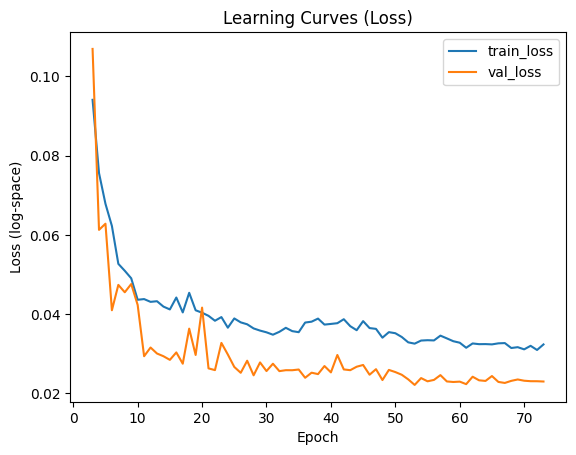

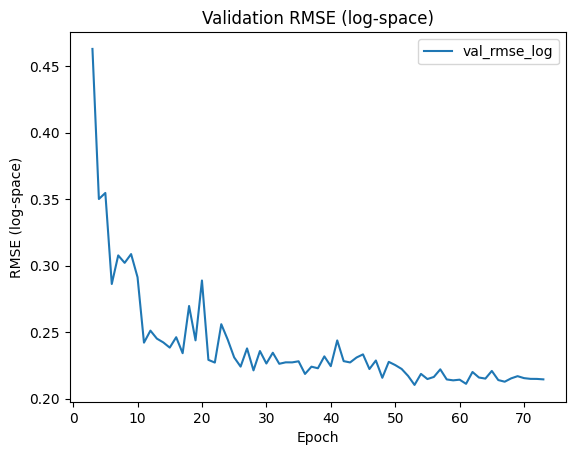

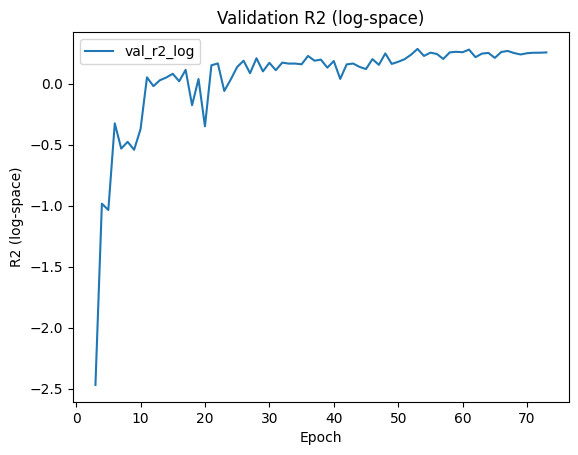

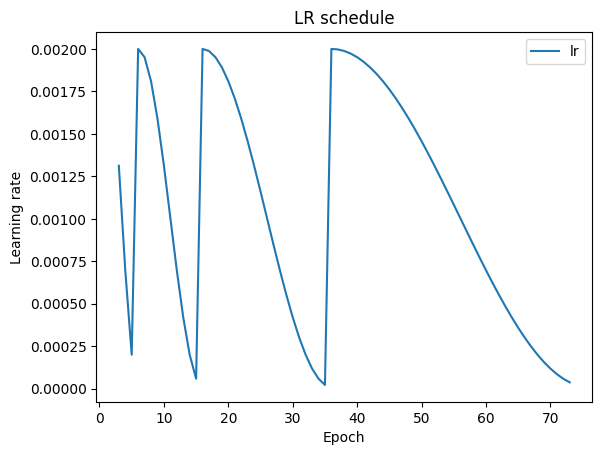


=== Learning curves for LOYO test_year=2016 ===


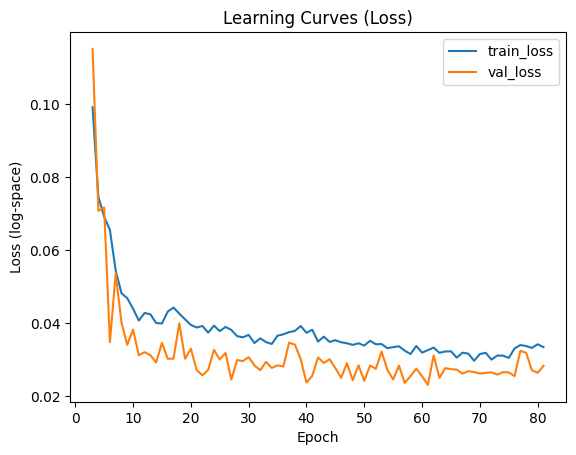

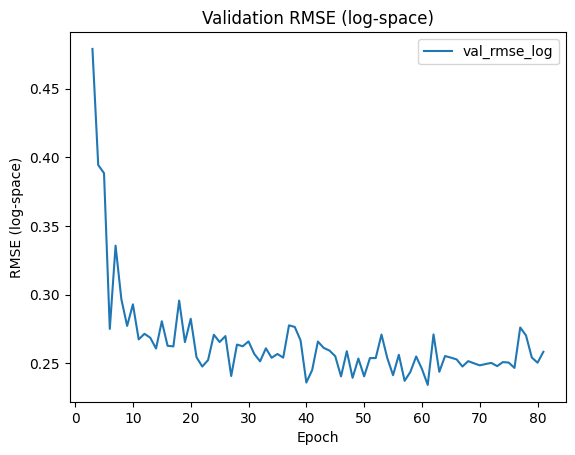

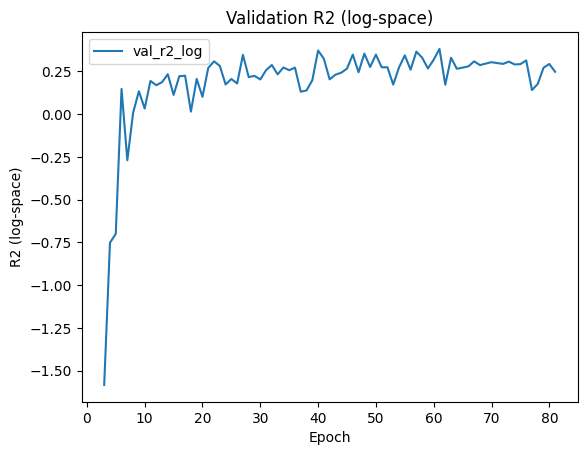

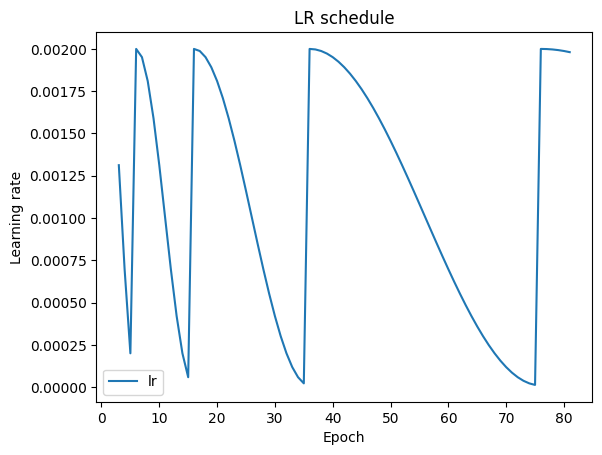


=== Learning curves for LOYO test_year=2017 ===


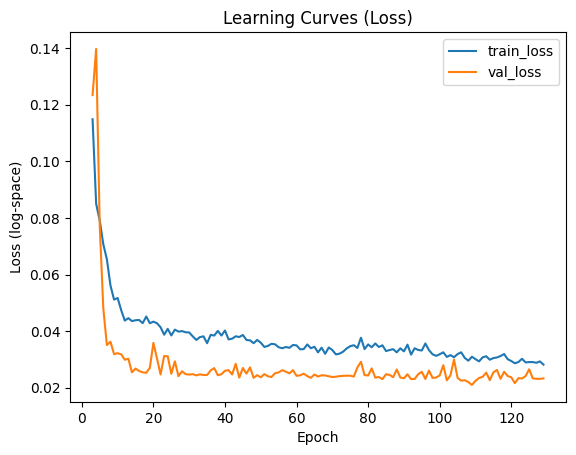

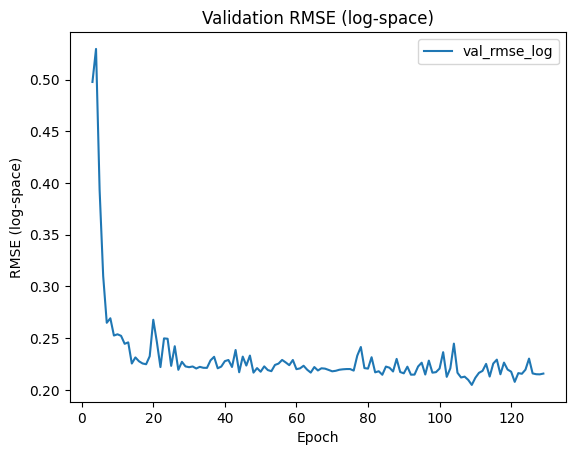

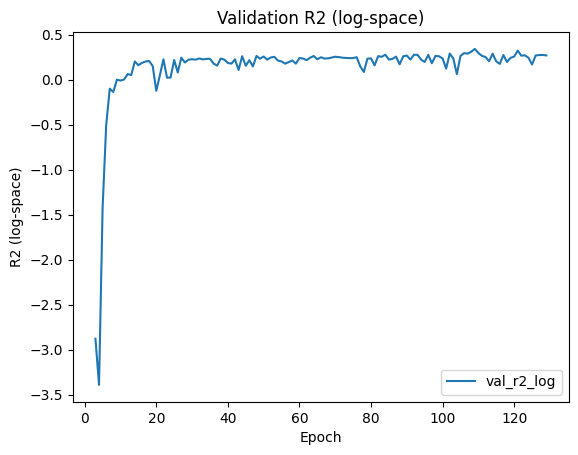

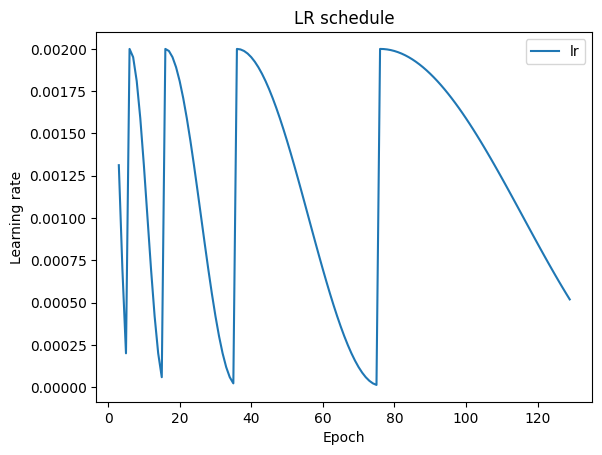


=== Learning curves for LOYO test_year=2018 ===


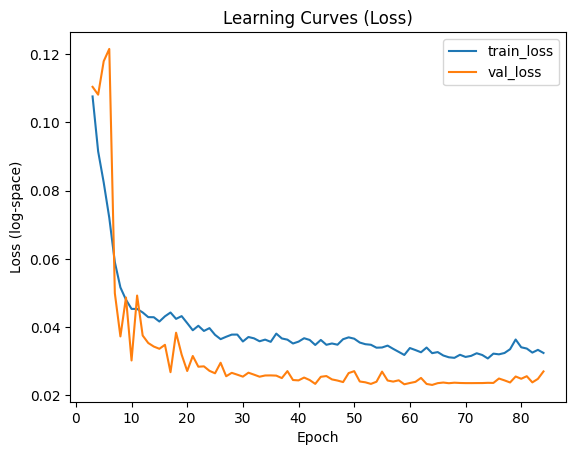

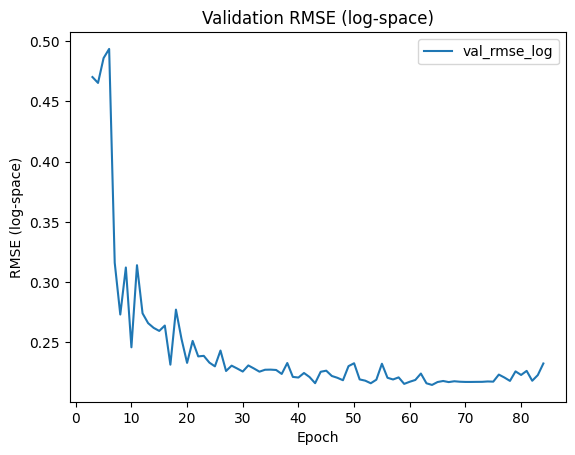

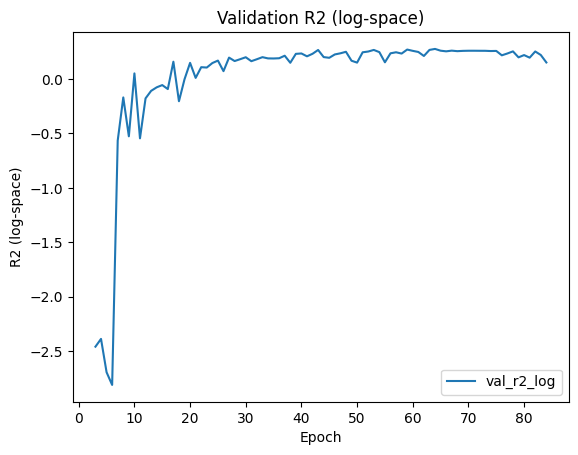

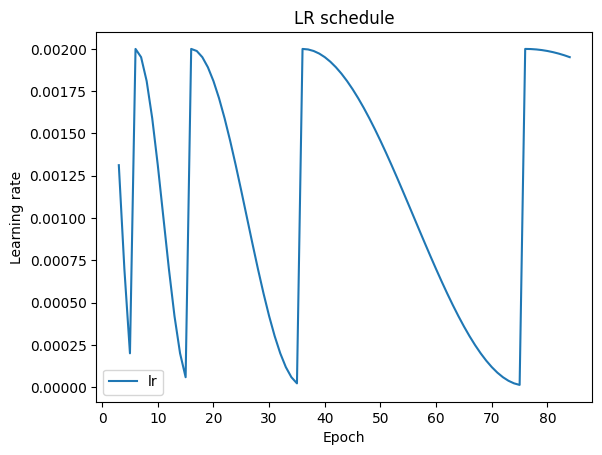


=== Learning curves for LOYO test_year=2019 ===


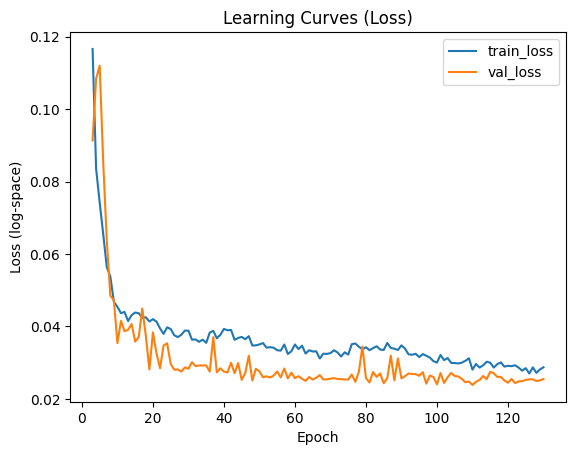

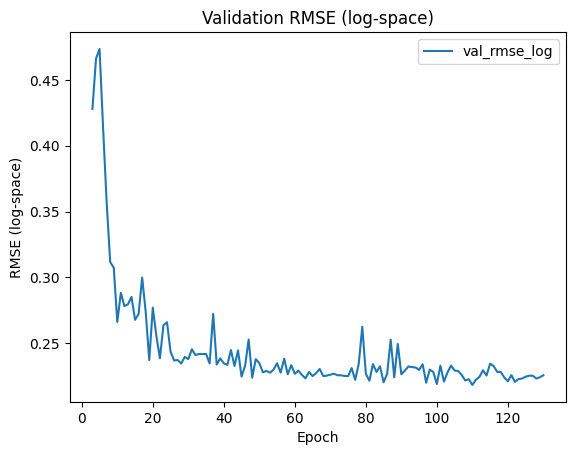

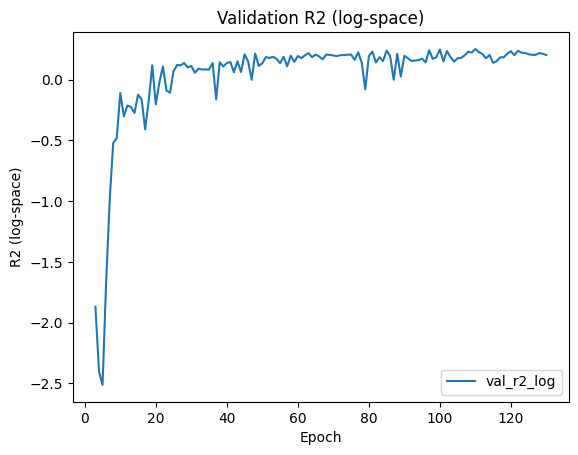

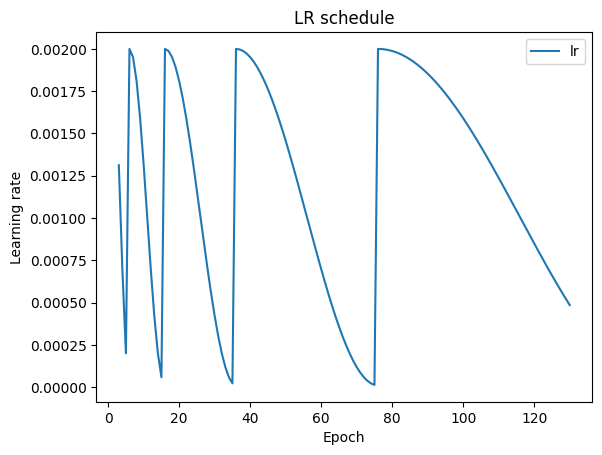


=== Learning curves for LOYO test_year=2020 ===


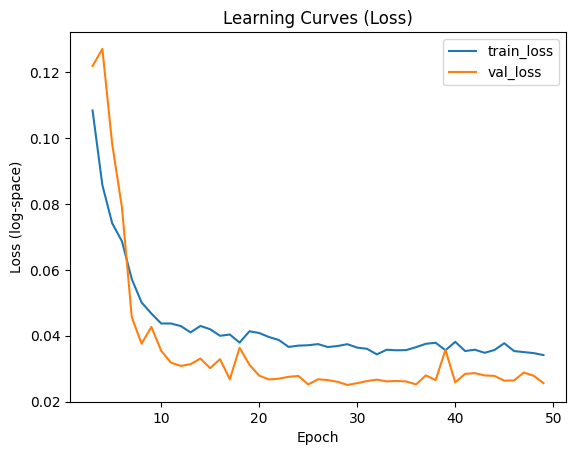

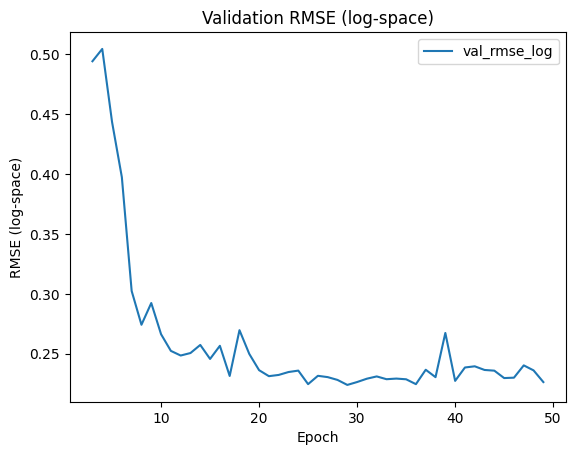

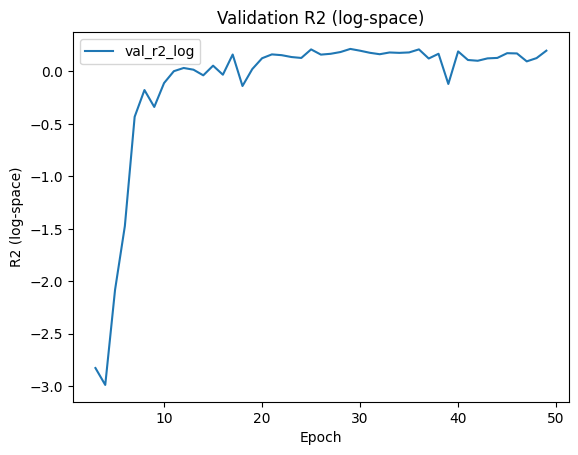

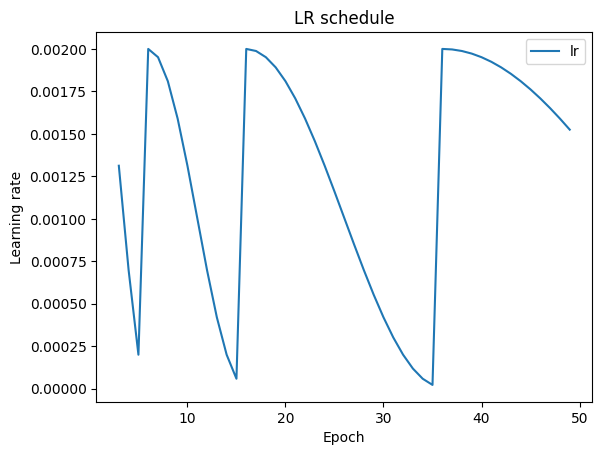


=== Learning curves for LOYO test_year=2021 ===


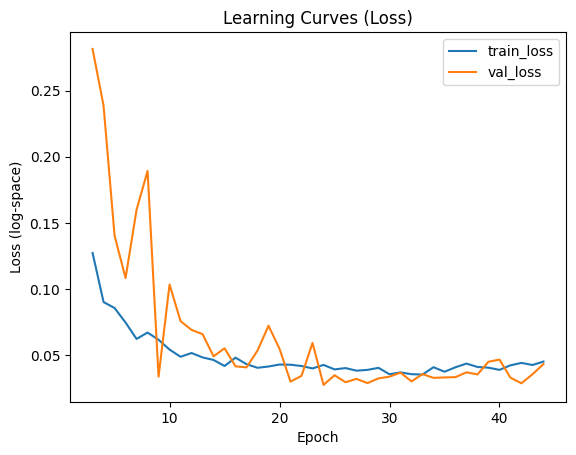

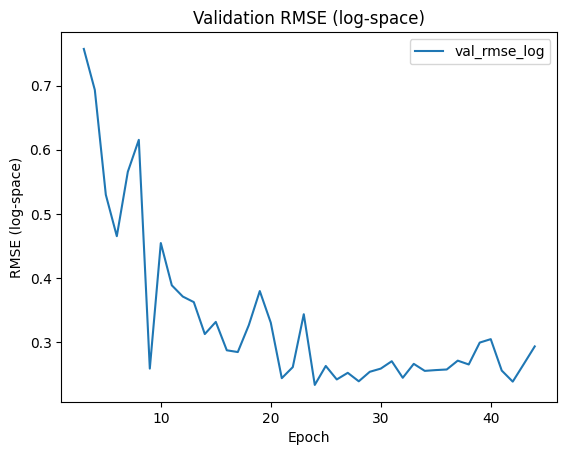

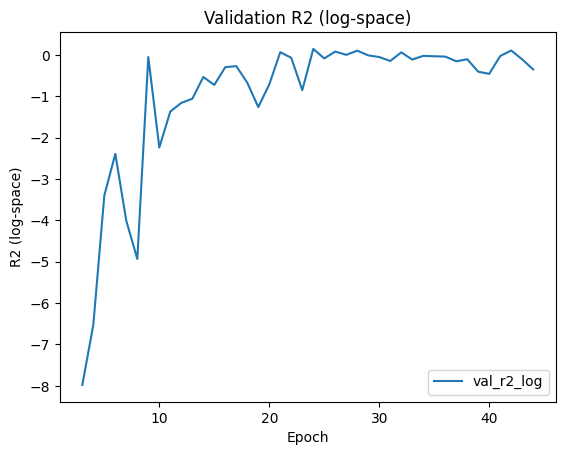

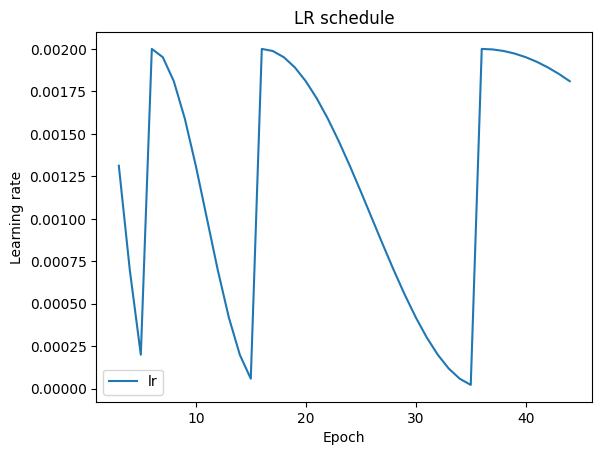


=== Learning curves for LOYO test_year=2022 ===


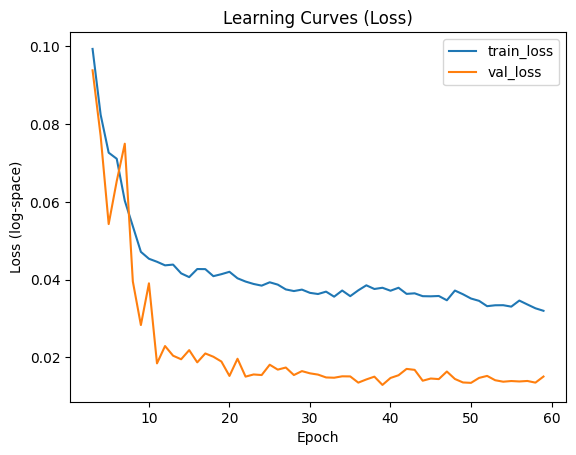

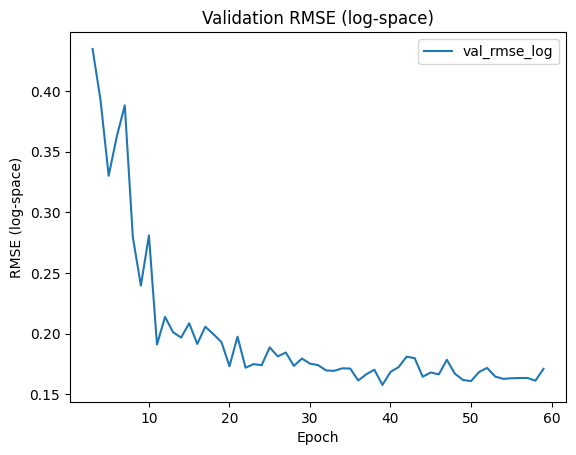

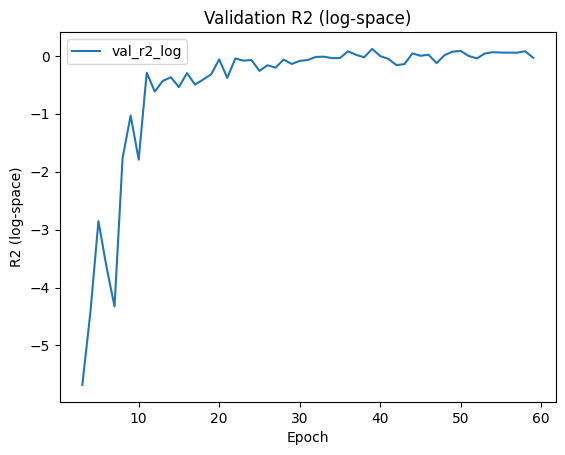

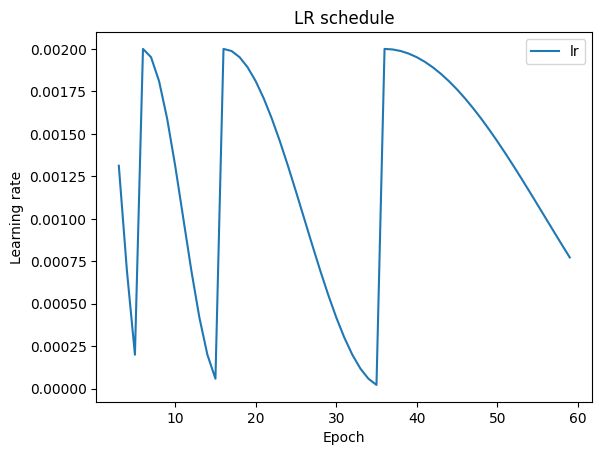


=== Learning curves for LOYO test_year=2023 ===


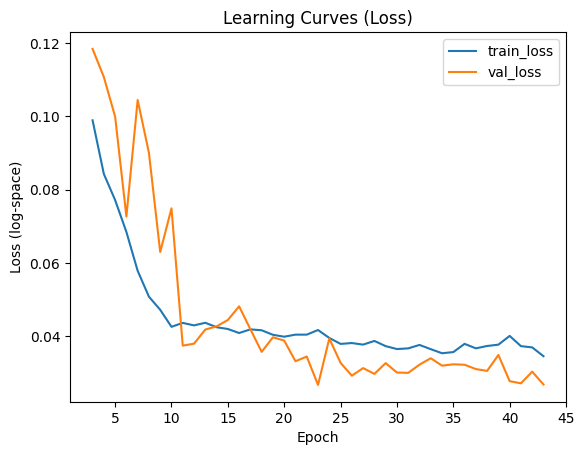

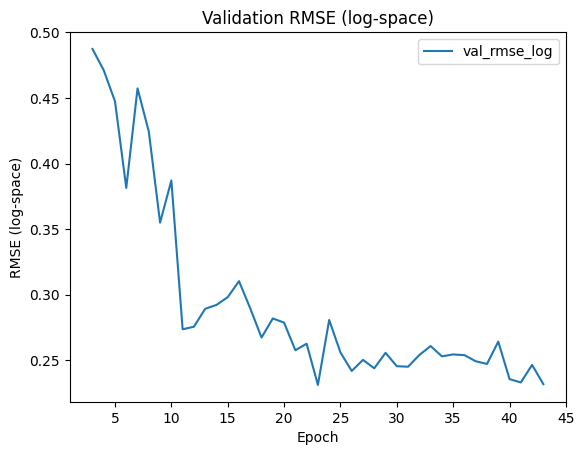

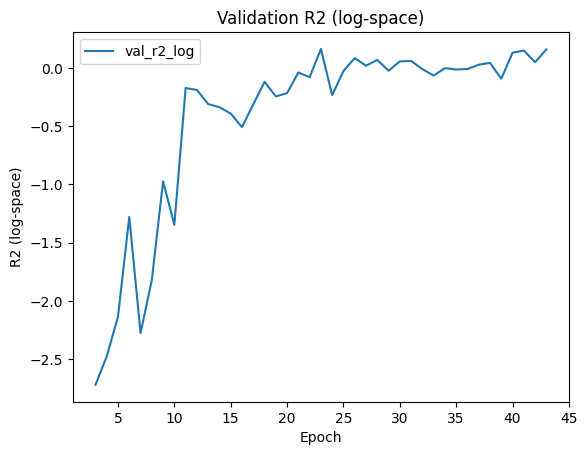

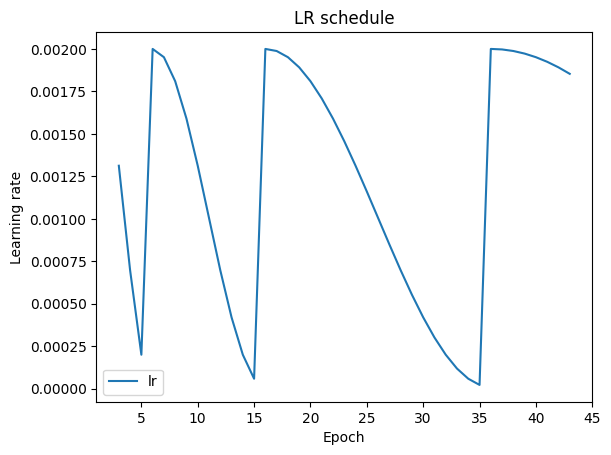


=== Learning curves for LOYO test_year=2024 ===


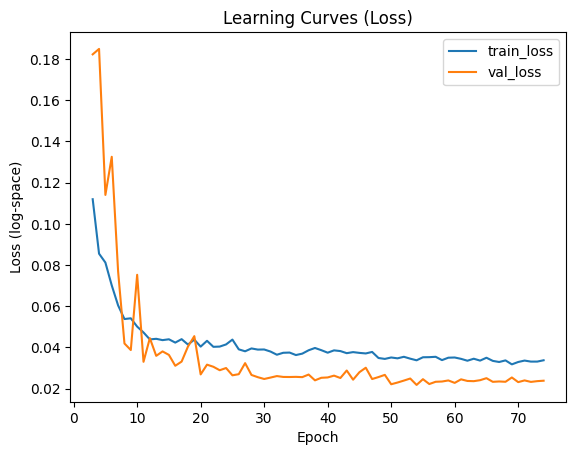

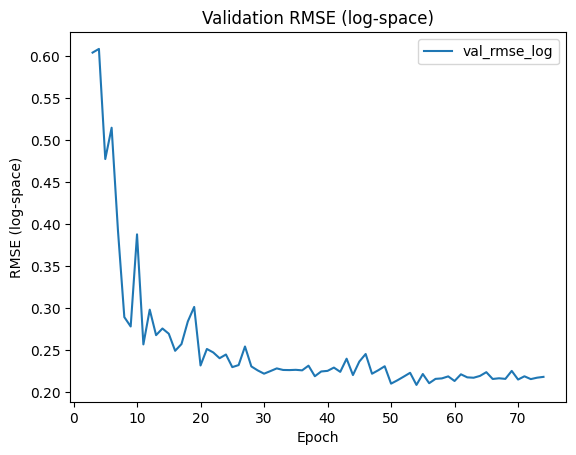

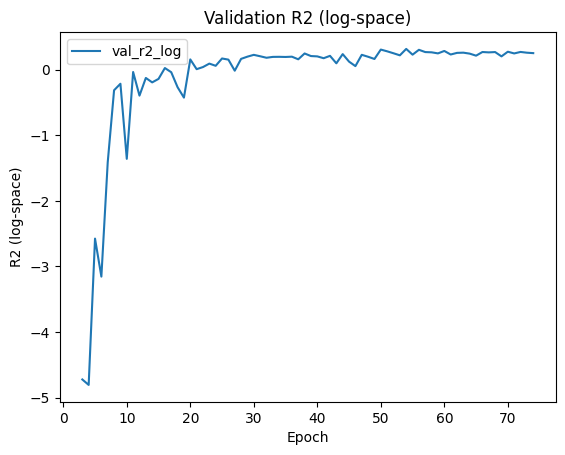

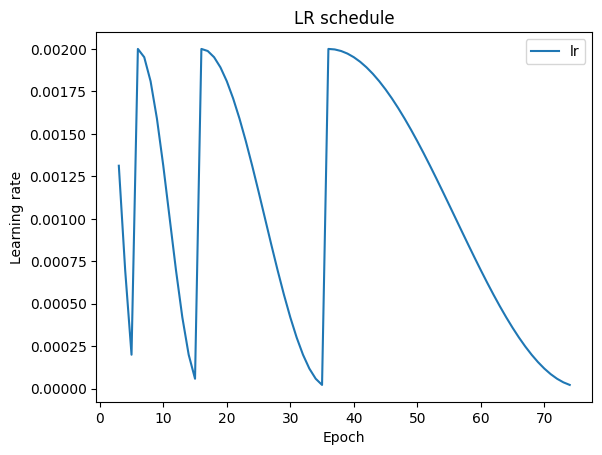

In [ ]:
luyo_df, histories = run_fixed_val_loyo(df, return_histories=True)

for yr in sorted(histories.keys()):
    print(f"\n=== Learning curves for LOYO test_year={yr} ===")
    plot_learning(histories[yr])   # your plotting function


In [ ]:
luyo_df

,test_year,val_years_used,n_train,n_val,n_test,best_val_loss_log,test_loss_log,rmse_log,mae_log,r2_log,rmse,mae,r2,corr_sq
0,2015,"[2016, 2022]",4259,1008,13,0.022160,0.024895,0.223137,0.178760,0.430173,8.696749,7.207784,0.515797,0.634657
1,2016,"[2015, 2022]",4259,571,450,0.023113,0.026435,0.229934,0.192834,-1.197679,13.000146,11.143500,-1.595862,0.198472
2,2017,"[2015, 2016, 2022]",3645,1021,614,0.020997,0.019469,0.197775,0.157496,-0.469865,10.269414,8.093876,-0.503413,0.042861
3,2018,"[2015, 2016, 2022]",3828,1021,431,0.023096,0.026451,0.230005,0.171739,-0.175916,10.395128,8.132148,-0.179915,0.269237
4,2019,"[2015, 2016, 2022]",3708,1021,551,0.023846,0.379539,0.853193,0.802291,-9.226464,27.481720,25.390326,-3.753976,0.313937
5,2020,"[2015, 2016, 2022]",3554,1021,705,0.025080,0.027662,0.243470,0.198507,-0.133273,12.557108,10.553607,-0.113158,0.089085
6,2021,"[2015, 2016, 2022]",3331,1021,928,0.027348,0.052942,0.329410,0.281034,-0.450046,19.602256,16.314104,-0.481235,0.177753
7,2022,"[2015, 2016]",4259,463,558,0.012930,0.034913,0.278555,0.232589,0.083153,17.089519,14.054952,-0.028013,0.331368
8,2023,"[2015, 2016, 2022]",3673,1021,586,0.026751,0.028773,0.263549,0.213521,-0.305499,16.115255,12.680556,-0.253157,0.203736
9,2024,"[2015, 2016, 2022]",3815,1021,444,0.021836,0.014009,0.167388,0.133268,0.020284,8.649880,7.040503,-0.112671,0.399513


##Uses Jumping LR when plateaus

### Soybeans


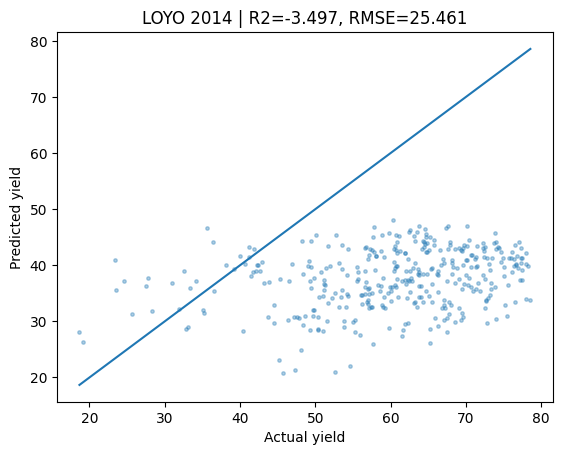

Done test_year=2014 | val_years=[2016, 2024] | RMSE=25.461 | R2=-3.497 | Corr_sq=0.072


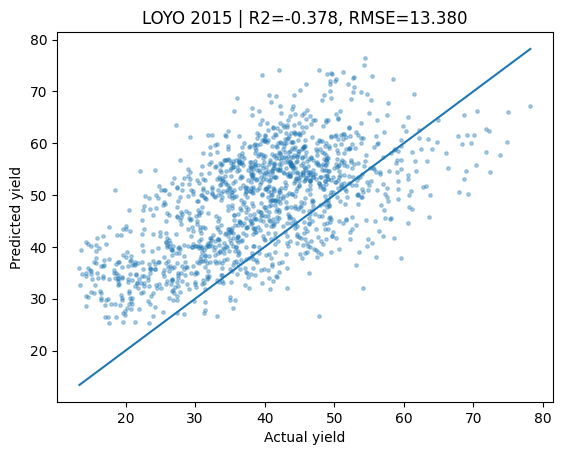

Done test_year=2015 | val_years=[2014, 2016, 2024] | RMSE=13.380 | R2=-0.378 | Corr_sq=0.376


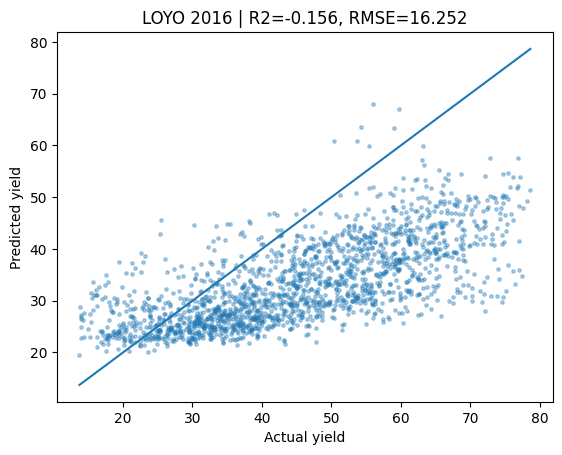

Done test_year=2016 | val_years=[2014, 2024] | RMSE=16.252 | R2=-0.156 | Corr_sq=0.487


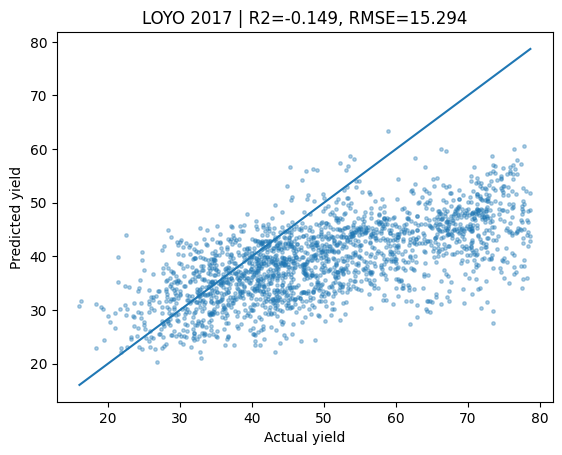

Done test_year=2017 | val_years=[2014, 2016, 2024] | RMSE=15.294 | R2=-0.149 | Corr_sq=0.414


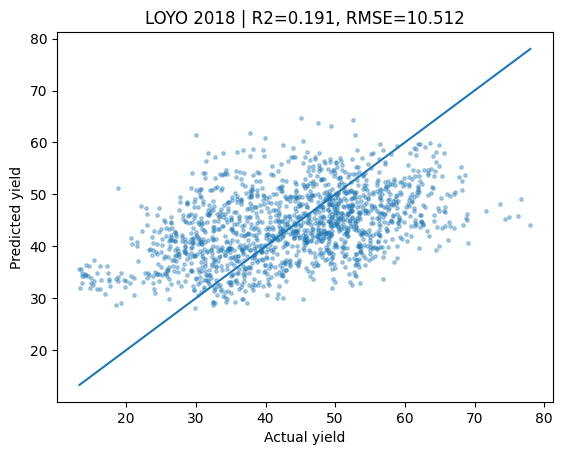

Done test_year=2018 | val_years=[2014, 2016, 2024] | RMSE=10.512 | R2=0.191 | Corr_sq=0.207


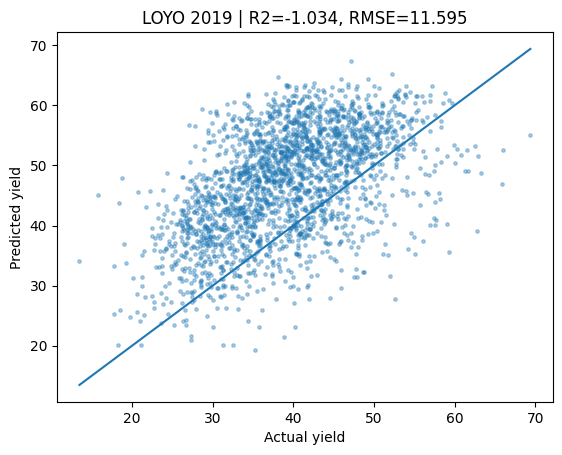

Done test_year=2019 | val_years=[2014, 2016, 2024] | RMSE=11.595 | R2=-1.034 | Corr_sq=0.263


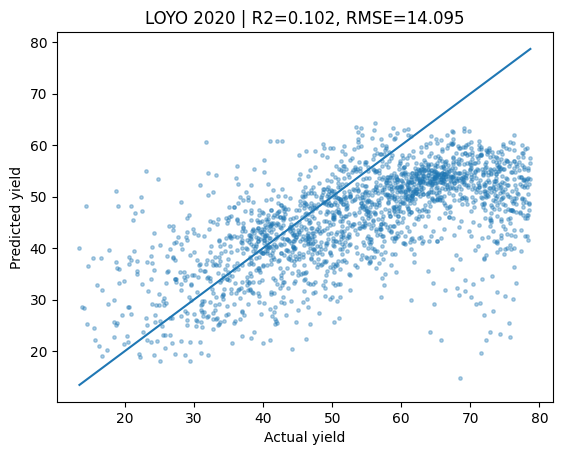

Done test_year=2020 | val_years=[2014, 2016, 2024] | RMSE=14.095 | R2=0.102 | Corr_sq=0.388


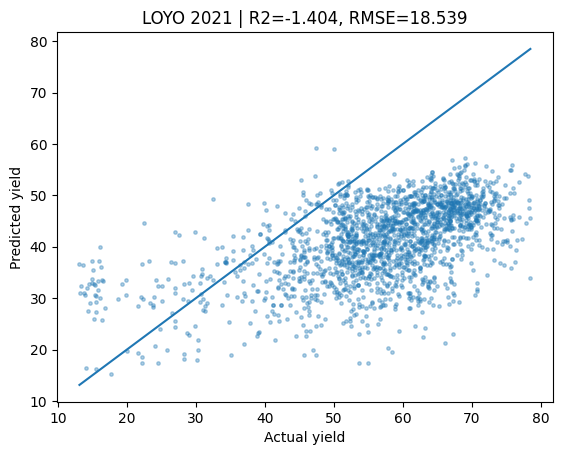

Done test_year=2021 | val_years=[2014, 2016, 2024] | RMSE=18.539 | R2=-1.404 | Corr_sq=0.293


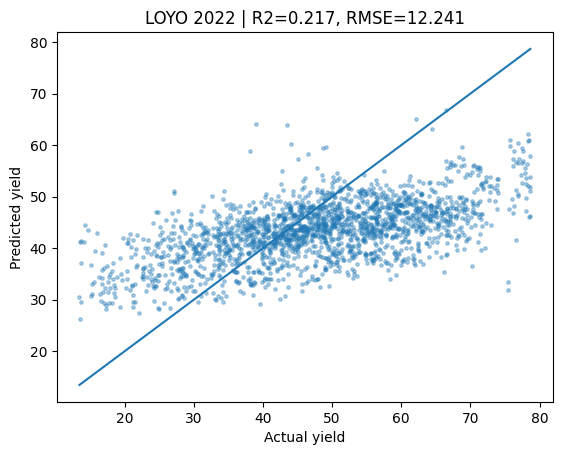

Done test_year=2022 | val_years=[2014, 2016, 2024] | RMSE=12.241 | R2=0.217 | Corr_sq=0.347


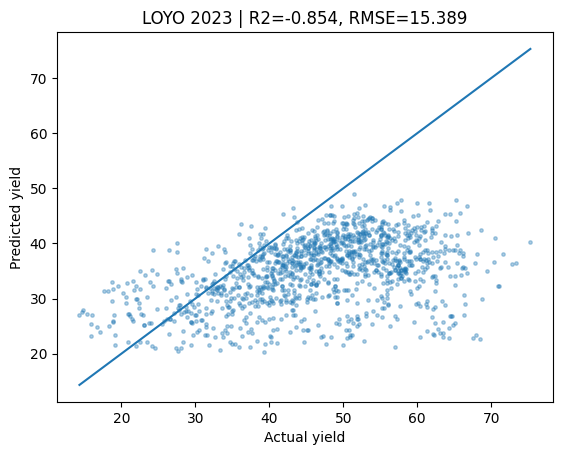

Done test_year=2023 | val_years=[2014, 2016, 2024] | RMSE=15.389 | R2=-0.854 | Corr_sq=0.176


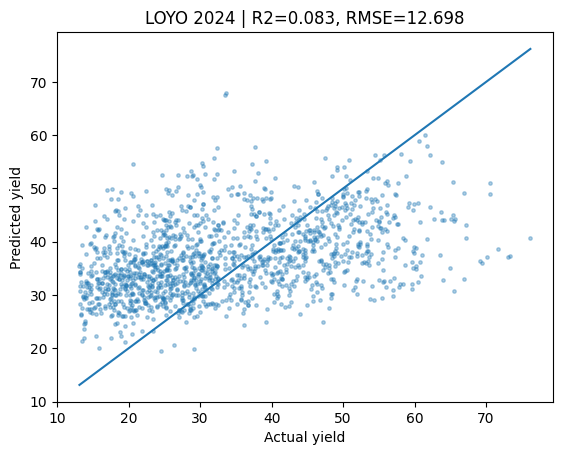

Done test_year=2024 | val_years=[2014, 2016] | RMSE=12.698 | R2=0.083 | Corr_sq=0.168

=== Learning curves for LOYO test_year=2014 ===


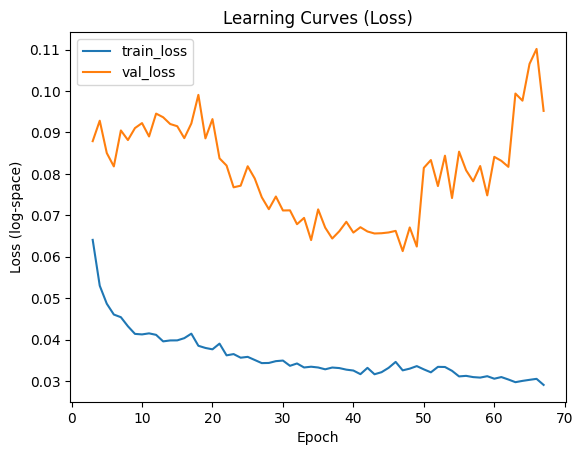

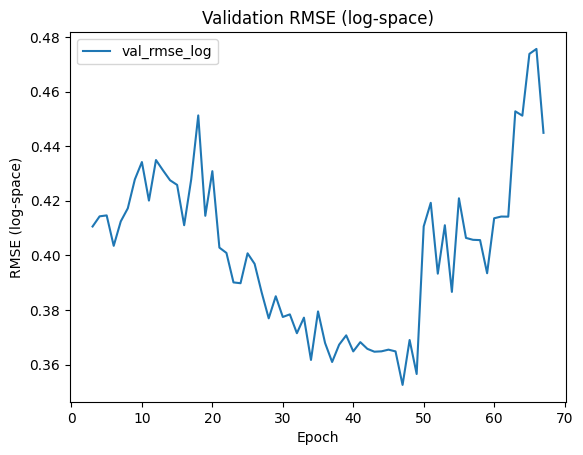

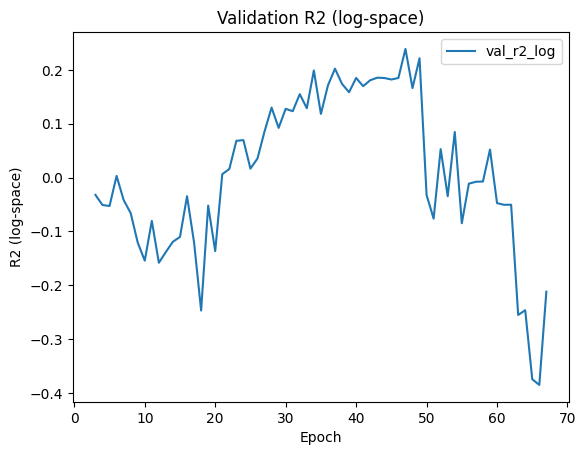

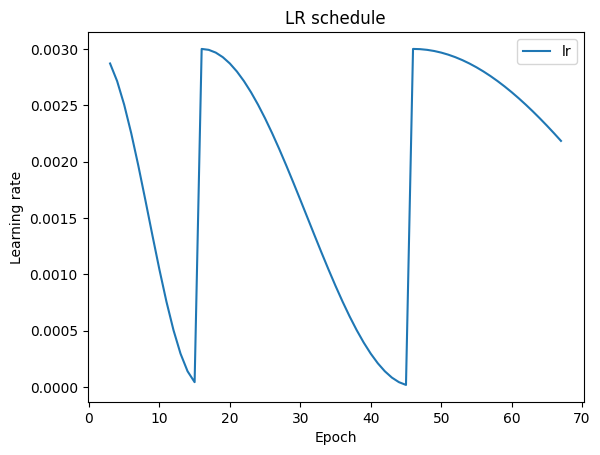


=== Learning curves for LOYO test_year=2015 ===


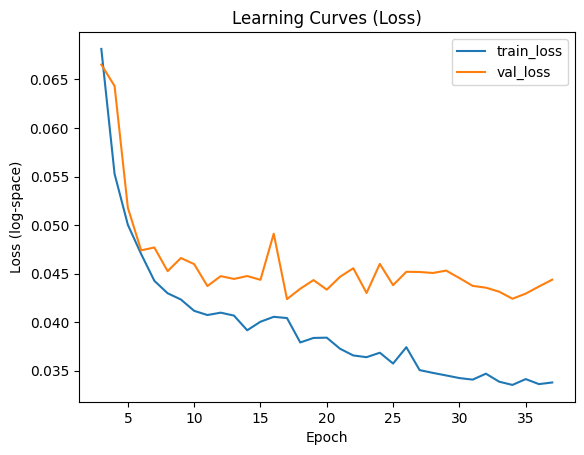

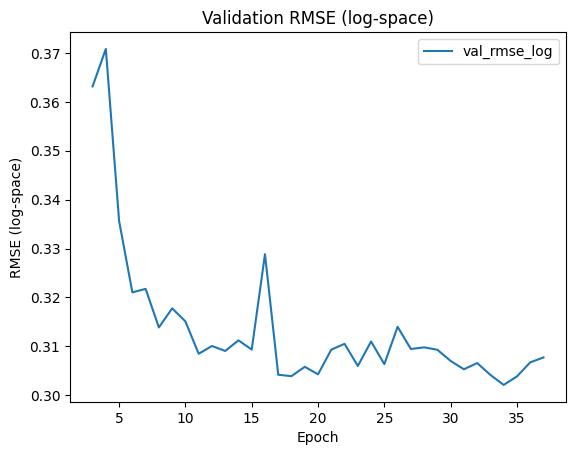

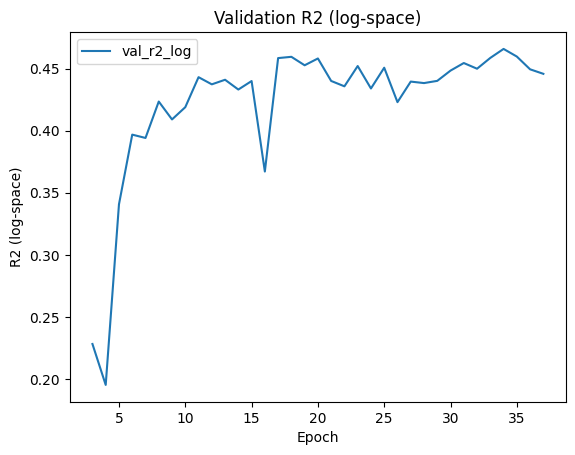

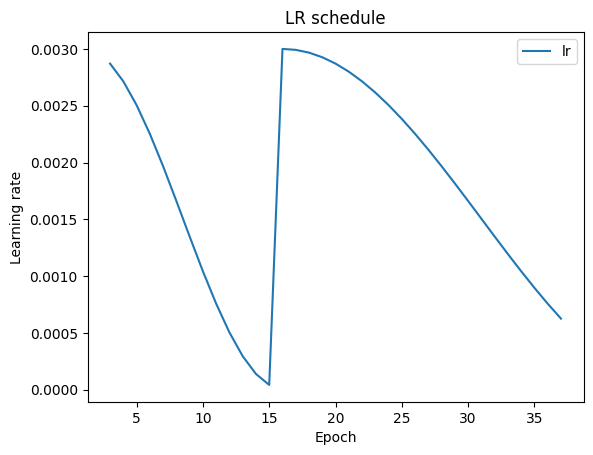


=== Learning curves for LOYO test_year=2016 ===


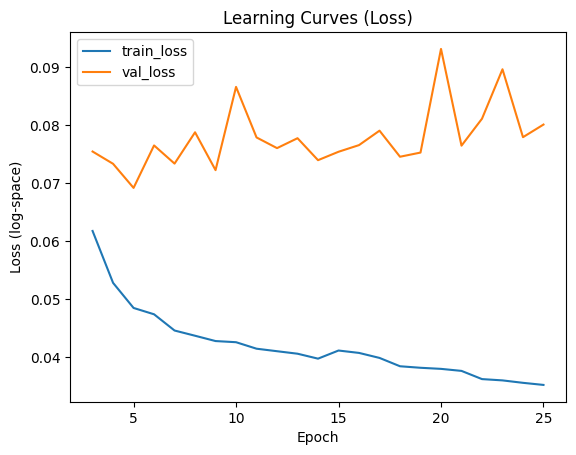

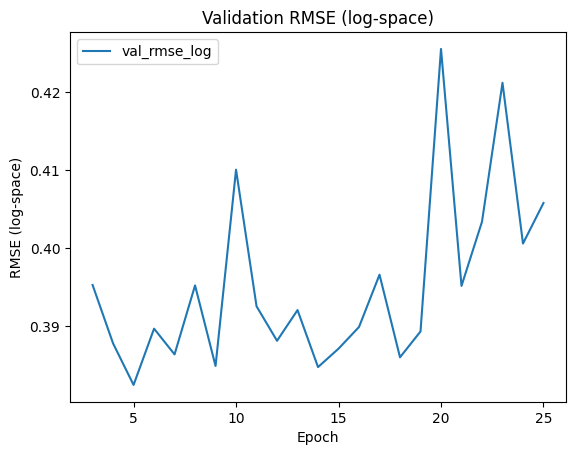

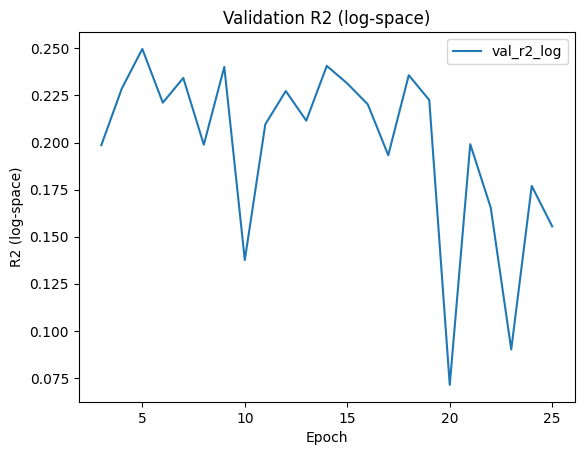

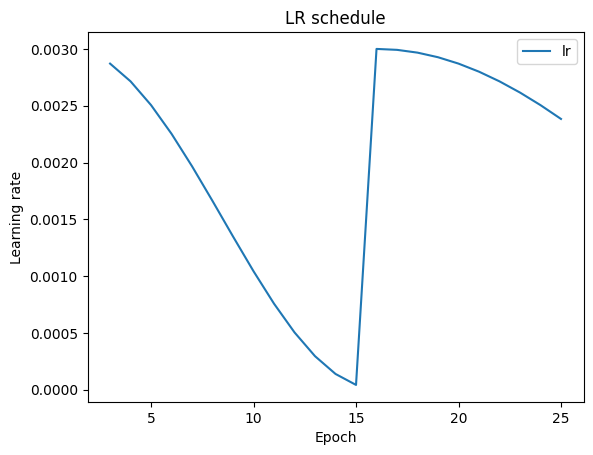


=== Learning curves for LOYO test_year=2017 ===


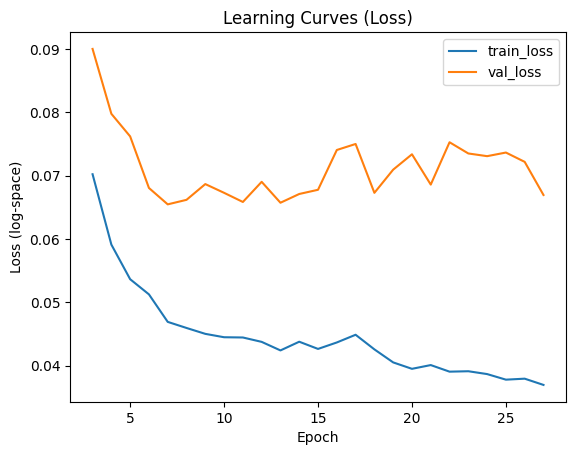

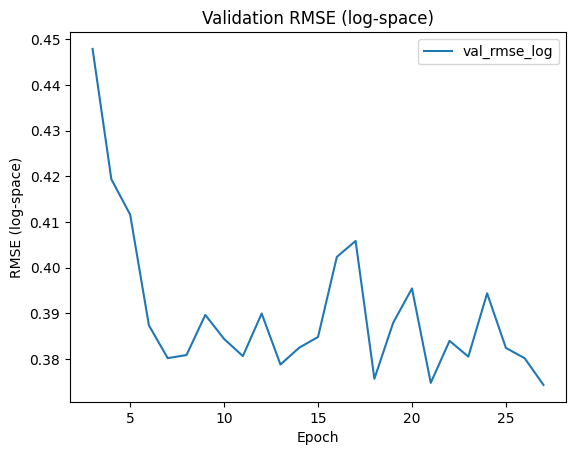

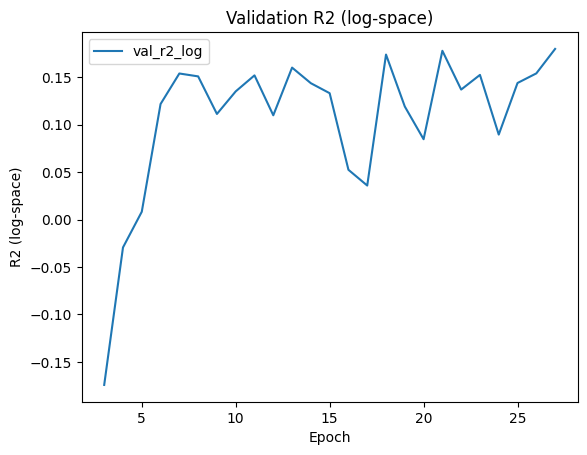

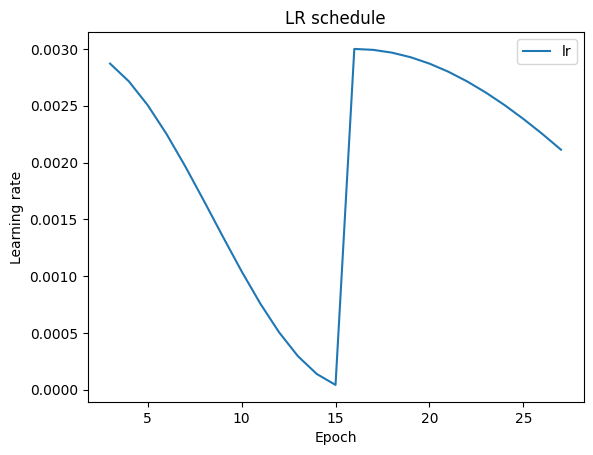


=== Learning curves for LOYO test_year=2018 ===


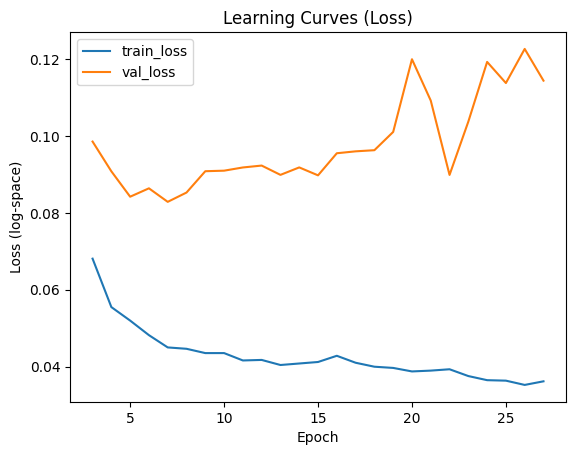

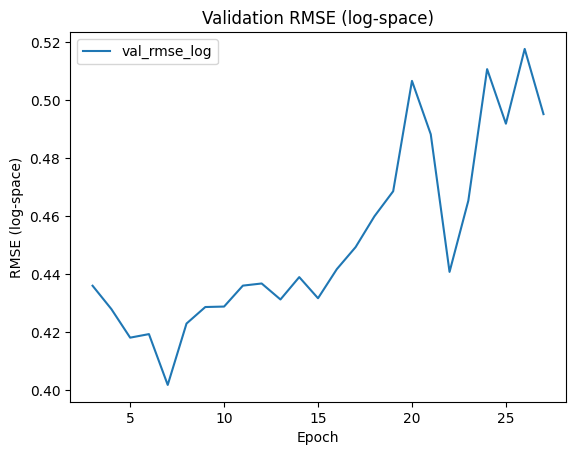

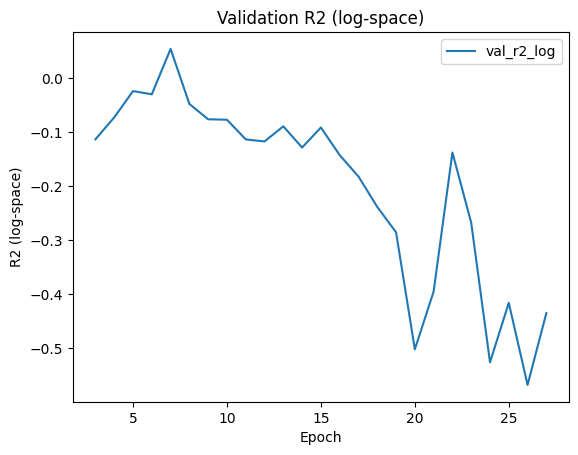

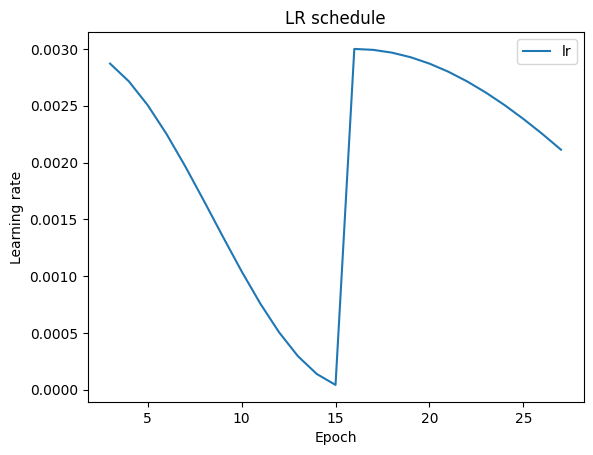


=== Learning curves for LOYO test_year=2019 ===


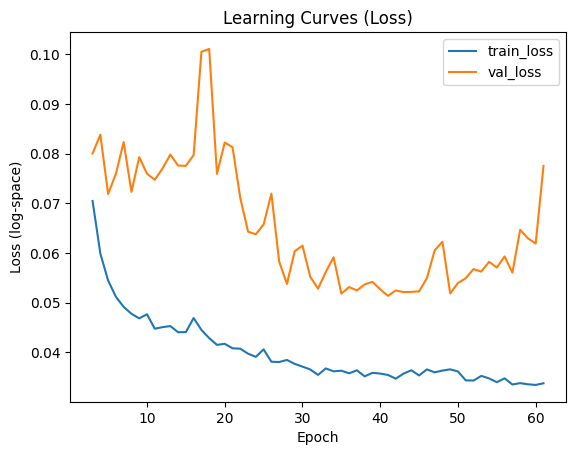

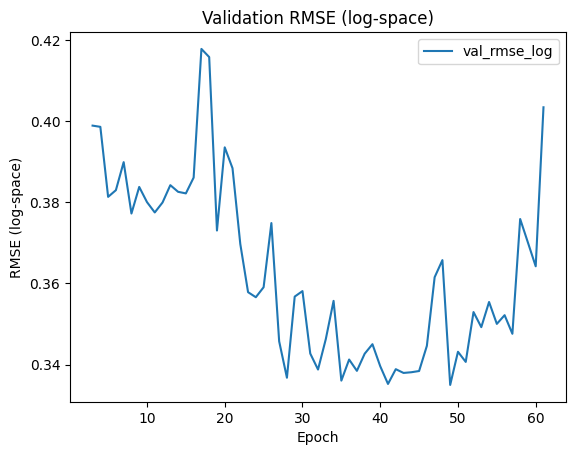

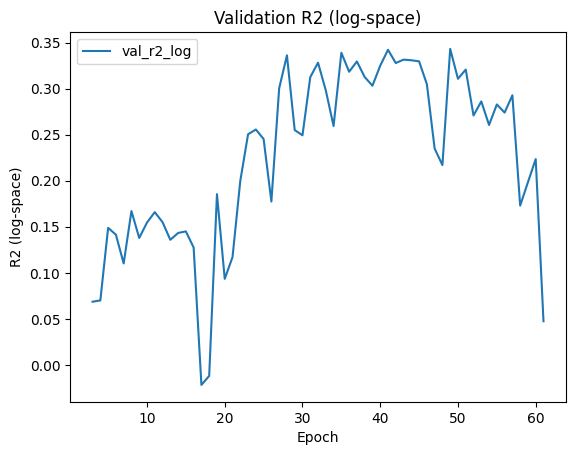

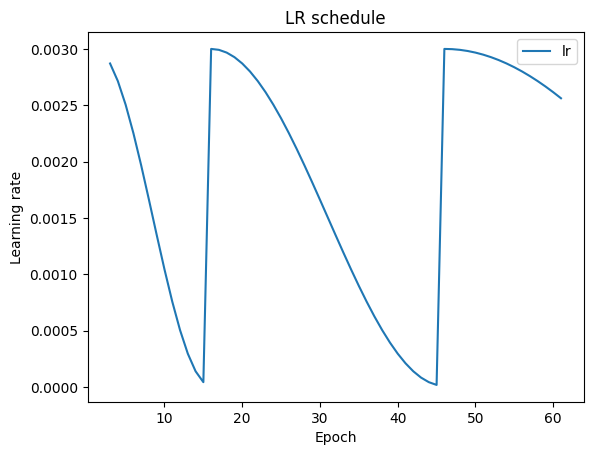


=== Learning curves for LOYO test_year=2020 ===


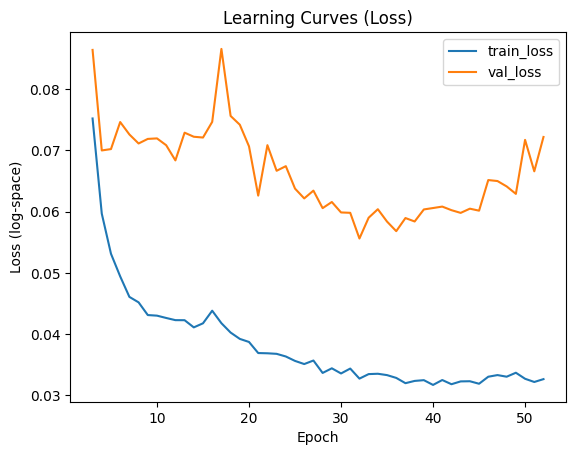

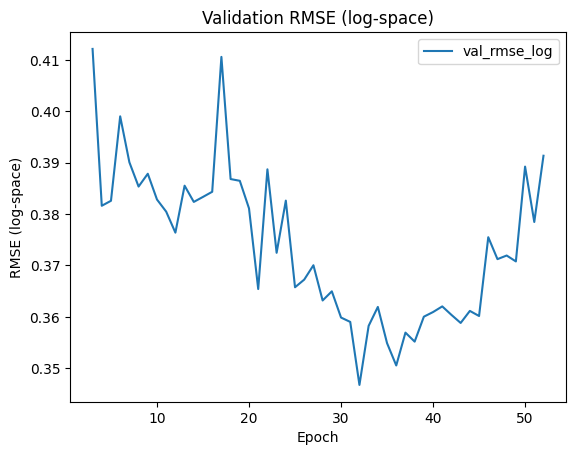

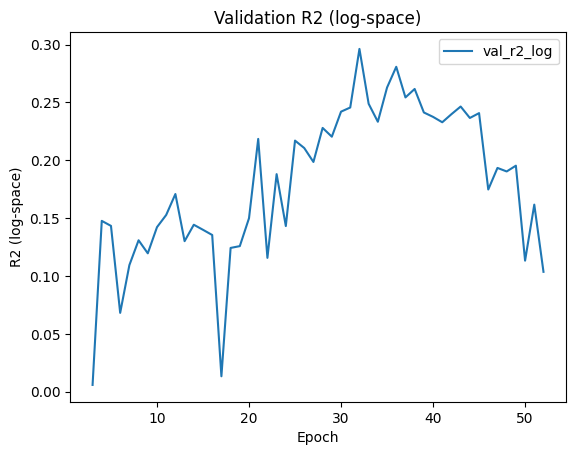

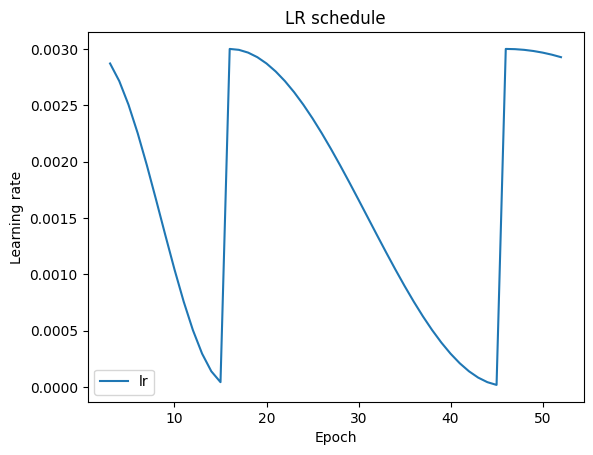


=== Learning curves for LOYO test_year=2021 ===


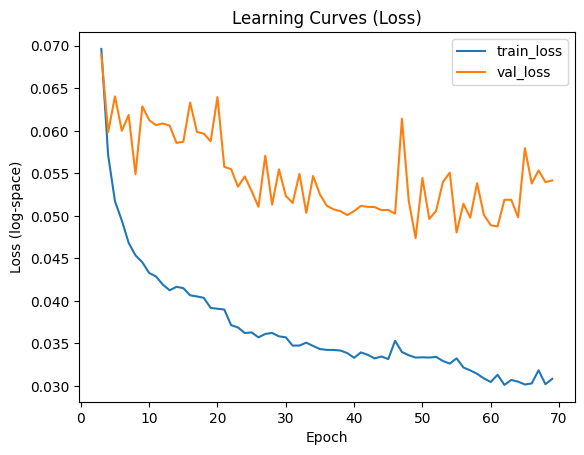

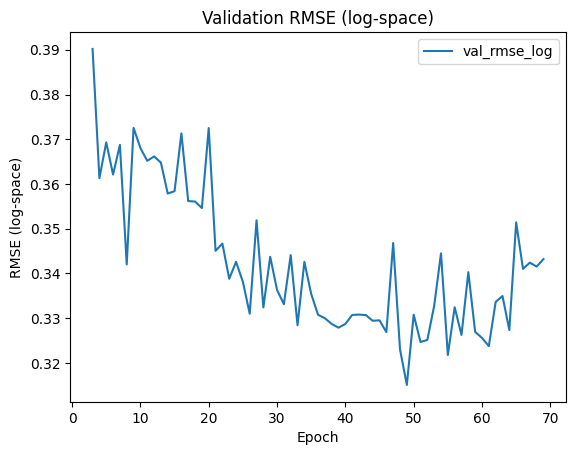

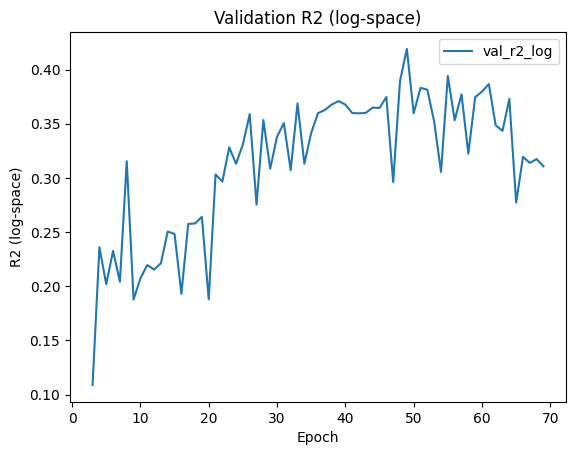

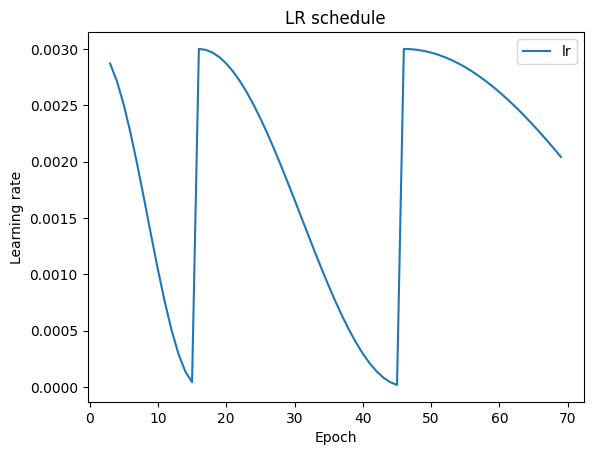


=== Learning curves for LOYO test_year=2022 ===


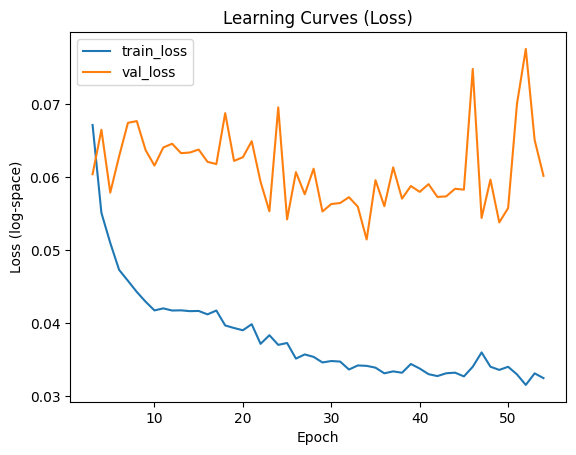

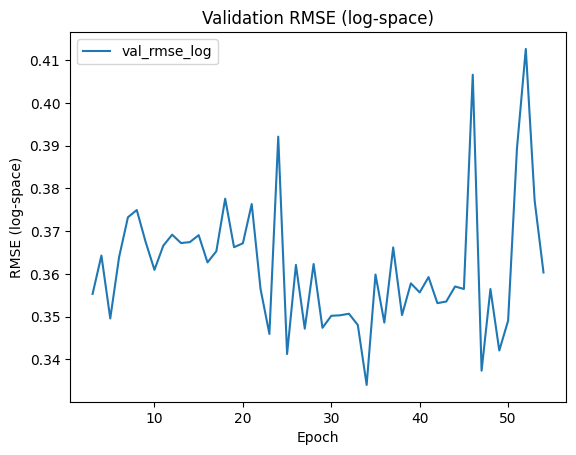

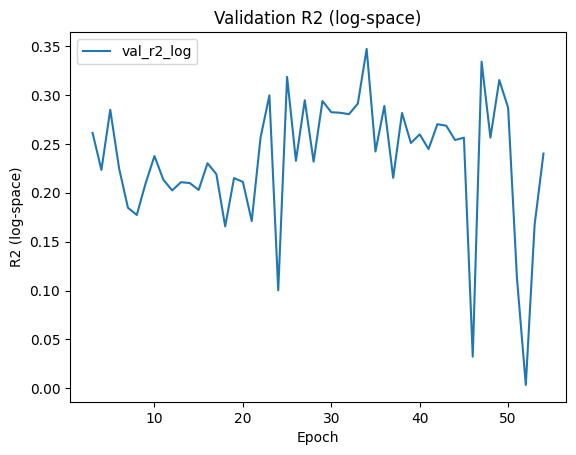

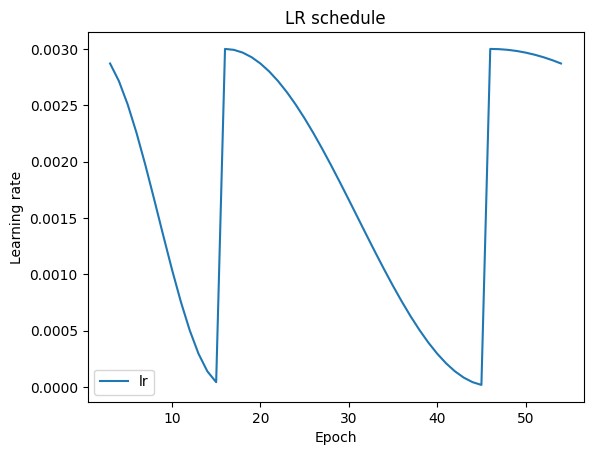


=== Learning curves for LOYO test_year=2023 ===


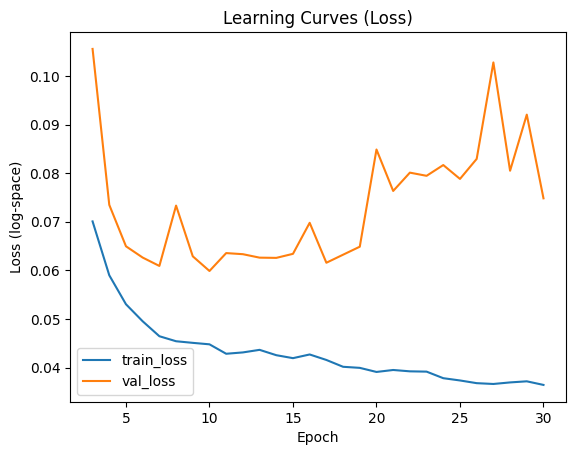

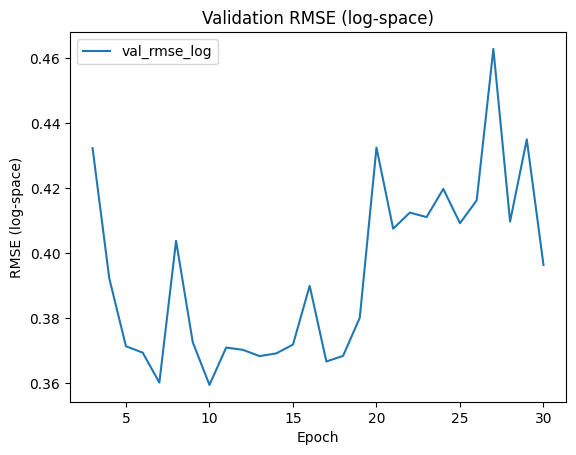

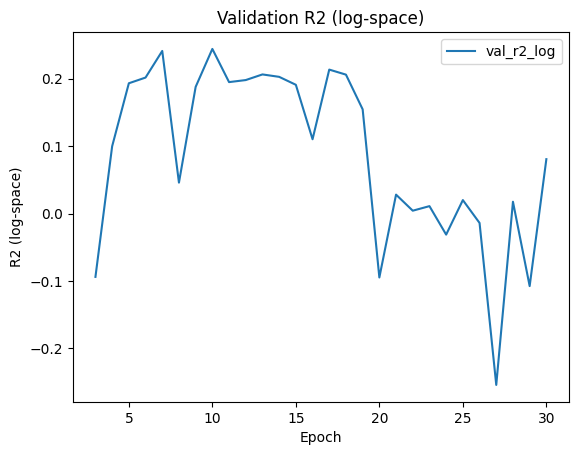

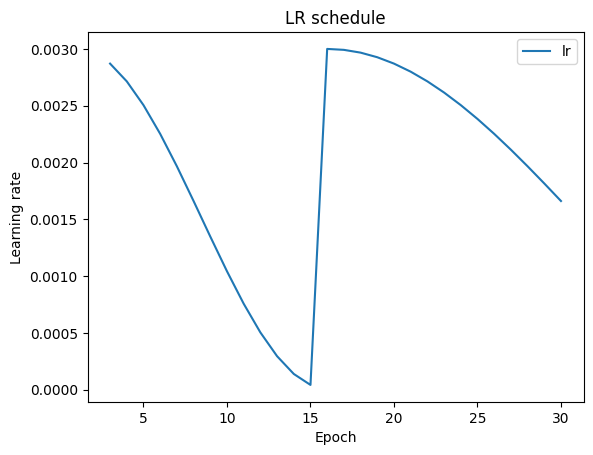


=== Learning curves for LOYO test_year=2024 ===


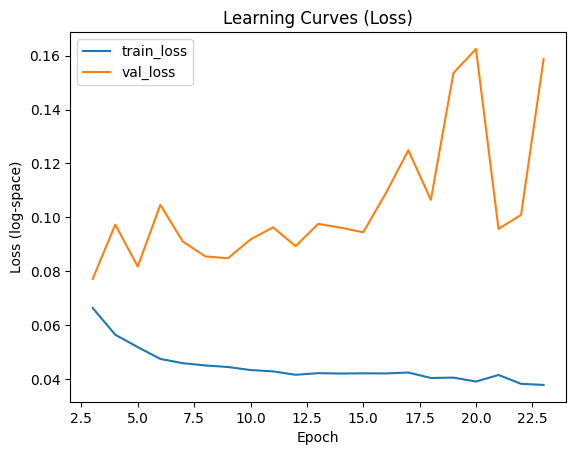

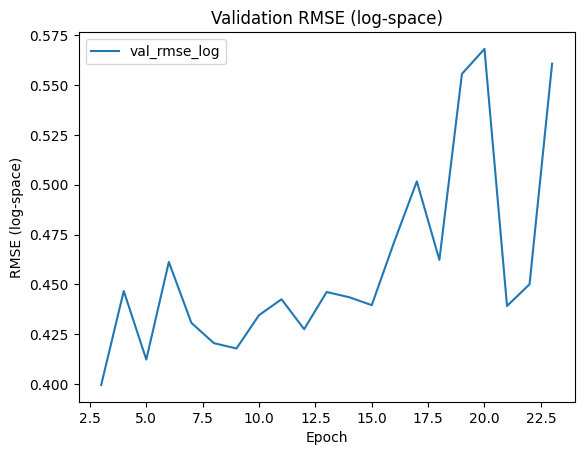

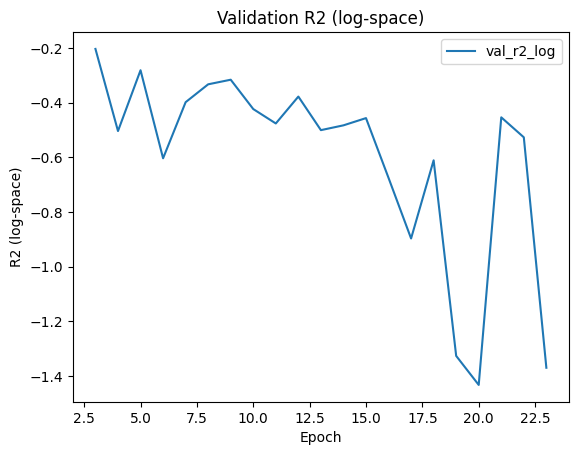

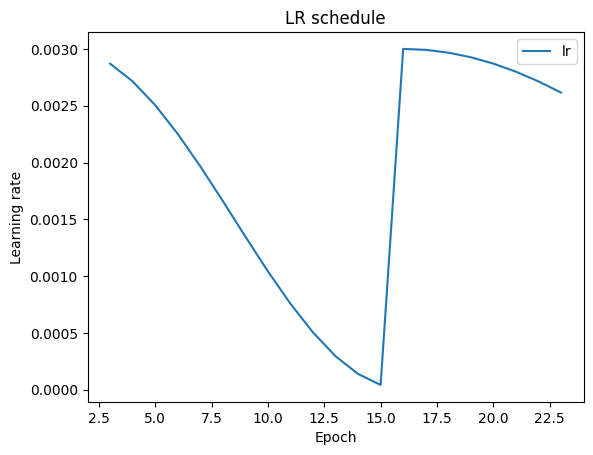

In [ ]:
luyo_df, histories = run_fixed_val_loyo(df, return_histories=True)

for yr in sorted(histories.keys()):
    print(f"\n=== Learning curves for LOYO test_year={yr} ===")
    plot_learning(histories[yr])   # your plotting function


In [ ]:
luyo_df

,test_year,val_years_used,n_train,n_val,n_test,best_val_loss_log,test_loss_log,rmse_log,mae_log,r2_log,rmse,mae,r2,corr_sq
0,2014,"[2016, 2024]",14415,3258,367,0.061351,0.128963,0.507865,0.469616,-3.756938,25.460872,23.302336,-3.496764,0.072199
1,2015,"[2014, 2016, 2024]",12994,3625,1421,0.042373,0.058180,0.333616,0.272313,-0.136256,13.380099,11.329002,-0.378136,0.375769
2,2016,"[2014, 2024]",14415,1810,1815,0.069184,0.068580,0.373152,0.325326,-0.059086,16.252499,13.532159,-0.156404,0.486598
3,2017,"[2014, 2016, 2024]",12358,3625,2057,0.065482,0.041315,0.305614,0.253528,-0.084496,15.294457,12.142020,-0.148934,0.414361
4,2018,"[2014, 2016, 2024]",12875,3625,1540,0.082909,0.028472,0.260740,0.202930,0.205730,10.511597,8.531927,0.191095,0.207018
5,2019,"[2014, 2016, 2024]",12168,3625,2247,0.051350,0.036875,0.271016,0.226975,-0.667756,11.594569,9.768798,-1.033999,0.263356
6,2020,"[2014, 2016, 2024]",12405,3625,2010,0.055600,0.039386,0.282211,0.221643,0.196736,14.095090,11.142662,0.101723,0.388004
7,2021,"[2014, 2016, 2024]",12505,3625,1910,0.047385,0.073184,0.384280,0.341368,-1.033600,18.538596,16.647053,-1.404191,0.293023
8,2022,"[2014, 2016, 2024]",12430,3625,1985,0.051447,0.036557,0.270155,0.216618,0.290776,12.241299,9.905165,0.216624,0.347127
9,2023,"[2014, 2016, 2024]",13170,3625,1245,0.059866,0.062931,0.358542,0.296867,-0.748902,15.389438,12.521205,-0.853932,0.175673


### Corn


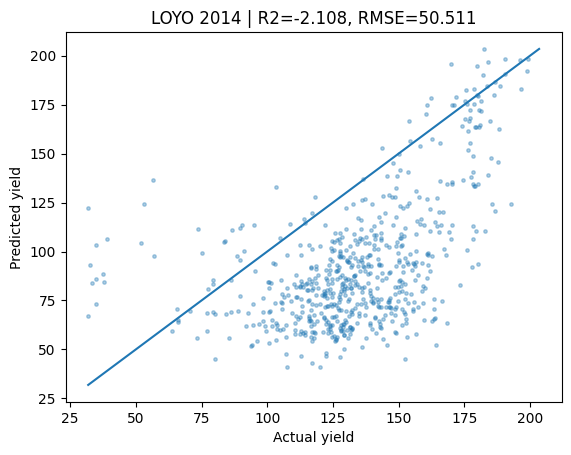

Done test_year=2014 | val_years=[2016, 2024] | RMSE=50.511 | R2=-2.108 | Corr_sq=0.278


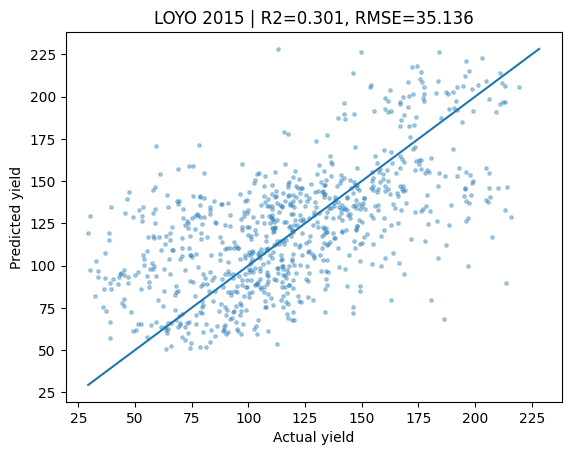

Done test_year=2015 | val_years=[2014, 2016, 2024] | RMSE=35.136 | R2=0.301 | Corr_sq=0.376


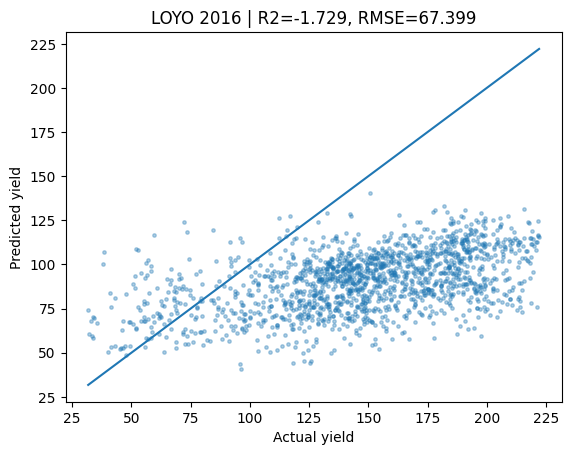

Done test_year=2016 | val_years=[2014, 2024] | RMSE=67.399 | R2=-1.729 | Corr_sq=0.226


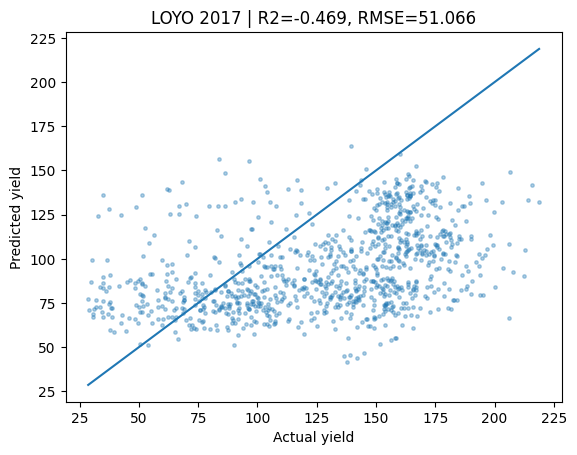

Done test_year=2017 | val_years=[2014, 2016, 2024] | RMSE=51.066 | R2=-0.469 | Corr_sq=0.161


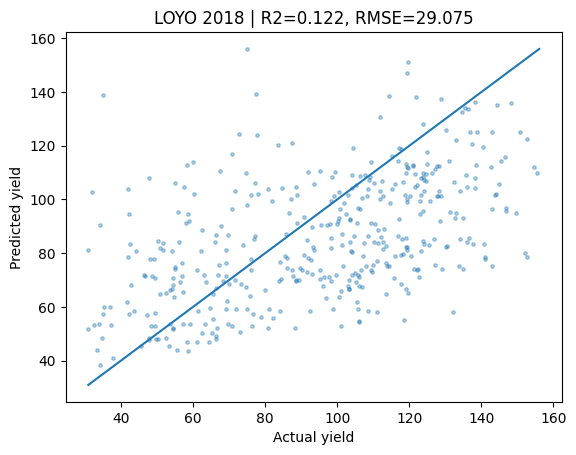

Done test_year=2018 | val_years=[2014, 2016, 2024] | RMSE=29.075 | R2=0.122 | Corr_sq=0.263


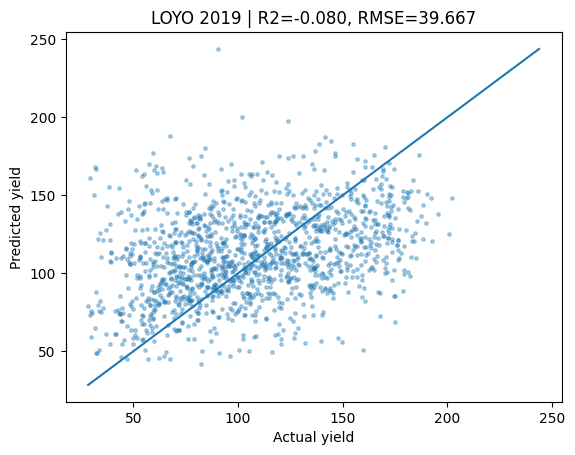

Done test_year=2019 | val_years=[2014, 2016, 2024] | RMSE=39.667 | R2=-0.080 | Corr_sq=0.107


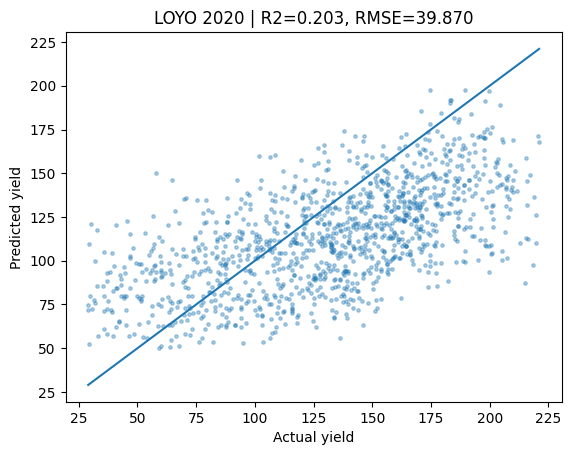

Done test_year=2020 | val_years=[2014, 2016, 2024] | RMSE=39.870 | R2=0.203 | Corr_sq=0.369


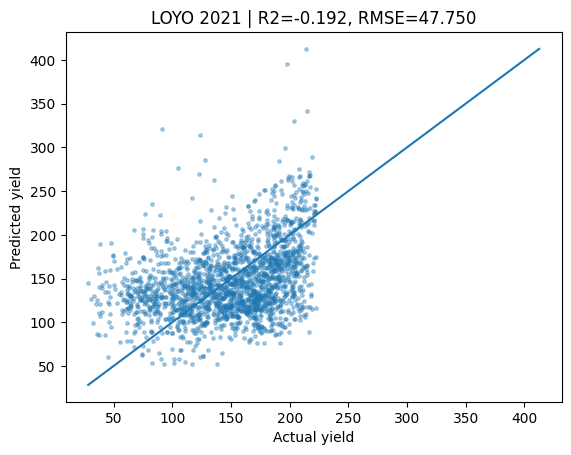

Done test_year=2021 | val_years=[2014, 2016, 2024] | RMSE=47.750 | R2=-0.192 | Corr_sq=0.131


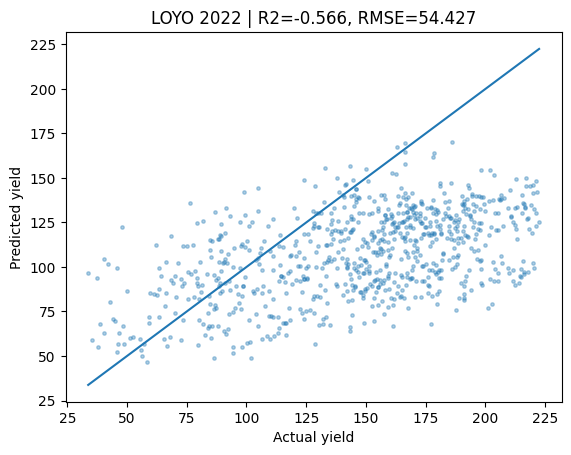

Done test_year=2022 | val_years=[2014, 2016, 2024] | RMSE=54.427 | R2=-0.566 | Corr_sq=0.256


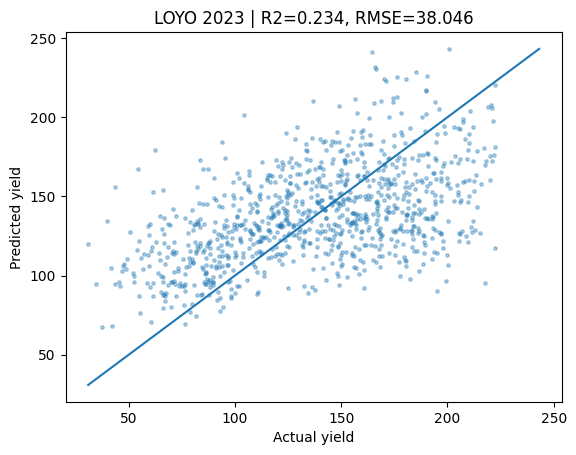

Done test_year=2023 | val_years=[2014, 2016, 2024] | RMSE=38.046 | R2=0.234 | Corr_sq=0.265


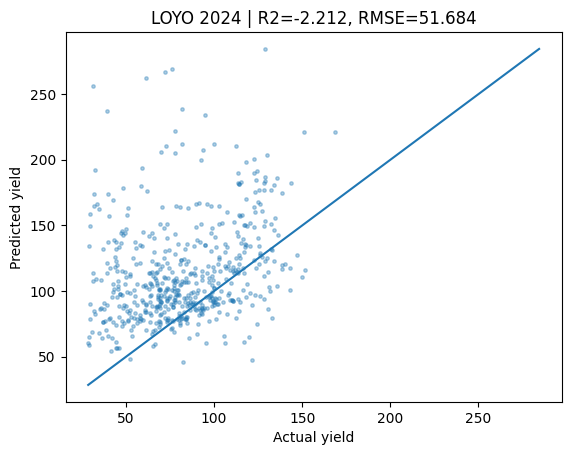

Done test_year=2024 | val_years=[2014, 2016] | RMSE=51.684 | R2=-2.212 | Corr_sq=0.072

=== Learning curves for LOYO test_year=2014 ===


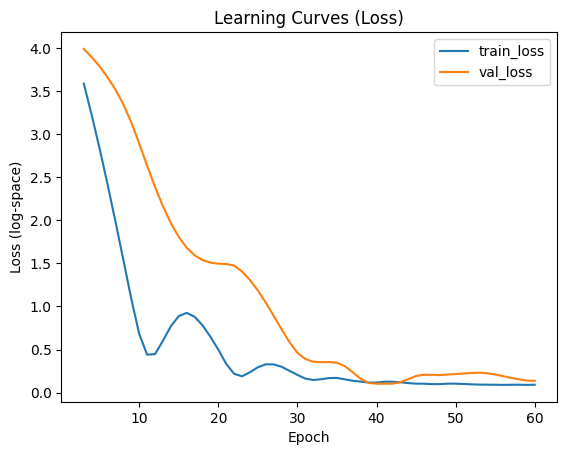

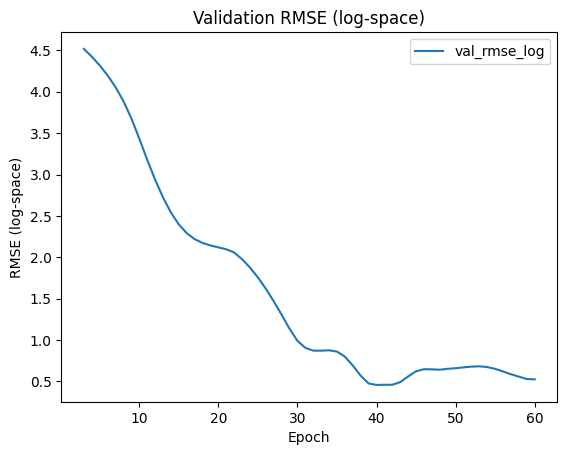

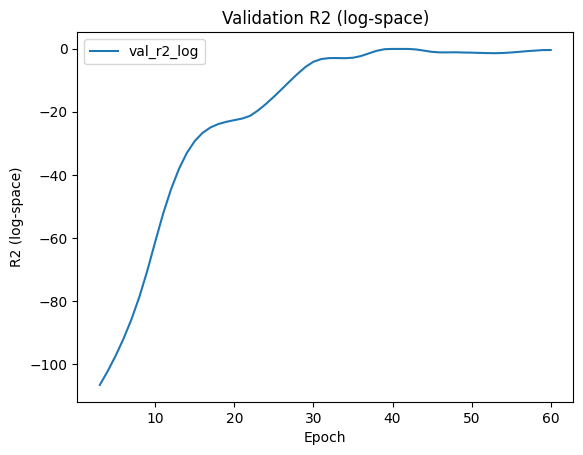

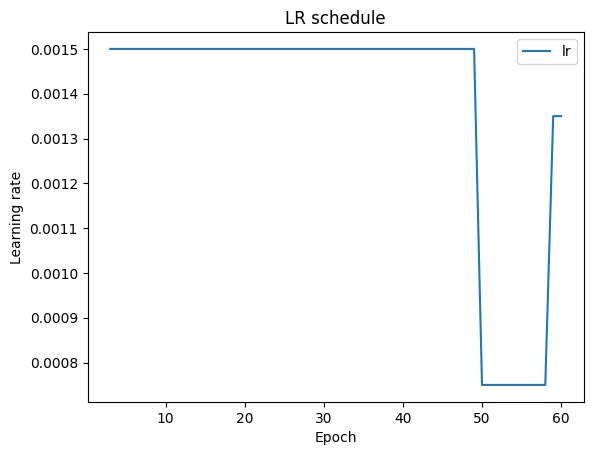


=== Learning curves for LOYO test_year=2015 ===


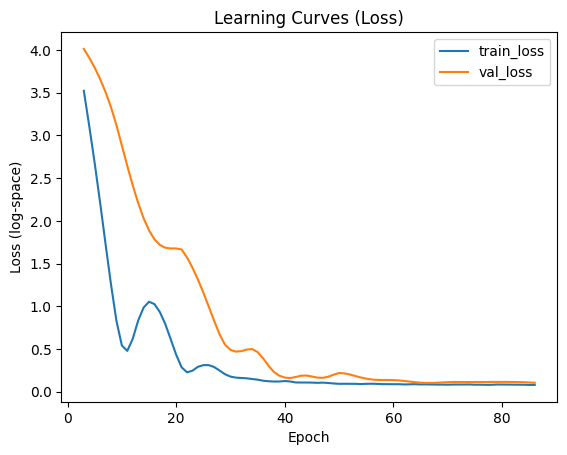

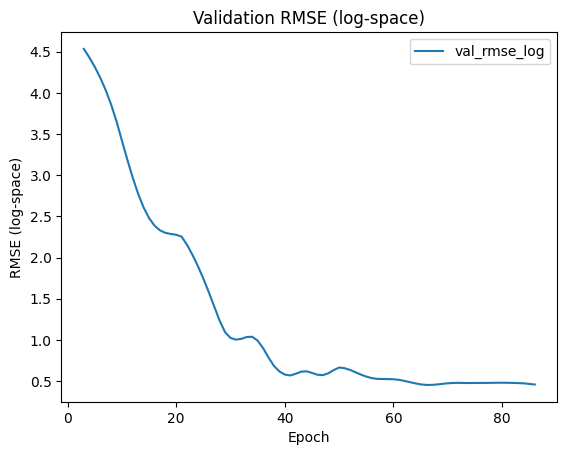

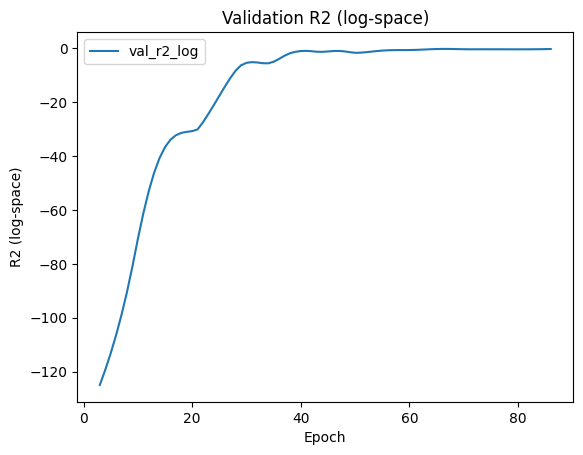

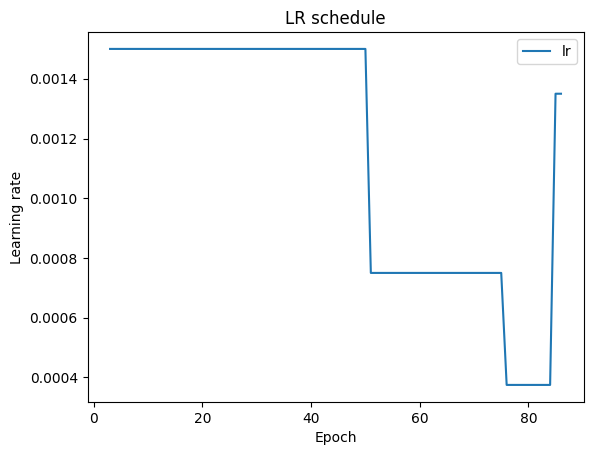


=== Learning curves for LOYO test_year=2016 ===


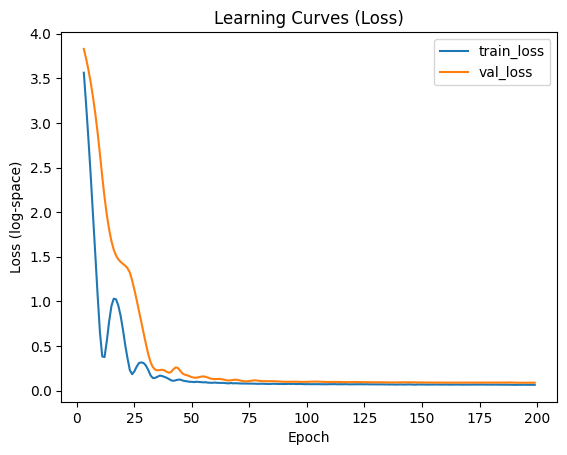

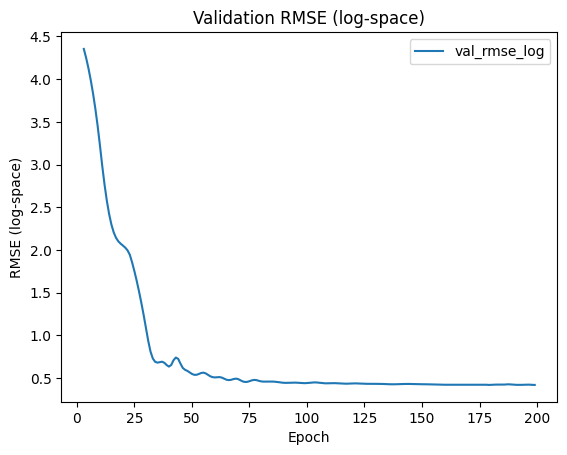

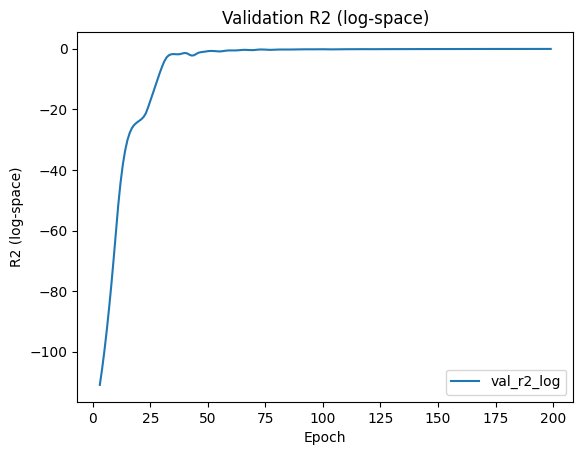

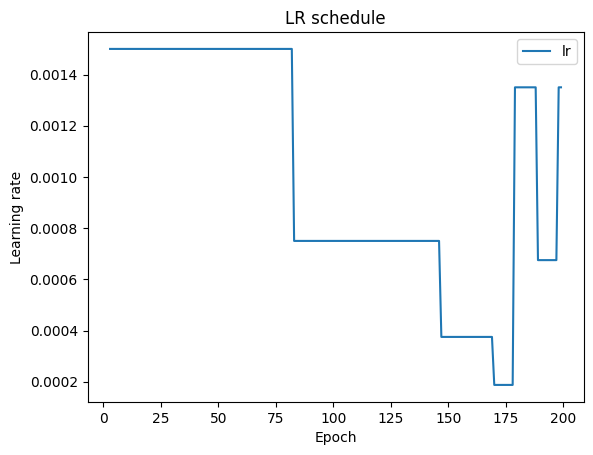


=== Learning curves for LOYO test_year=2017 ===


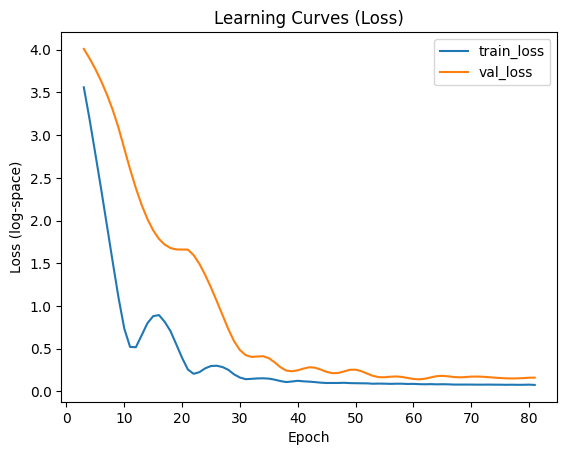

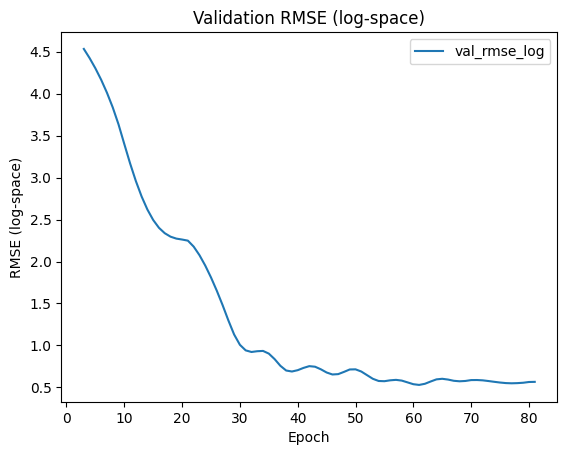

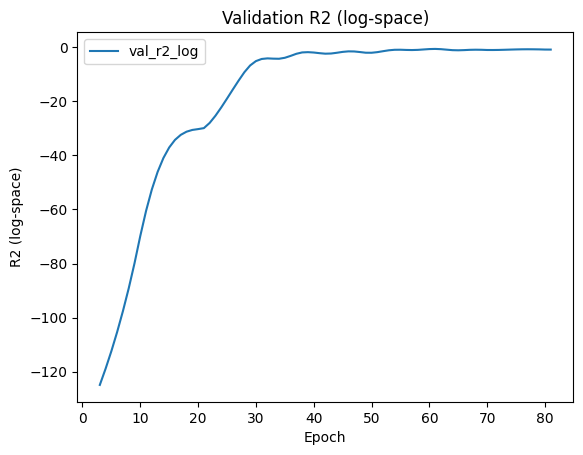

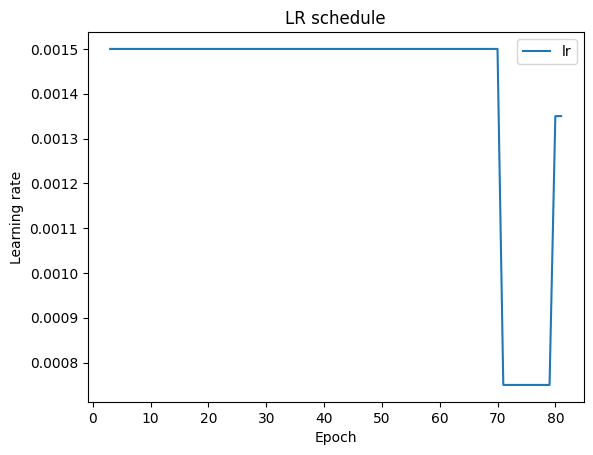


=== Learning curves for LOYO test_year=2018 ===


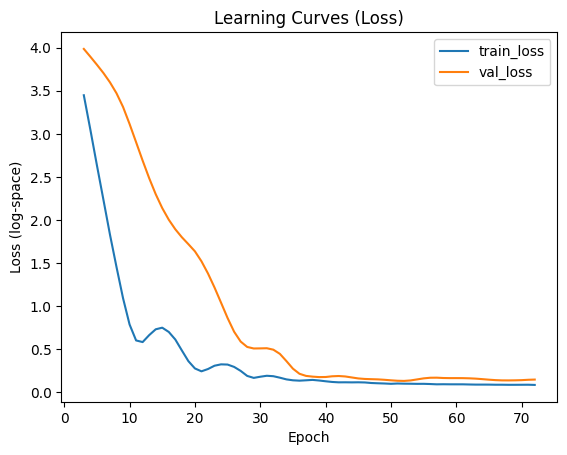

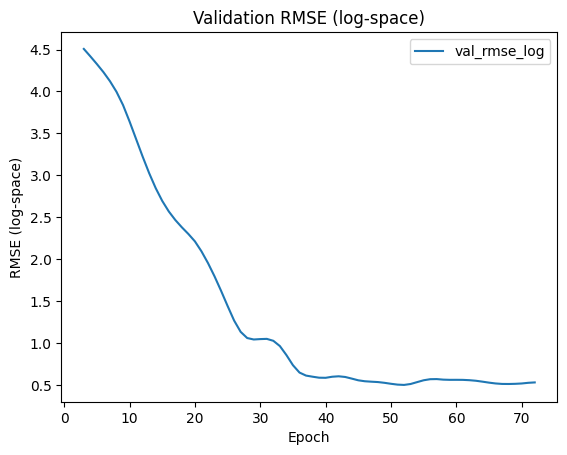

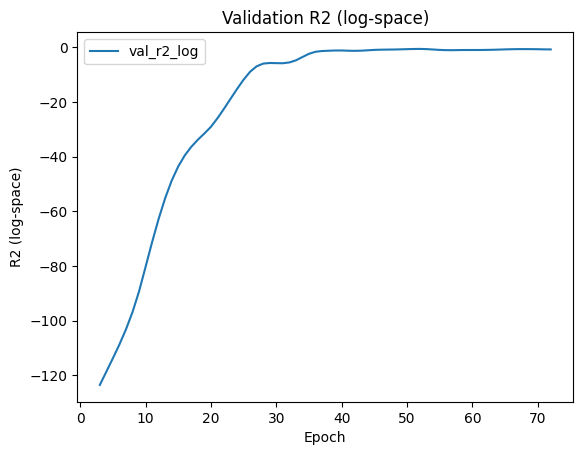

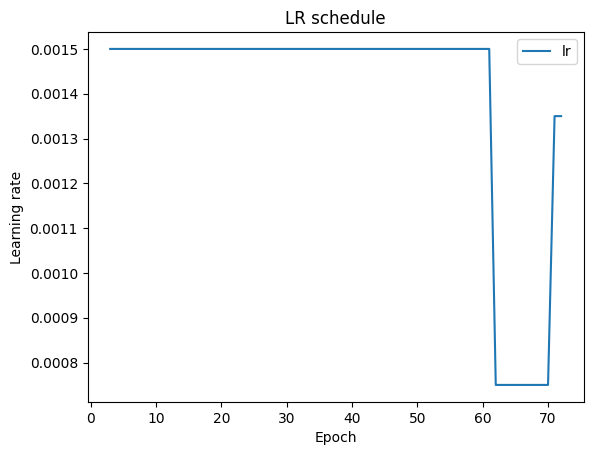


=== Learning curves for LOYO test_year=2019 ===


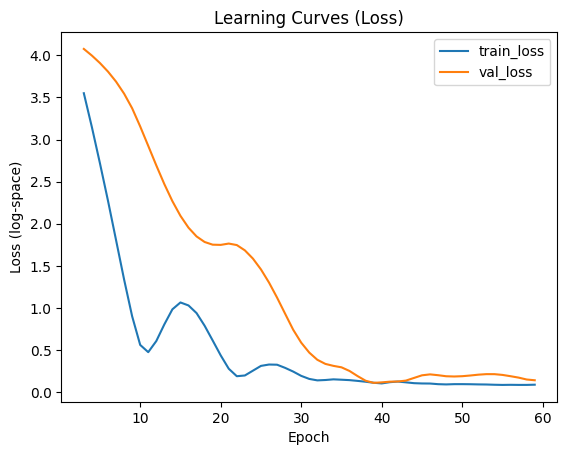

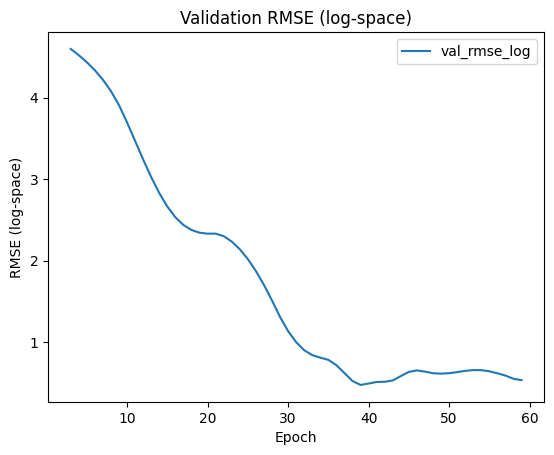

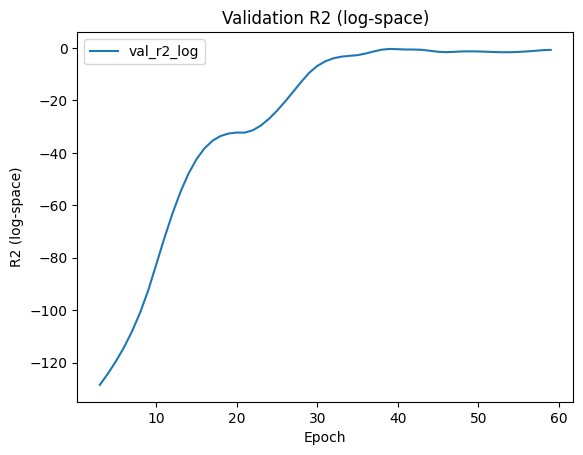

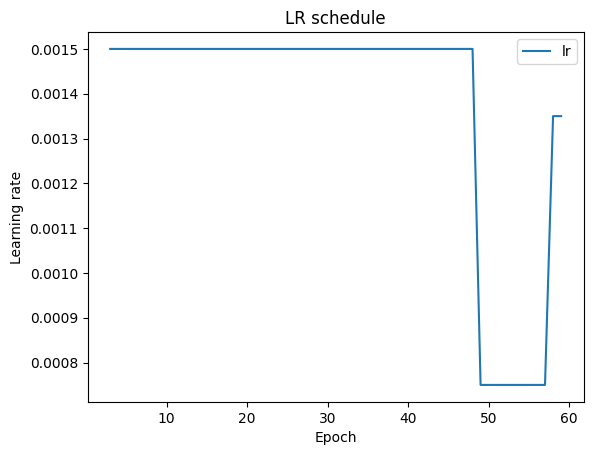


=== Learning curves for LOYO test_year=2020 ===


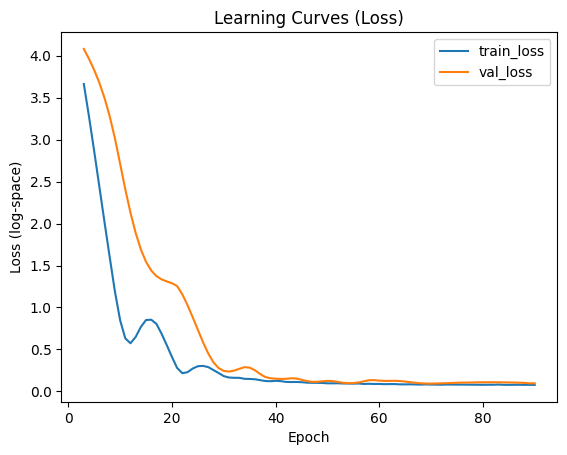

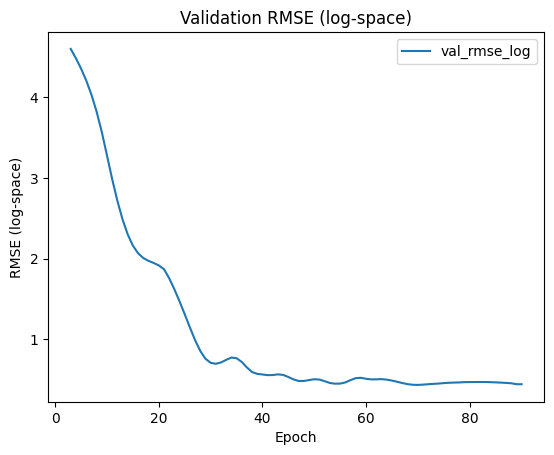

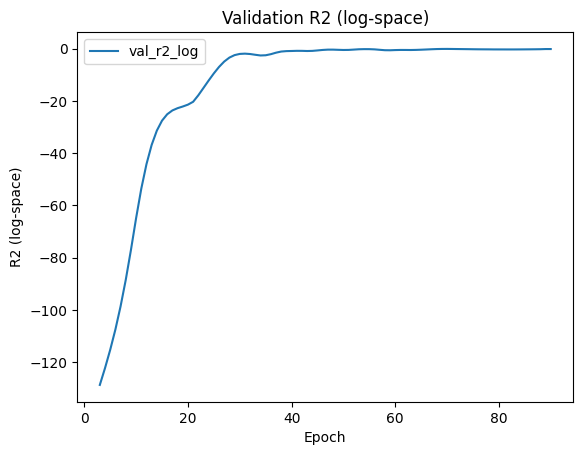

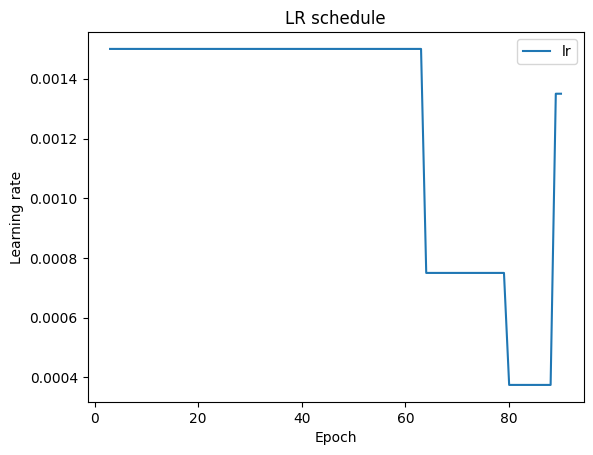


=== Learning curves for LOYO test_year=2021 ===


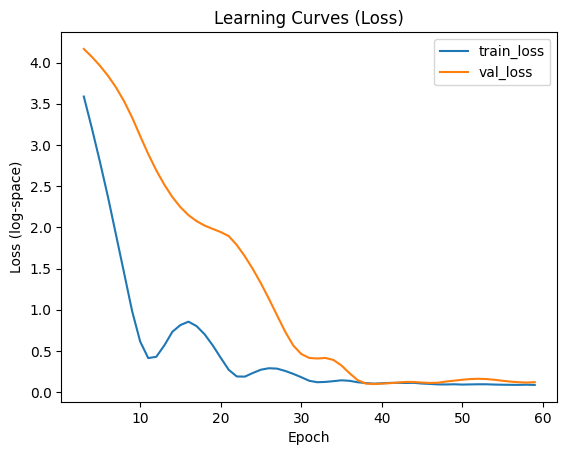

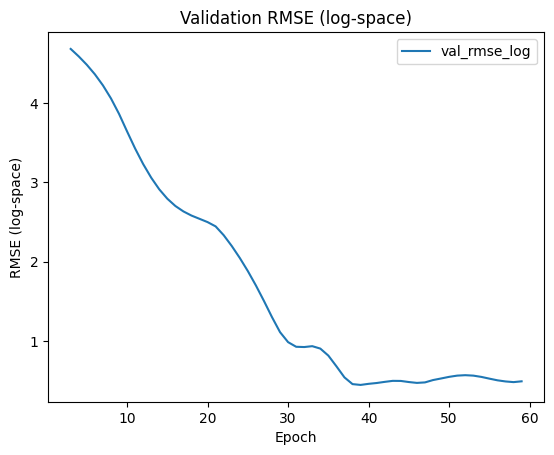

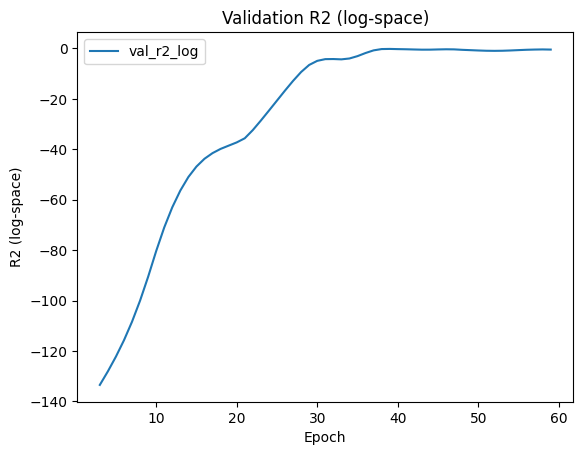

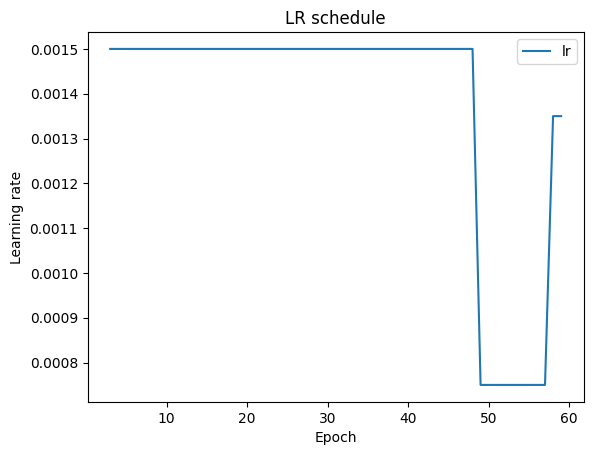


=== Learning curves for LOYO test_year=2022 ===


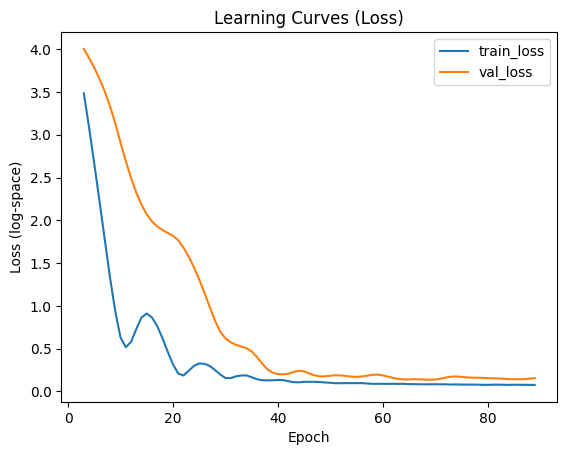

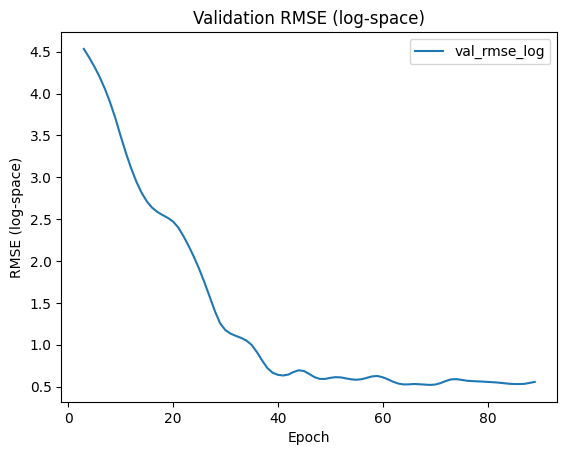

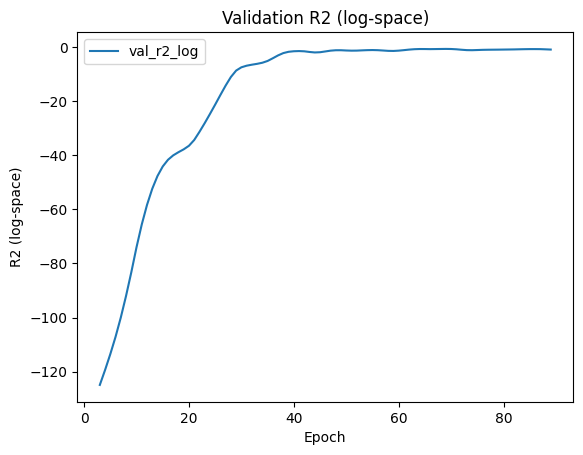

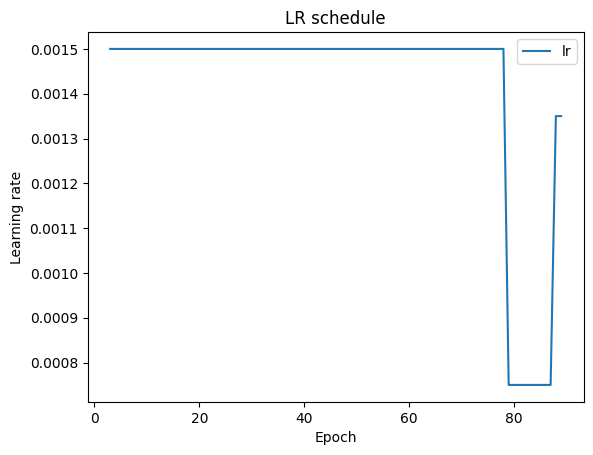


=== Learning curves for LOYO test_year=2023 ===


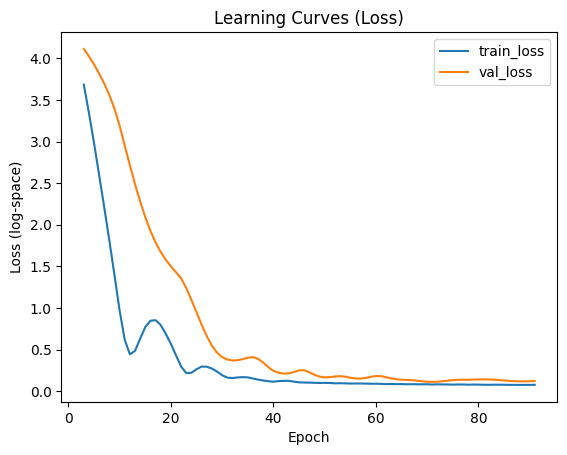

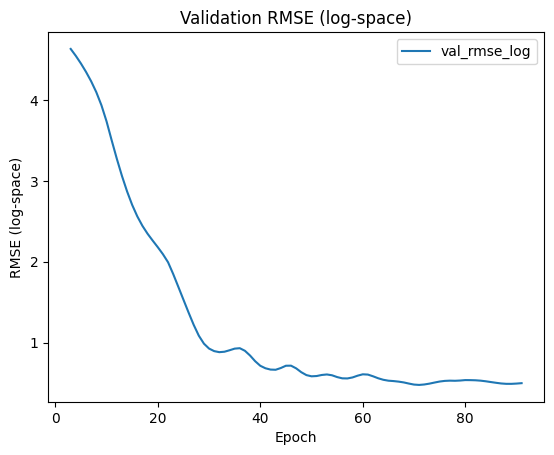

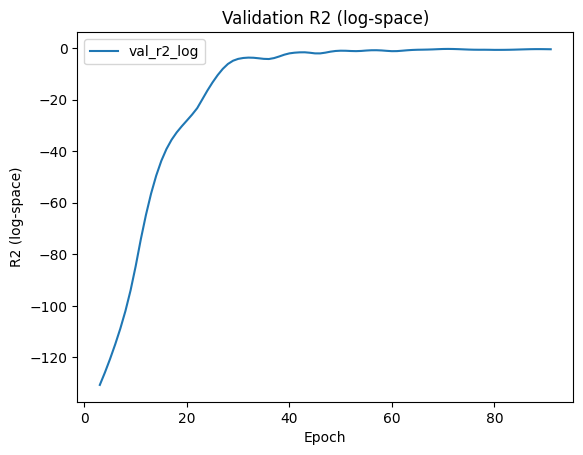

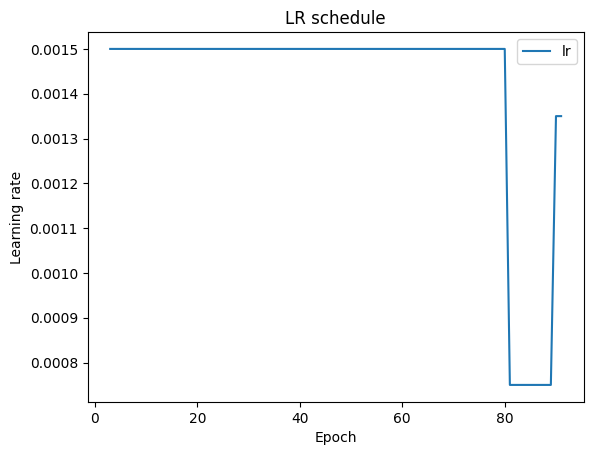


=== Learning curves for LOYO test_year=2024 ===


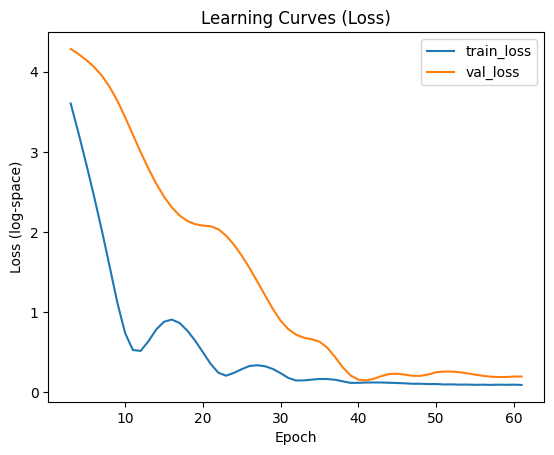

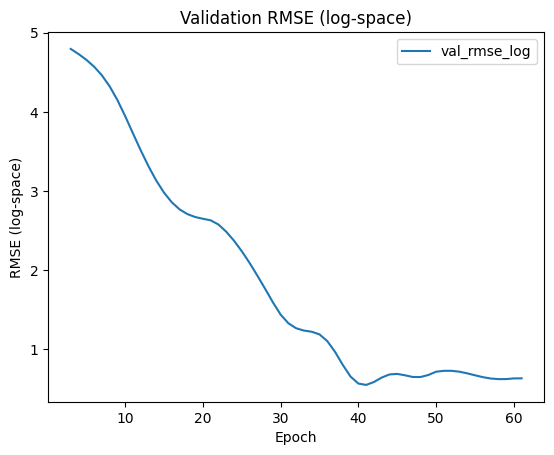

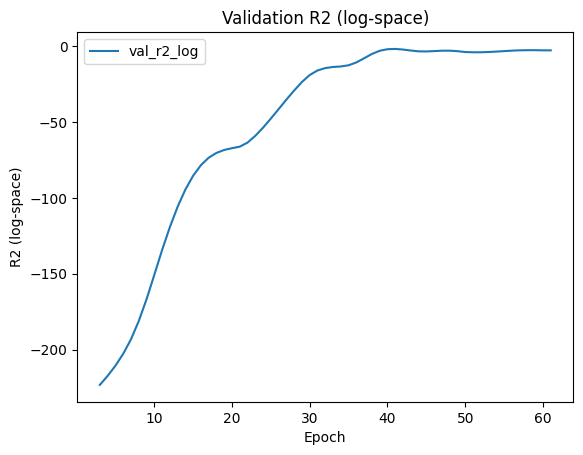

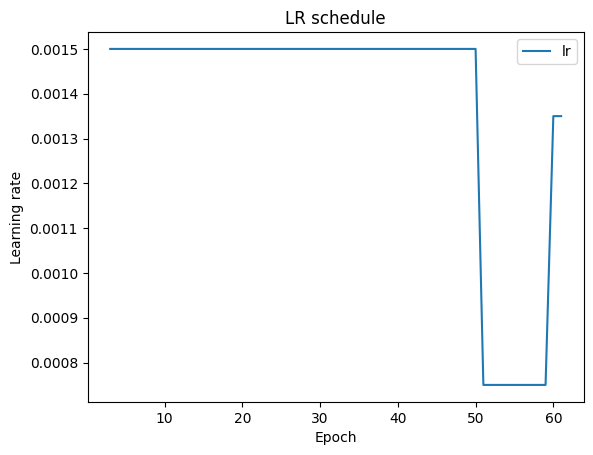

In [ ]:
luyo_df, histories = run_fixed_val_loyo(df, return_histories=True)

for yr in sorted(histories.keys()):
    print(f"\n=== Learning curves for LOYO test_year={yr} ===")
    plot_learning(histories[yr])   # your plotting function


In [ ]:
luyo_df

,test_year,val_years_used,n_train,n_val,n_test,best_val_loss_log,test_loss_log,rmse_log,mae_log,r2_log,rmse,mae,r2,corr_sq
0,2014,"[2016, 2024]",8610,2150,636,0.102743,0.139967,0.503749,0.434617,-2.690146,50.510888,44.694829,-2.108179,0.277905
1,2015,"[2014, 2016, 2024]",7786,2786,824,0.102519,0.064220,0.347285,0.254932,0.220859,35.135764,27.355459,0.300920,0.375756
2,2016,"[2014, 2024]",8610,1195,1591,0.088413,0.146624,0.544328,0.497081,-1.593661,67.398720,60.054056,-1.729471,0.226322
3,2017,"[2014, 2016, 2024]",7628,2786,982,0.140375,0.108242,0.466052,0.396036,-0.295447,51.066125,43.256782,-0.469066,0.160920
4,2018,"[2014, 2016, 2024]",8197,2786,413,0.127228,0.056071,0.335420,0.269996,0.190771,29.074563,23.533573,0.122328,0.262976
5,2019,"[2014, 2016, 2024]",7194,2786,1416,0.110841,0.078177,0.401414,0.307489,-0.058840,39.666784,31.433149,-0.080008,0.106796
6,2020,"[2014, 2016, 2024]",7394,2786,1216,0.092925,0.062263,0.353639,0.286091,0.263553,39.870133,32.995765,0.202661,0.369107
7,2021,"[2014, 2016, 2024]",6611,2786,1999,0.097653,0.068614,0.372486,0.283402,-0.102912,47.750206,38.184565,-0.192087,0.131422
8,2022,"[2014, 2016, 2024]",7812,2786,798,0.135281,0.097836,0.417511,0.359961,-0.360841,54.427353,46.034044,-0.565888,0.256157
9,2023,"[2014, 2016, 2024]",7648,2786,962,0.112021,0.046572,0.306561,0.239514,0.271802,38.046344,31.001265,0.233825,0.264648


### Wheat results:

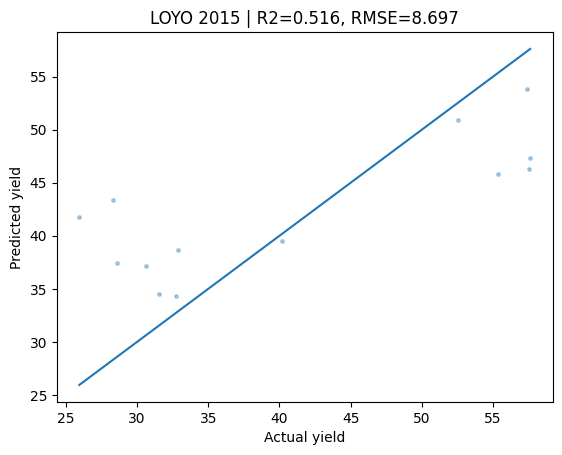

Done test_year=2015 | val_years=[2016, 2022] | RMSE=8.697 | R2=0.516 | Corr_sq=0.635


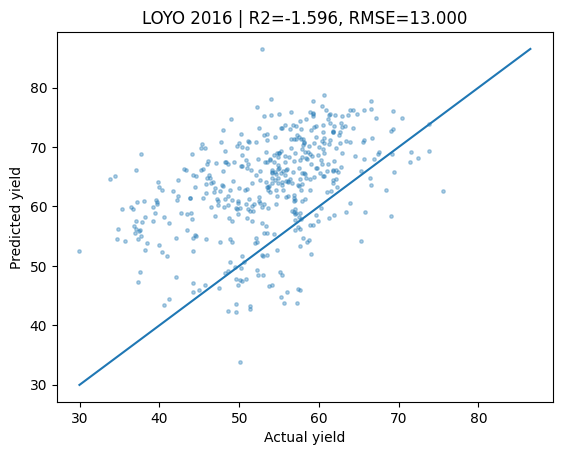

Done test_year=2016 | val_years=[2015, 2022] | RMSE=13.000 | R2=-1.596 | Corr_sq=0.198


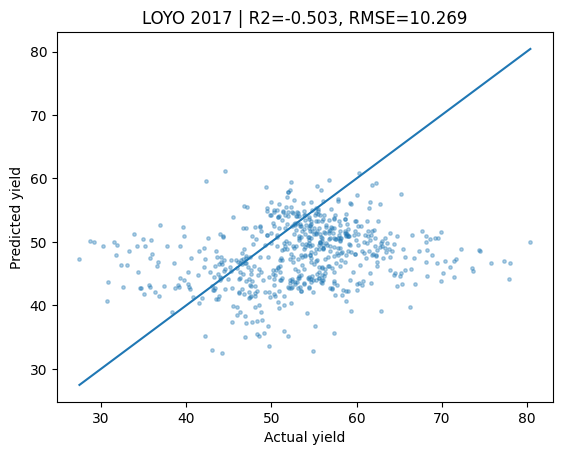

Done test_year=2017 | val_years=[2015, 2016, 2022] | RMSE=10.269 | R2=-0.503 | Corr_sq=0.043


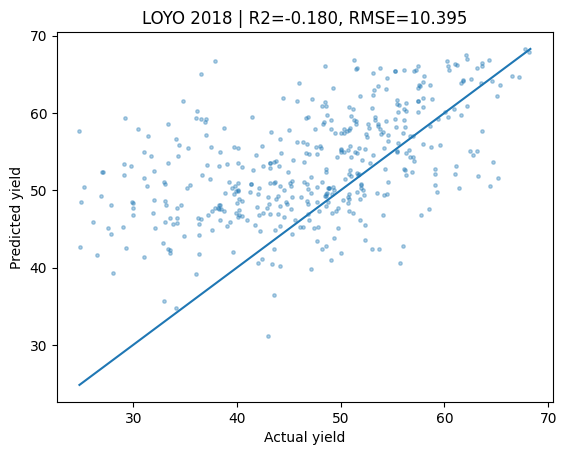

Done test_year=2018 | val_years=[2015, 2016, 2022] | RMSE=10.395 | R2=-0.180 | Corr_sq=0.269


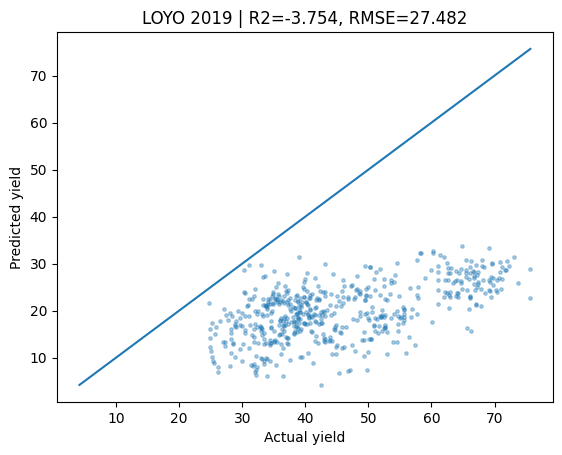

Done test_year=2019 | val_years=[2015, 2016, 2022] | RMSE=27.482 | R2=-3.754 | Corr_sq=0.314


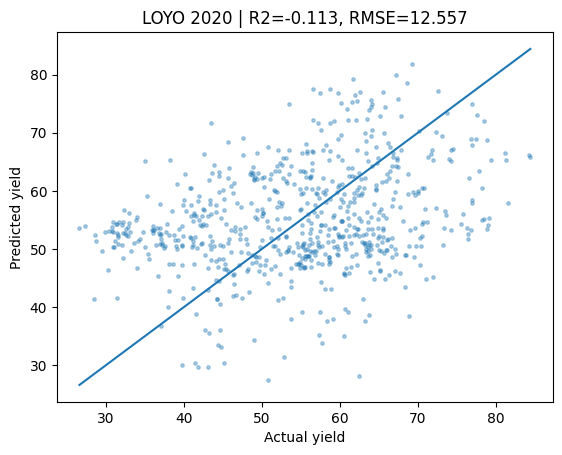

Done test_year=2020 | val_years=[2015, 2016, 2022] | RMSE=12.557 | R2=-0.113 | Corr_sq=0.089


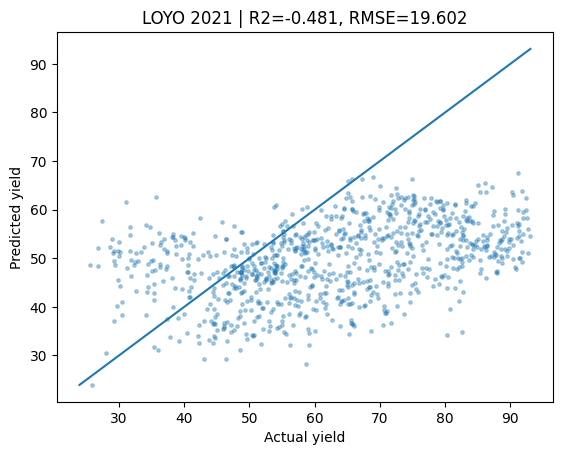

Done test_year=2021 | val_years=[2015, 2016, 2022] | RMSE=19.602 | R2=-0.481 | Corr_sq=0.178


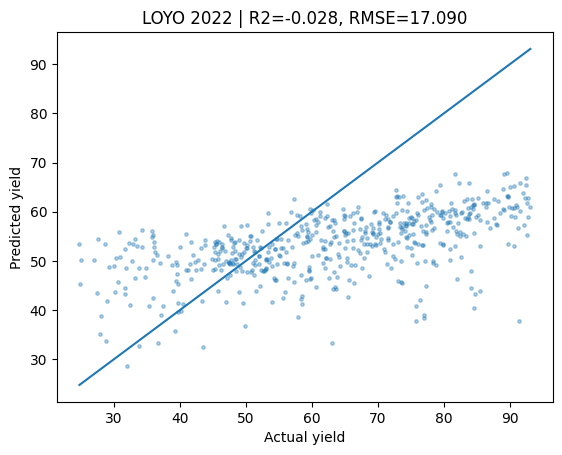

Done test_year=2022 | val_years=[2015, 2016] | RMSE=17.090 | R2=-0.028 | Corr_sq=0.331


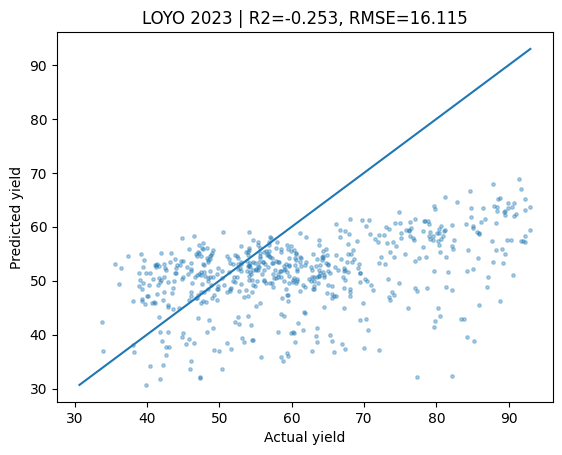

Done test_year=2023 | val_years=[2015, 2016, 2022] | RMSE=16.115 | R2=-0.253 | Corr_sq=0.204


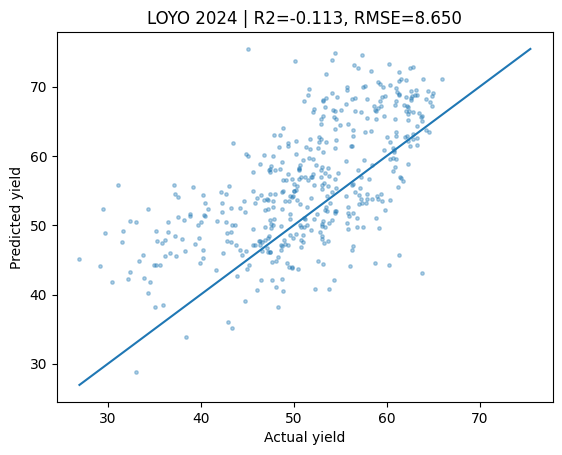

Done test_year=2024 | val_years=[2015, 2016, 2022] | RMSE=8.650 | R2=-0.113 | Corr_sq=0.400

=== Learning curves for LOYO test_year=2015 ===


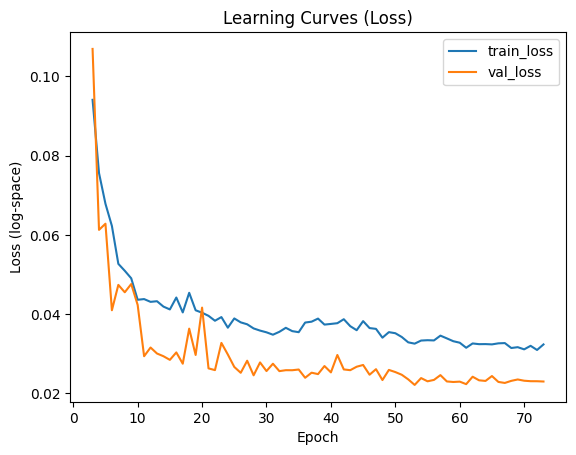

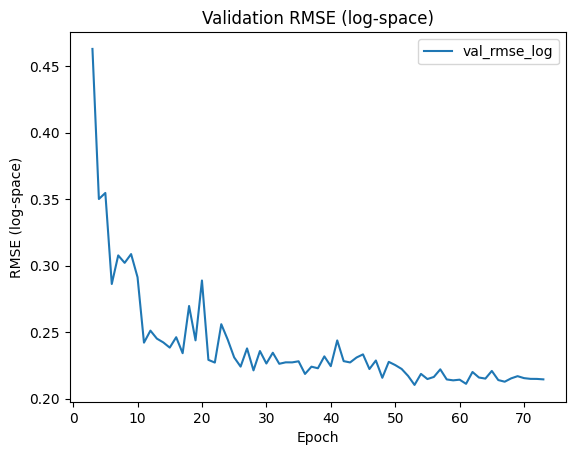

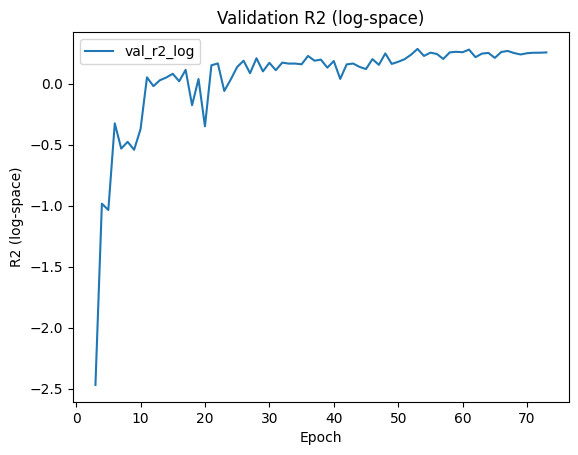

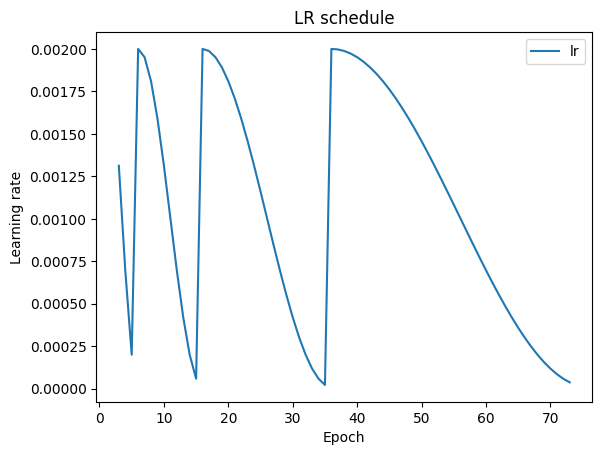


=== Learning curves for LOYO test_year=2016 ===


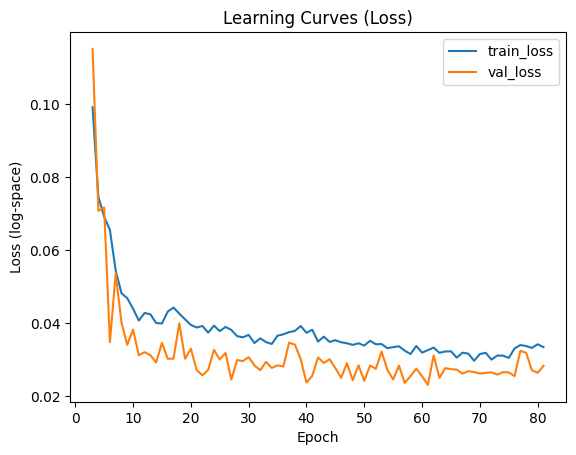

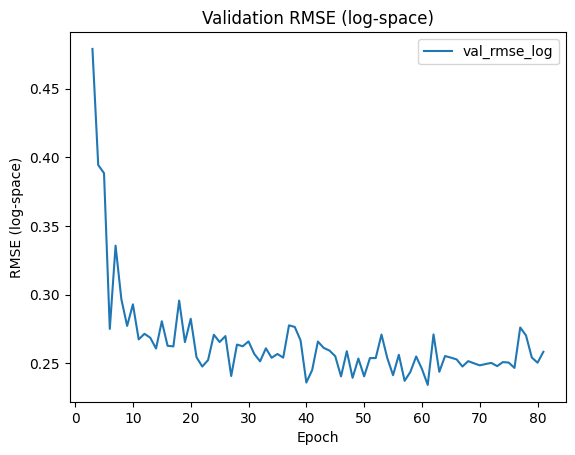

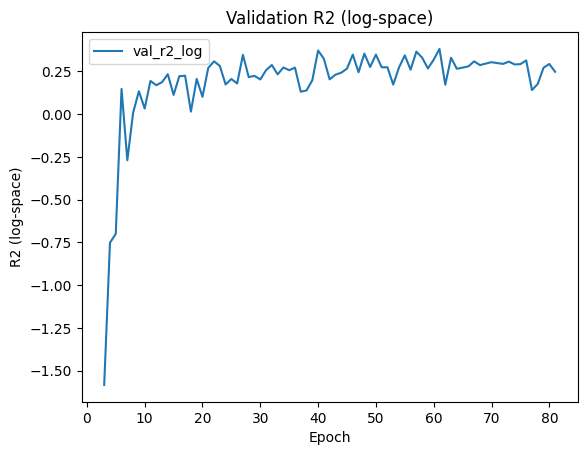

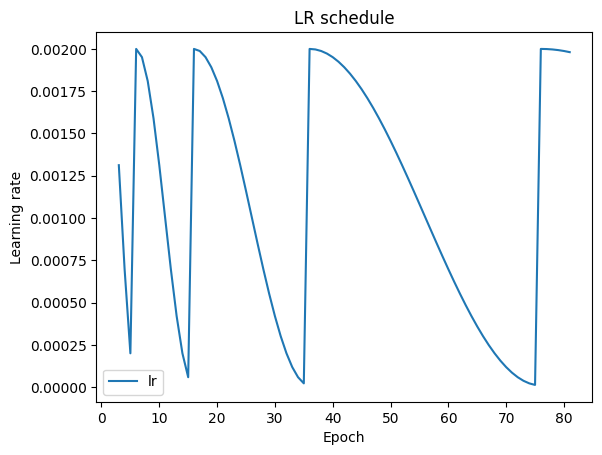


=== Learning curves for LOYO test_year=2017 ===


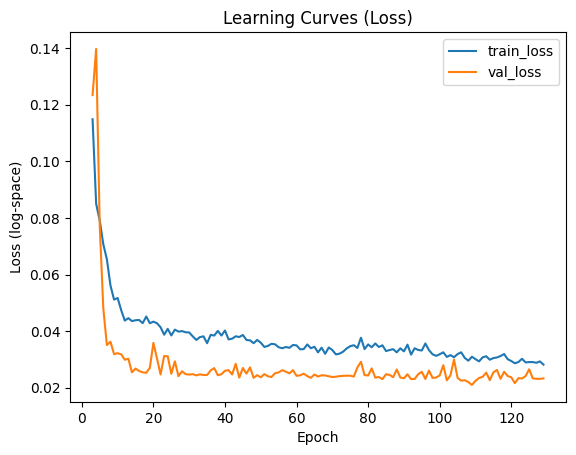

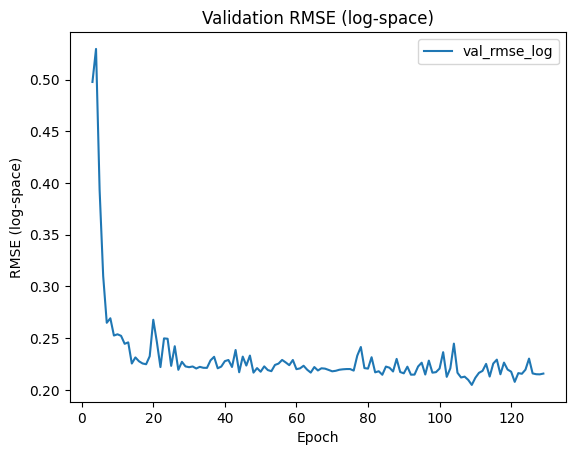

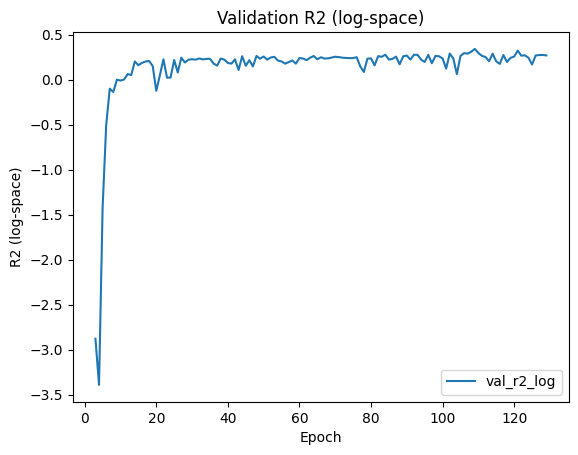

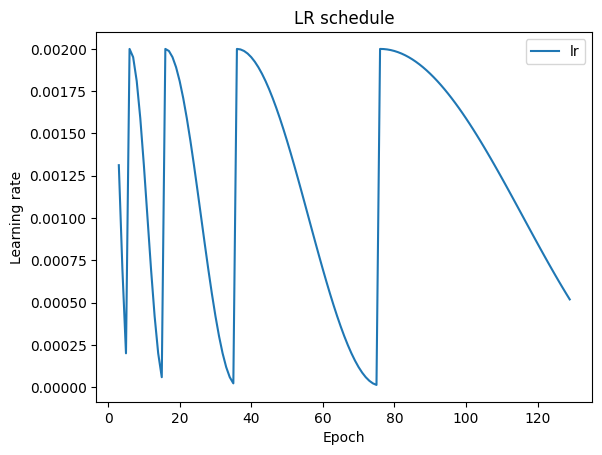


=== Learning curves for LOYO test_year=2018 ===


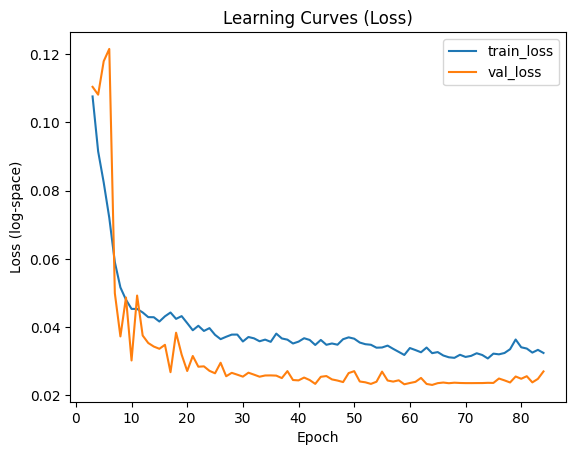

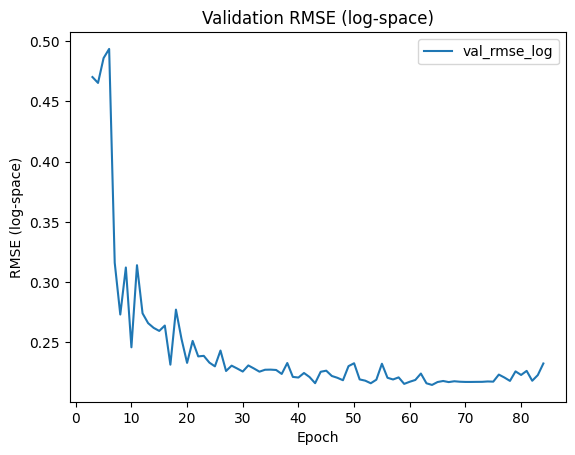

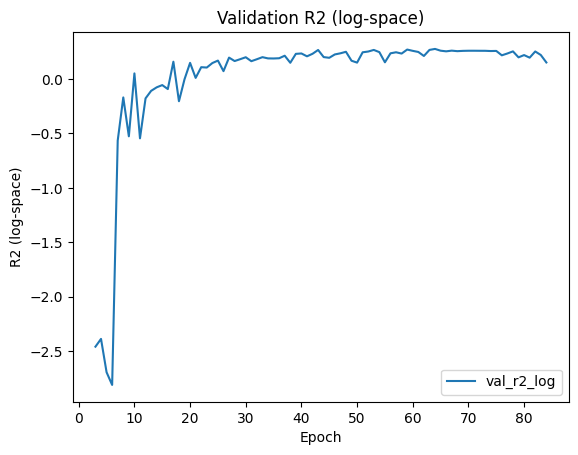

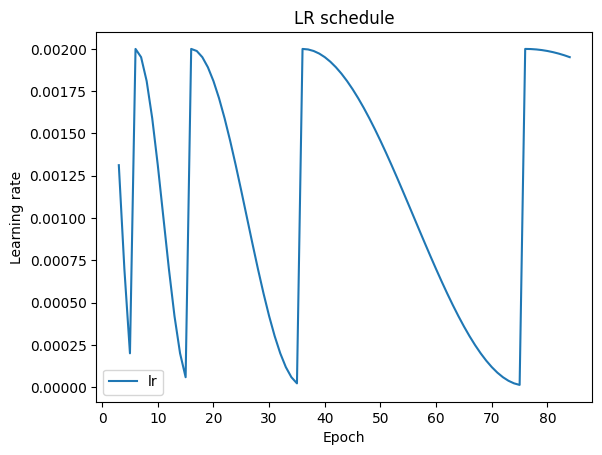


=== Learning curves for LOYO test_year=2019 ===


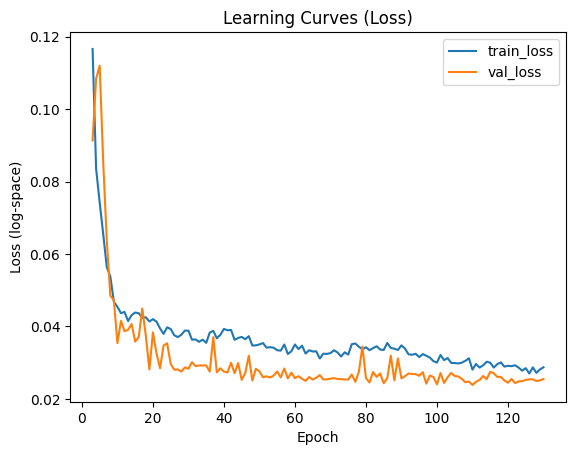

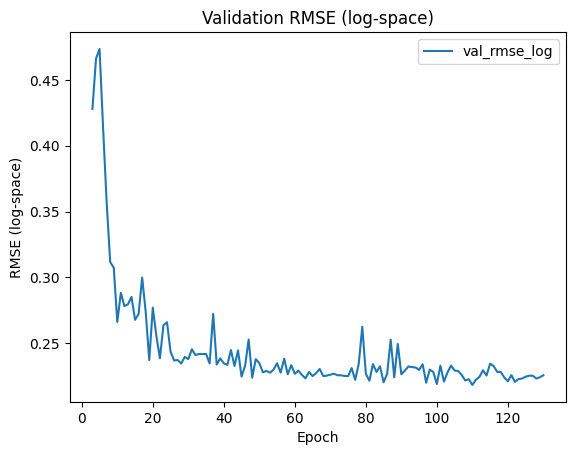

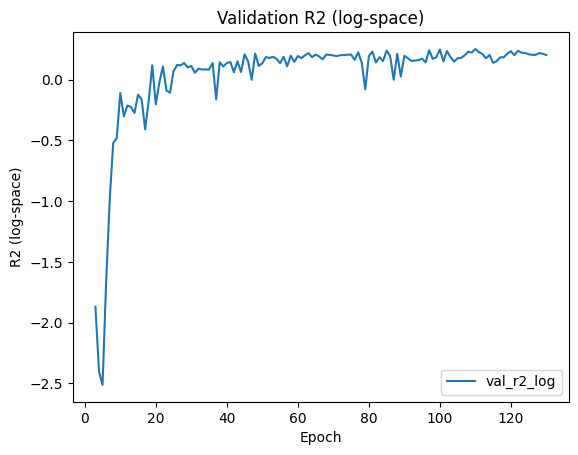

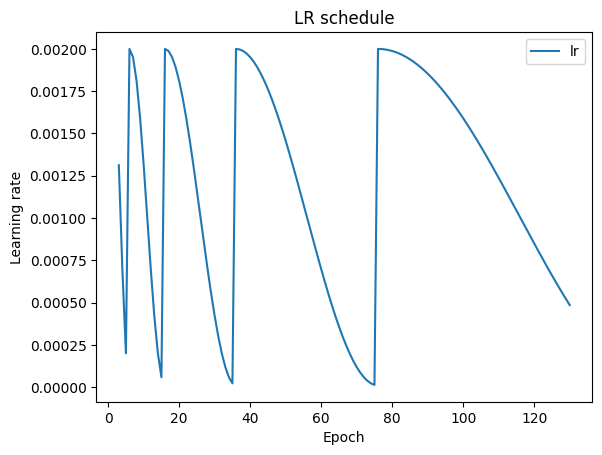


=== Learning curves for LOYO test_year=2020 ===


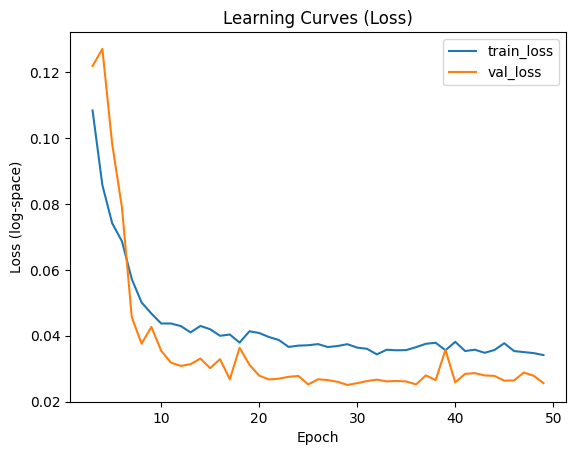

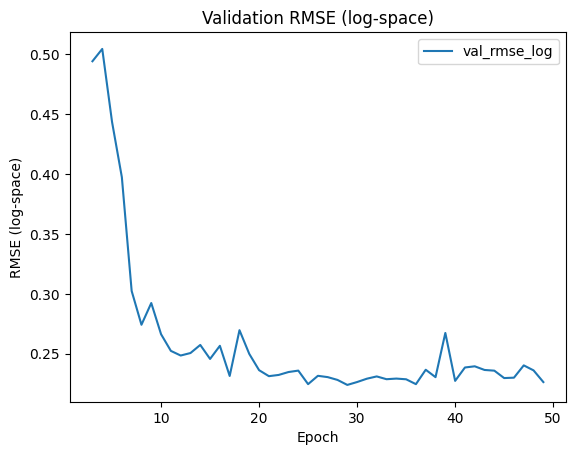

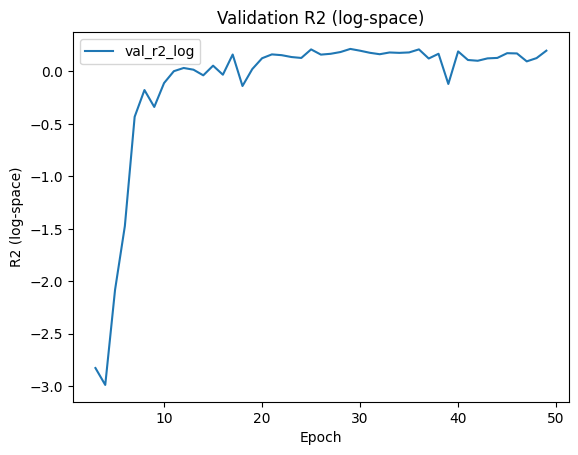

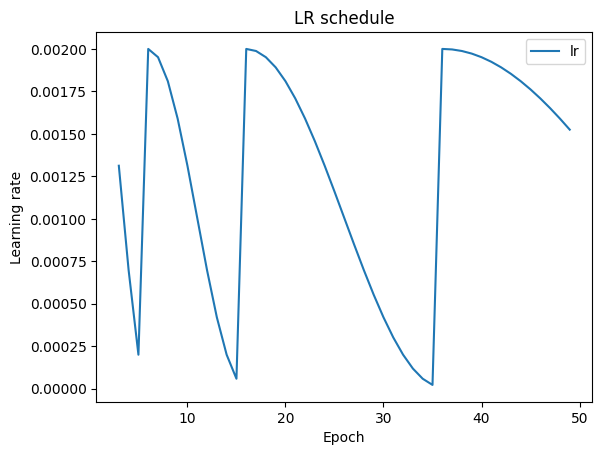


=== Learning curves for LOYO test_year=2021 ===


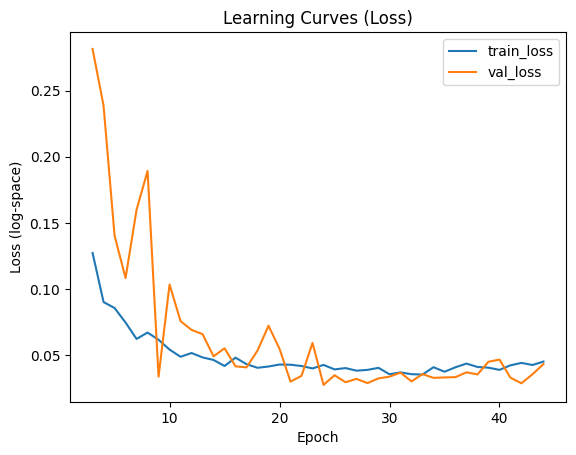

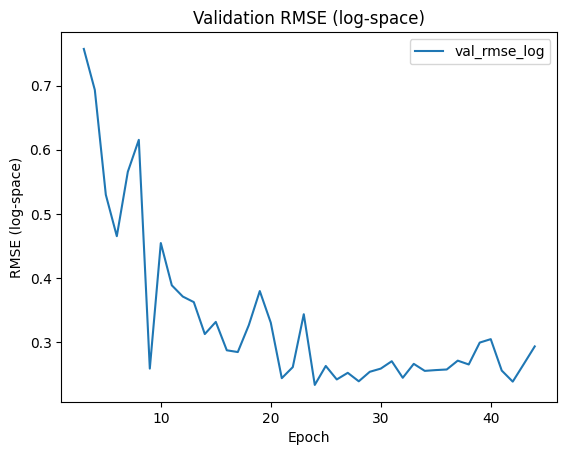

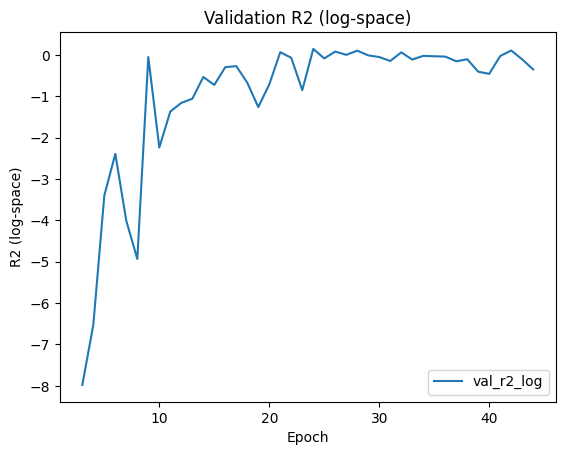

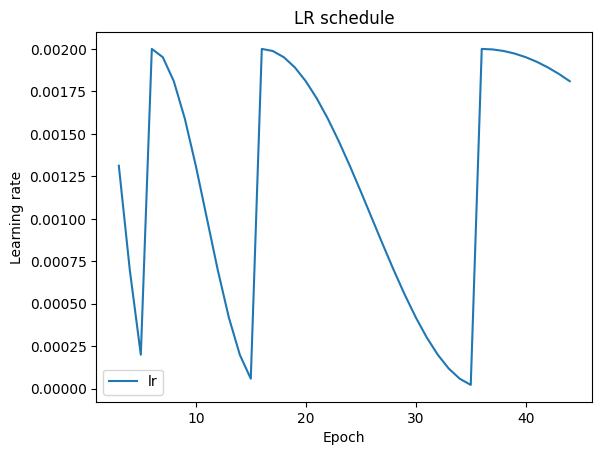


=== Learning curves for LOYO test_year=2022 ===


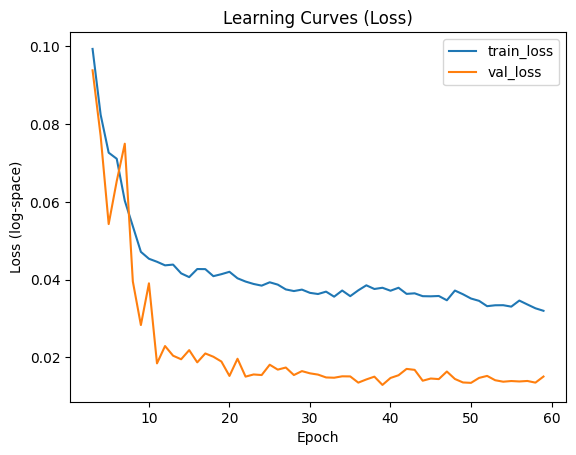

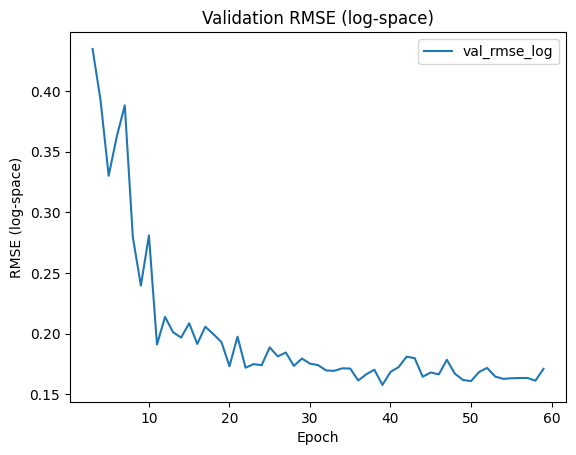

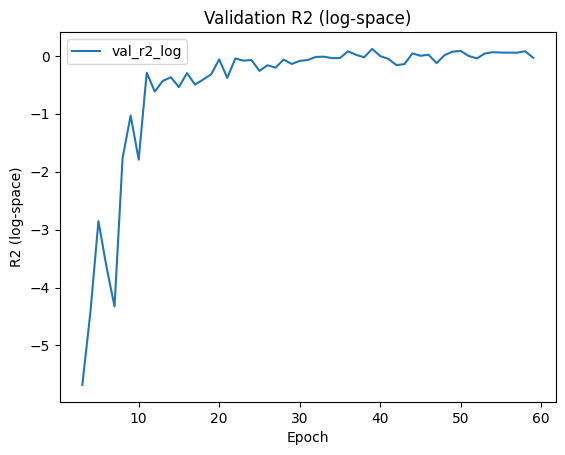

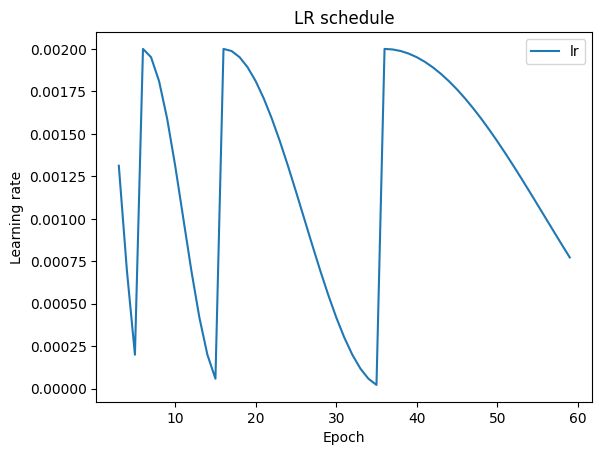


=== Learning curves for LOYO test_year=2023 ===


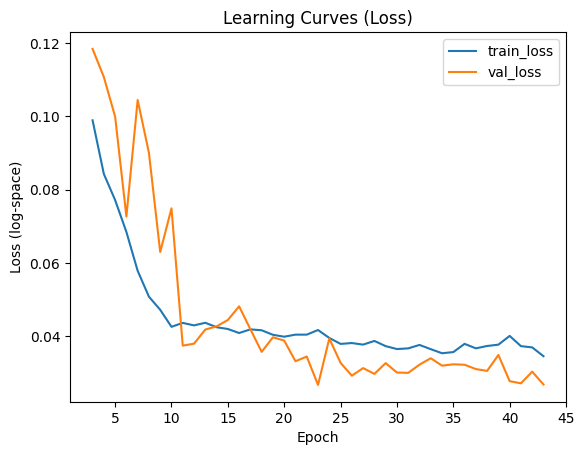

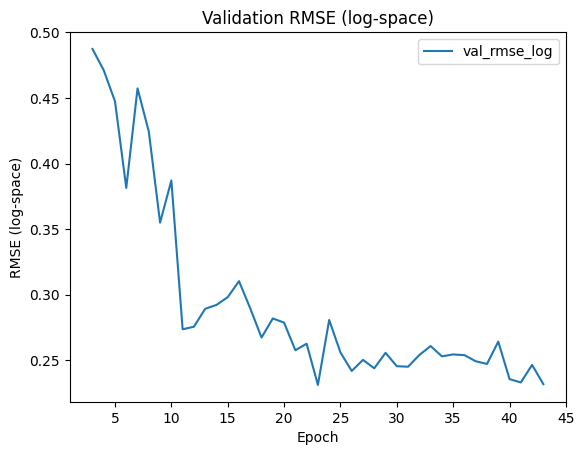

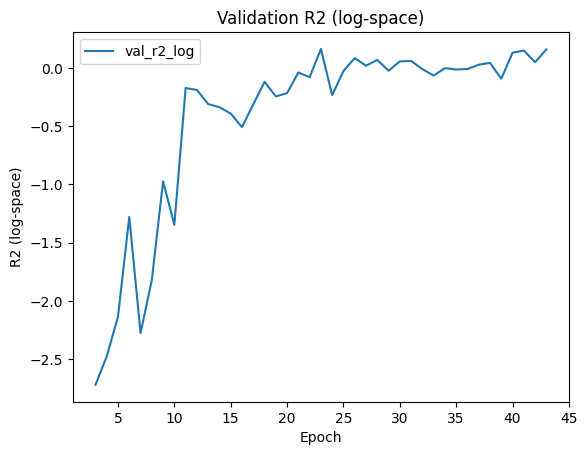

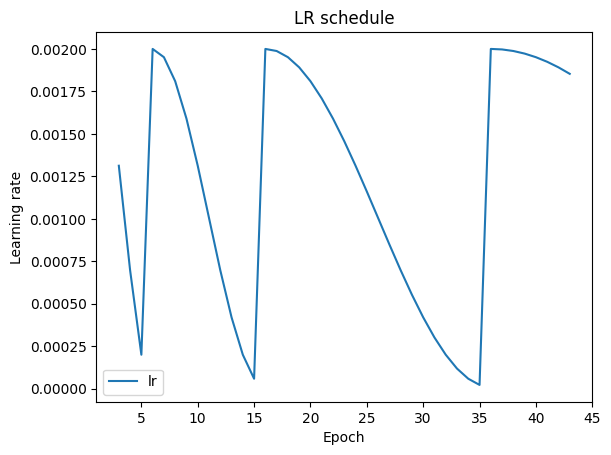


=== Learning curves for LOYO test_year=2024 ===


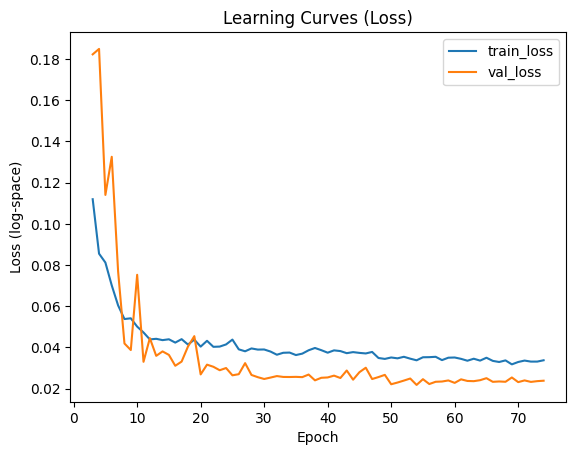

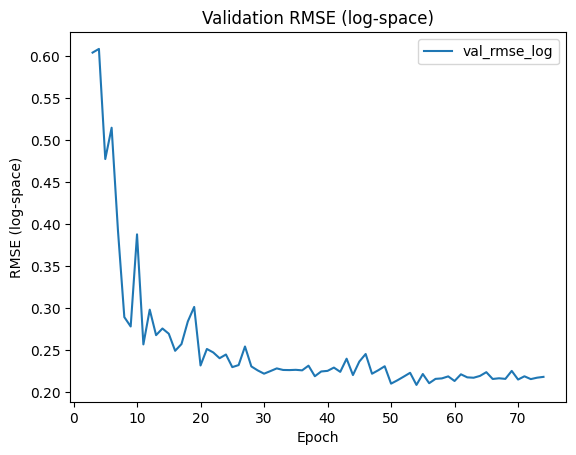

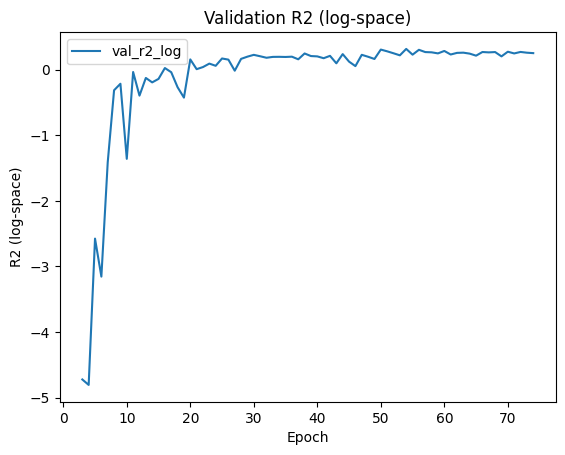

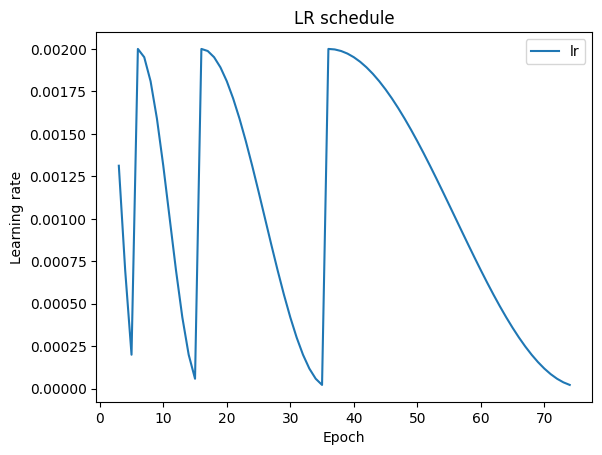

In [ ]:
luyo_df, histories = run_fixed_val_loyo(df, return_histories=True)

for yr in sorted(histories.keys()):
    print(f"\n=== Learning curves for LOYO test_year={yr} ===")
    plot_learning(histories[yr])   # your plotting function


In [ ]:
luyo_df

,test_year,val_years_used,n_train,n_val,n_test,best_val_loss_log,test_loss_log,rmse_log,mae_log,r2_log,rmse,mae,r2,corr_sq
0,2015,"[2016, 2022]",4259,1008,13,0.022160,0.024895,0.223137,0.178760,0.430173,8.696749,7.207784,0.515797,0.634657
1,2016,"[2015, 2022]",4259,571,450,0.023113,0.026435,0.229934,0.192834,-1.197679,13.000146,11.143500,-1.595862,0.198472
2,2017,"[2015, 2016, 2022]",3645,1021,614,0.020997,0.019469,0.197775,0.157496,-0.469865,10.269414,8.093876,-0.503413,0.042861
3,2018,"[2015, 2016, 2022]",3828,1021,431,0.023096,0.026451,0.230005,0.171739,-0.175916,10.395128,8.132148,-0.179915,0.269237
4,2019,"[2015, 2016, 2022]",3708,1021,551,0.023846,0.379539,0.853193,0.802291,-9.226464,27.481720,25.390326,-3.753976,0.313937
5,2020,"[2015, 2016, 2022]",3554,1021,705,0.025080,0.027662,0.243470,0.198507,-0.133273,12.557108,10.553607,-0.113158,0.089085
6,2021,"[2015, 2016, 2022]",3331,1021,928,0.027348,0.052942,0.329410,0.281034,-0.450046,19.602256,16.314104,-0.481235,0.177753
7,2022,"[2015, 2016]",4259,463,558,0.012930,0.034913,0.278555,0.232589,0.083153,17.089519,14.054952,-0.028013,0.331368
8,2023,"[2015, 2016, 2022]",3673,1021,586,0.026751,0.028773,0.263549,0.213521,-0.305499,16.115255,12.680556,-0.253157,0.203736
9,2024,"[2015, 2016, 2022]",3815,1021,444,0.021836,0.014009,0.167388,0.133268,0.020284,8.649880,7.040503,-0.112671,0.399513
